<a href="https://colab.research.google.com/github/neelkanthrawat/GNN-exercises/blob/main/Assignment_3/normalizing-flows.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 1. Two moons with an invertible Neural Network

In [41]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split

import torch.nn as nn
import torch.nn.functional as F

import numpy as np
from sklearn.metrics.pairwise import pairwise_kernels
import matplotlib.pyplot as plt

In [42]:
### modified coupling layer class
import torch
import torch.nn as nn
import torch.nn.functional as F

class CouplingLayer(nn.Module):
    def __init__(self, input_size, hidden_size):
        super(CouplingLayer, self).__init__()
        # Neural networks for the first half of the dimensions
        self.fc1 = nn.Linear(input_size // 2, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        # Translation coefficient
        self.fc3 = nn.Linear(hidden_size, input_size // 2)
        # Scaling coefficient
        self.fc4 = nn.Linear(hidden_size, input_size // 2)

    def forward(self, x):
        # Split the input into two halves
        x_a, x_b = x.chunk(2, dim=1)

        # Apply neural network to calculate coefficients
        h = F.relu(self.fc1(x_a))
        h = F.relu(self.fc2(h))
        translation = self.fc3(h)
        scaling_before_exp = torch.tanh(self.fc4(h))### taking the tanh
        scaling = torch.exp(scaling_before_exp)


        # Apply the affine transformation
        y_b = x_b * scaling + translation

        # Concatenate the transformed halves
        y = torch.cat([x_a, y_b], dim=1)
        return y, scaling_before_exp

    def backward(self, y):
        # Split the input into two halves
        y_a, y_b = y.chunk(2, dim=1)

        # Apply neural network to calculate coefficients (reverse)
        h = F.relu(self.fc1(y_a))
        h = F.relu(self.fc2(h))
        translation = self.fc3(h)
        scaling_before_exp = self.fc4(h)
        scaling = torch.exp(torch.tanh(scaling_before_exp))

        # Reverse the operations to reconstruct the original input
        x_a = y_a
        x_b = (y_b - translation) / scaling

        # Concatenate the reconstructed halves
        x = torch.cat([x_a, x_b], dim=1)
        return x

In [43]:
class RealNVP(nn.Module):
    def __init__(self, input_size, hidden_size, blocks):
        super(RealNVP, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.blocks = blocks

        # List of coupling layers
        self.coupling_layers = nn.ModuleList([
            CouplingLayer(input_size, hidden_size) for _ in range(blocks)
        ])


        # List to store orthonormal matrices
        self.orthonormal_matrices = [self._get_orthonormal_matrix(input_size) for _ in range(blocks)]

        # List to store scaling_before_exp for each block
        self.scaling_before_exp_list = []

    def _get_orthonormal_matrix(self, size):
        # Function to generate a random orthonormal matrix
        w = torch.randn(size, size)
        q, _ = torch.linalg.qr(w,'reduced')
        return q

    def forward_realnvp(self, x):
        scaling_before_exp_list = []
        for i in range(self.blocks):

            # Apply random orthonormal matrix
            x = torch.matmul(x, self.orthonormal_matrices[i])

            # Apply coupling layer
            x, scaling_before_exp = self.coupling_layers[i].forward(x)
            scaling_before_exp_list.append(scaling_before_exp)

        self.scaling_before_exp_list = scaling_before_exp_list
        return x

    def encode(self, x):
        # Encoding is the forward pass through the RealNVP model
        return self.forward_realnvp(x)

    def decode(self, z):
        # Reverse transformations for decoding
        for i in reversed(range(self.blocks)):

            # Apply coupling layer (reverse)
            z = self.coupling_layers[i].backward(z)

            # Apply random orthonormal matrix (reverse)
            z = torch.matmul(z, self.orthonormal_matrices[i].t())
        return z

    def sample(self, num_samples=1000):
        # Generate random samples from a standard normal distribution
        with torch.no_grad():
            z = torch.randn(num_samples, self.input_size)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        synthetic_samples = self.decode(z)
        return synthetic_samples

In [44]:
### defining our loss function
def calculate_loss(transformed_x, scaling_before_exp_list, dataset_length):
    """
    Calculate the loss for the RealNVP model.

    Args:
    - transformed_x (tensor): Transformed data produced by the RealNVP model.
    - scaling_before_exp_list (list): List of scaling_before_exp values for each block.
    - dataset_length (int): The length of the dataset.

    Returns:
    - loss (tensor): The calculated loss value.
    """

    # Calculate the first term of the loss (negative log-likelihood term)
    first_term = 0.5*torch.sum(transformed_x**2)

    second_term= -torch.sum(torch.cat(scaling_before_exp_list))#torch.sum(torch.stack(model.scaling_before_exp_list), dim=0)

    # Calculate the total loss
    loss = (first_term + second_term) / dataset_length

    return loss


In [45]:
import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.001, print_after=1):
    """
    Train the RealNVP model and evaluate on a validation dataset.

    Args:
    - model (RealNVP): The RealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_losses = []  # List to store training losses
    val_losses = []    # List to store validation losses

    for epoch in range(num_epochs):
        total_train_loss = 0.0

        # Training phase
        model.train()  # Set the model to training mode
        for data in train_loader:
            inputs= data

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass (encoding)
            encoded = model.encode(inputs)

            # Loss calculation
            train_loss = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Backward pass (gradient computation)
            train_loss.backward()

            ### added recently: clip the gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)  # Adjust max_norm as needed

            # Update weights
            optimizer.step()

            total_train_loss += train_loss.item()

        # Average training loss for the epoch
        average_train_loss = total_train_loss / len(train_loader)

        # Validation phase
        if val_loader is not None:
            model.eval()  # Set the model to evaluation mode
            total_val_loss = 0.0
            with torch.no_grad():
                for val_data in val_loader:
                    val_inputs = val_data

                    # Forward pass (encoding) for validation
                    val_encoded = model.encode(val_inputs)

                    # Loss calculation for validation
                    val_loss = calculate_loss(val_encoded, model.scaling_before_exp_list, len(val_loader))

                    total_val_loss += val_loss.item()

            # Average validation loss for the epoch
            average_val_loss = total_val_loss / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss}, Validation Loss: {average_val_loss}")

            # Append losses to the lists
            train_losses.append(average_train_loss)
            val_losses.append(average_val_loss)

        # Set the model back to training mode
        model.train()

    print("Training complete")

    return train_losses, val_losses

### Some helper functions for plotting

In [46]:
# function to plot training and validation losses
def plot_losses(epoch_train_losses, epoch_val_losses, want_log_scale=True):
    """
    Plot training and validation losses over epochs on a log scale.

    Args:
        epoch_train_losses (list): List of training losses for each epoch.
        epoch_val_losses (list): List of validation losses for each epoch.
    """
    epochs = range(1, len(epoch_train_losses) + 1)

    plt.plot(epochs, epoch_train_losses, label='Training Loss')
    plt.plot(epochs, epoch_val_losses, label='Validation Loss')

    if want_log_scale:
      plt.yscale('log')  # Set the y-axis to a logarithmic scale
      plt.title('Training and Validation reconstruction Losses (Log Scale)',fontsize=10)
    else:
      plt.title('Training and Validation reconstruction Losses',fontsize=10)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

In [47]:
def visualize_synthetic_data(original_data, synthetic_data):
    """
    Scatter plot to visualize the original and synthetic data in 2D.

    Args:
    - original_data (torch.Tensor): Original data (2D).
    - synthetic_data (torch.Tensor): Synthetic data (2D).

    Returns:
    - None: Displays the scatter plot.
    """
    # Ensure both original and synthetic data are converted to numpy arrays
    with torch.no_grad():
        # Convert PyTorch tensors to numpy arrays
        original_np = original_data.numpy()
        synthetic_np = synthetic_data.numpy()

        # Scatter plot of original and synthetic data
        plt.scatter(original_np[:, 0], original_np[:, 1], label='Original', alpha=0.5)
        plt.scatter(synthetic_np[:, 0], synthetic_np[:, 1], label='Synthetic', alpha=0.5)

        # Add labels and title
        plt.xlabel("dimension-1")
        plt.ylabel("dimension-2")
        plt.title('Original vs Synthetic Data')

        # Add legend
        plt.legend()

        # Display the plot
        #plt.show()


In [48]:
def plot_code_distribution(model, test_loader, num_samples=1000):
    """
    Plot the code distribution obtained by applying the trained RealNVP model to a test dataset.

    Args:
    - model (RealNVP): Trained RealNVP model.
    - test_loader (DataLoader): DataLoader for the test dataset.
    - num_samples (int): Number of samples to visualize.

    Returns:
    None (displays the plot).
    """
    model.eval()  # Set the model to evaluation mode

    with torch.no_grad():
        # Concatenate multiple batches to obtain more samples
        test_samples = torch.cat([batch for batch in test_loader], dim=0)

        # Assuming your model has an `encode` method
        code_samples = model.encode(test_samples[:num_samples])

        # Convert PyTorch tensor to numpy array
        code_np = code_samples.numpy()

        # Scatter plot of code distribution
        plt.scatter(code_np[:, 0], code_np[:, 1], label='Code Distribution', alpha=0.5)
        plt.xlabel("Code Dimension 1")
        plt.ylabel("Code Dimension 2")
        plt.title('Code Distribution')
        plt.legend()
        #plt.show()

### loading the two moons dataset

In [49]:
dataset_sizes = [ 100, 200,300,400,500,600,700,800,900, 1000, 5000]

# Generate datasets of varying sizes
train_datasets = {}
val_datasets = {}
datasets = {}

for size in dataset_sizes:
    X, y = make_moons(n_samples=size, noise=0.1)
    datasets[size] = {'X': X, 'y': y}
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    train_datasets[size] = {'X': torch.FloatTensor(X_train), 'y': y_train}
    val_datasets[size] = {'X': torch.FloatTensor(X_test), 'y': y_test}

# # Visualize the training datasets
# plt.figure(figsize=(12, 8))

# for i, size in enumerate(dataset_sizes, 1):
#     plt.subplot(2, 2, i)
#     plt.scatter(datasets[size]['X'][:, 0], datasets[size]['X'][:, 1], c=datasets[size]['y'])
#     plt.title(f'Dataset Size: {size}')

# plt.show()


shape of the data_considered
torch.Size([3500, 2])
Epoch 1/10, Training Loss: -0.07387213392093227, Validation Loss: -0.3300201605728015
Epoch 2/10, Training Loss: -0.15434557619419964, Validation Loss: -0.329511248843467
Epoch 3/10, Training Loss: -0.15580285277048295, Validation Loss: -0.3389046517141322
Epoch 4/10, Training Loss: -0.18084983942522245, Validation Loss: -0.41052529540784816
Epoch 5/10, Training Loss: -0.18261600595644928, Validation Loss: -0.42160974989863154
Epoch 6/10, Training Loss: -0.18880434452810071, Validation Loss: -0.44792577307275
Epoch 7/10, Training Loss: -0.1900858759541403, Validation Loss: -0.3798304118136776
Epoch 8/10, Training Loss: -0.1967001166427508, Validation Loss: -0.3598954859387843
Epoch 9/10, Training Loss: -0.1921625217422843, Validation Loss: -0.40504698582152104
Epoch 10/10, Training Loss: -0.1982904363423586, Validation Loss: -0.4656245489703848
Training complete


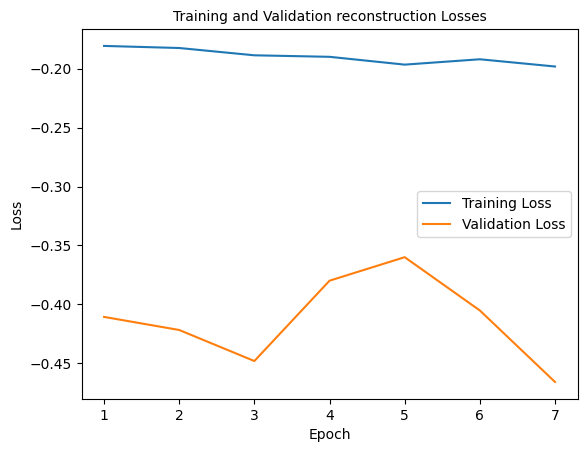

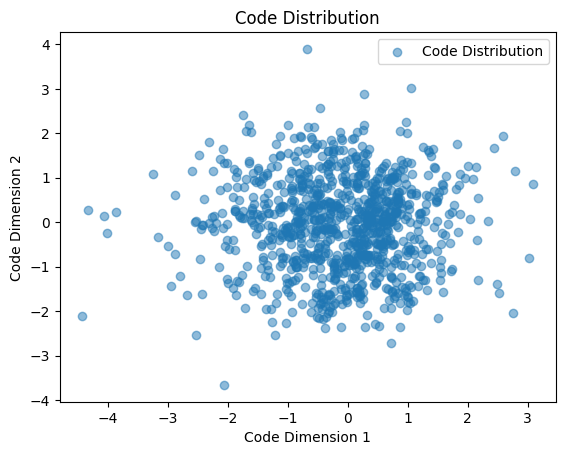

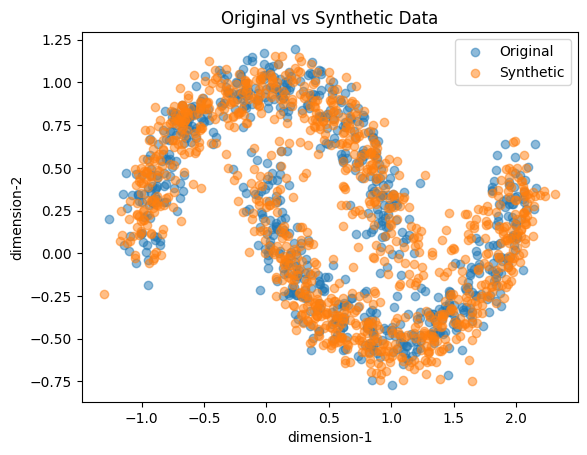

In [50]:
### creating the dataloader for the make moons dataset
from torch.utils.data import DataLoader, TensorDataset

### Trial run
import numpy as np
input_size=2
hidden_size=200### do I really need this to be this large?
blocks=10 ####### larger number of blocks ensures that the code distribution is indeed gaussian
print_after=1

#### data for the two-moons model
dataset_size=5000
batch_size=32
data_considered=train_datasets[dataset_size]['X']
print("shape of the data_considered"); print(data_considered.shape)
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=batch_size, shuffle=True)
val_loader= torch.utils.data.DataLoader(val_datasets[dataset_size]['X'], batch_size=batch_size, shuffle=True)
####

### instantiate the model
model= RealNVP(input_size=2, hidden_size= hidden_size, blocks=blocks)

## train the model
train_losses, val_losses= train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.0001, print_after=1)
#train_inn(model, train_loader, num_epochs=500, lr=0.01, print_after=10)
#1. 0.00005 num_epochs=20,dataset_size=5000, batchsize=64: right now I have kept blocks=10: code distribution was more gaussian and generated data was comparitively better

# plotting the loss
plot_losses(train_losses[3:], val_losses[3:], want_log_scale=0)
plt.show()

# Example usage:
plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
plt.show()

### plot the synthetic data and the original data
synthetic_data=model.sample(num_samples=1000)
visualize_synthetic_data(train_datasets[1000]['X'], synthetic_data)
plt.show()

### 1.1 Effect of number of coupling blocks in the network:

In [51]:
import numpy as np
from sklearn.metrics.pairwise import pairwise_kernels
import matplotlib.pyplot as plt

def compute_mmd(X, Y, kernel='rbf', gamma=None):
    """
    Compute Maximum Mean Discrepancy (MMD) between two datasets.

    Parameters:
    - X, Y: Input datasets (numpy arrays).
    - kernel: Kernel function to use ('linear', 'rbf', etc.).
    - gamma: Kernel coefficient for 'rbf' kernel (if applicable).

    Returns:
    - mmd: Maximum Mean Discrepancy value.
    """

    X = X.detach().numpy() if isinstance(X, torch.Tensor) else X
    Y = Y.detach().numpy() if isinstance(Y, torch.Tensor) else Y

    # Compute pairwise kernel matrices
    K_xx = pairwise_kernels(X, X, metric=kernel, gamma=gamma)
    K_yy = pairwise_kernels(Y, Y, metric=kernel, gamma=gamma)
    K_xy = pairwise_kernels(X, Y, metric=kernel, gamma=gamma)

    # Compute MMD
    mmd = np.mean(K_xx) + np.mean(K_yy) - 2 * np.mean(K_xy)
    return mmd

For fixed dataset_size=5000,  hidden_size=200, lr=0.0001, num_epochs=10
shape of the data_considered
torch.Size([3500, 2])

Training for blocks=1
Training complete


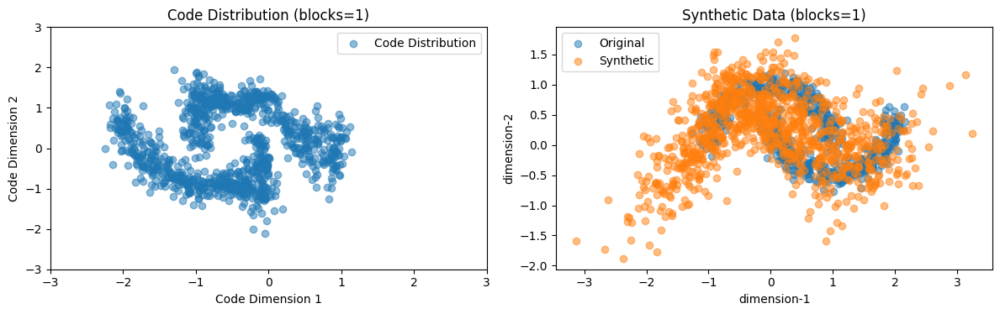

MMD Score (blocks=1): 0.0511

Training for blocks=2
Training complete


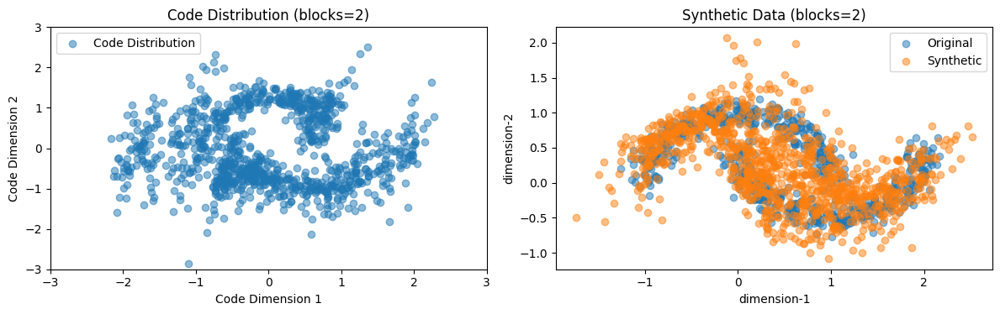

MMD Score (blocks=2): 0.0019

Training for blocks=10
Training complete


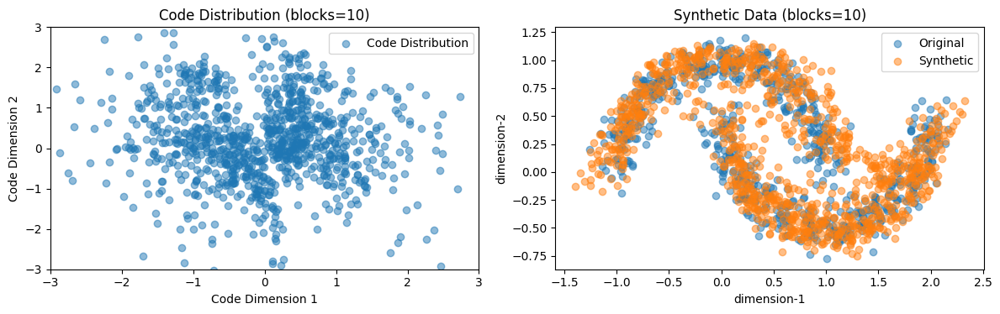

MMD Score (blocks=10): 0.0046

Training for blocks=15
Training complete


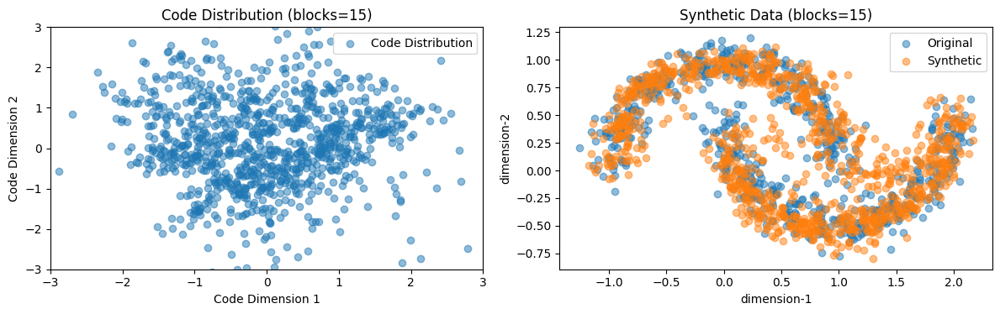

MMD Score (blocks=15): 0.0047


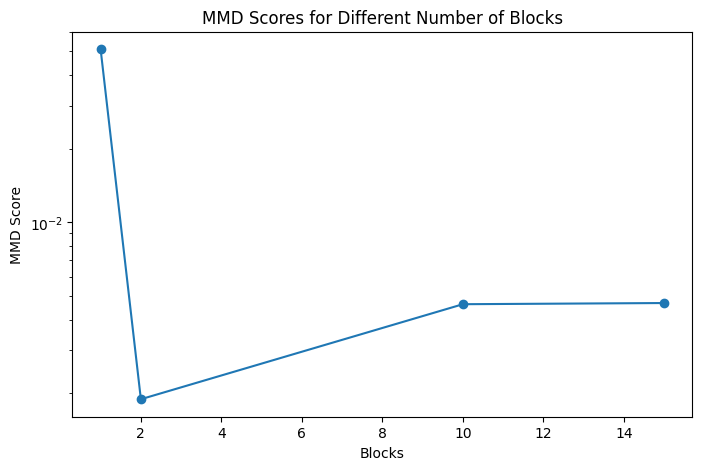

In [52]:
### Input_size=2, hidden_size=200, lr=0.0001, num_epochs=10: Fixed
def train_and_plot_for_different_block_sizes(blocks_values, train_loader, val_loader):
    results = []

    for blocks in blocks_values:
        print(f"\nTraining for blocks={blocks}")
        # Instantiate the model
        model = RealNVP(input_size=2, hidden_size=200, blocks=blocks)

        # Train the model
        train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.0001, print_after=100)

        # Plot code distribution
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.xlim(-3,3)
        plt.ylim(-3,3)
        plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
        plt.title(f'Code Distribution (blocks={blocks})')

        # Plot synthetic data
        plt.subplot(1, 2, 2)
        synthetic_data = model.sample(num_samples=1000)
        visualize_synthetic_data(train_datasets[1000]['X'], synthetic_data)
        plt.title(f'Synthetic Data (blocks={blocks})')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

        # # Calculate MMD score
        mmd_value = compute_mmd(val_loader.dataset, synthetic_data)
        print(f'MMD Score (blocks={blocks}): {mmd_value:.4f}')

        results.append((blocks, mmd_value))

    # # Plot MMD scores
    plt.figure(figsize=(8, 5))
    blocks, mmd_values = zip(*results)
    plt.plot(blocks, mmd_values, marker='o')
    plt.title('MMD Scores for Different Number of Blocks')
    plt.yscale('log')
    plt.xlabel('Blocks')
    plt.ylabel('MMD Score')
    plt.show()


######### for different coupling blocks


dataset_size=5000
print(f"For fixed dataset_size={dataset_size},  hidden_size=200, lr=0.0001, num_epochs=10")
batch_size=32
data_considered=train_datasets[dataset_size]['X']
print("shape of the data_considered"); print(data_considered.shape)
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=batch_size, shuffle=True)
val_loader= torch.utils.data.DataLoader(val_datasets[dataset_size]['X'], batch_size=batch_size, shuffle=True)
####

blocks_values_to_try = [1,2,10,15]
train_and_plot_for_different_block_sizes(blocks_values_to_try, train_loader, val_loader)


### Observation:

1. Number of coupling blocks:

    1. We observed that the higher number of coupling blocks ensures that the code distribution is gaussian. We also observed improvement in the quality of synthetic data.

### 1.2 Effect of training set size

For fixed number of blocks=10,  hidden_size=200, lr=0.0001, num_epochs=10

Training for dataset_size=100
Training complete


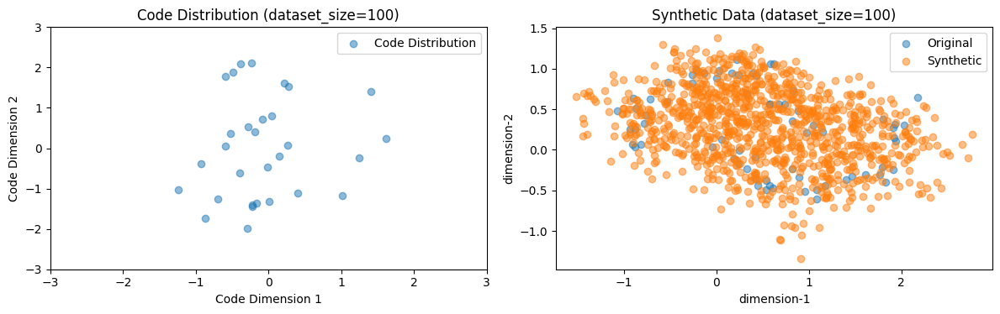

MMD Score (dataset_size=100): 0.0141

Training for dataset_size=200
Training complete


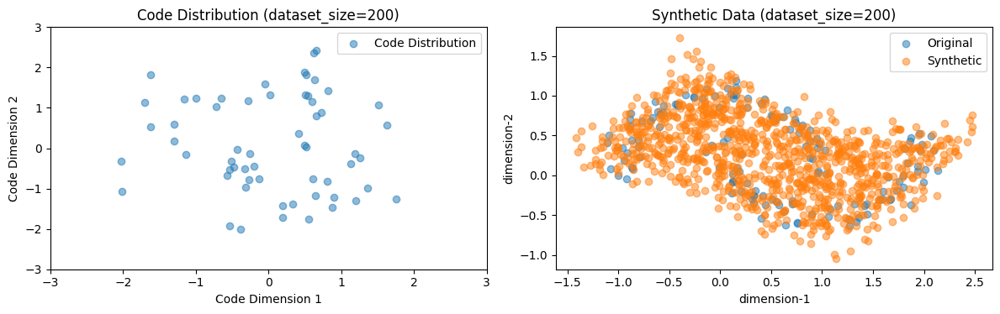

MMD Score (dataset_size=200): 0.0041

Training for dataset_size=300
Training complete


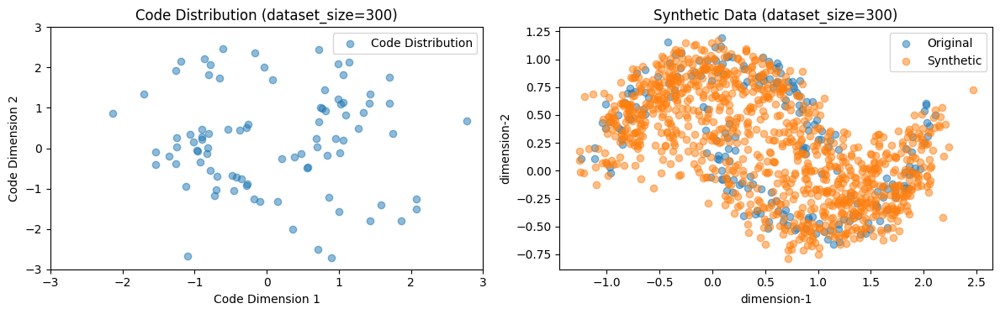

MMD Score (dataset_size=300): 0.0104

Training for dataset_size=400
Training complete


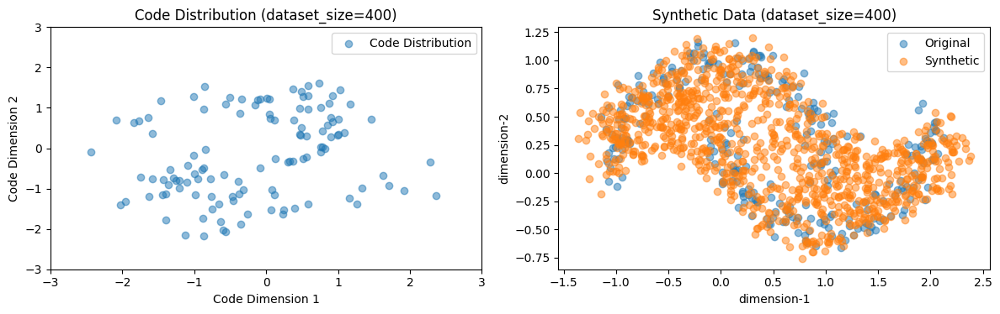

MMD Score (dataset_size=400): 0.0065

Training for dataset_size=500
Training complete


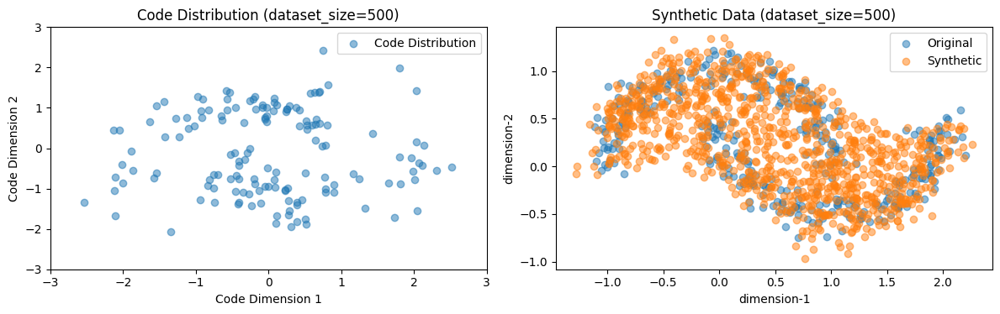

MMD Score (dataset_size=500): 0.0025

Training for dataset_size=600
Training complete


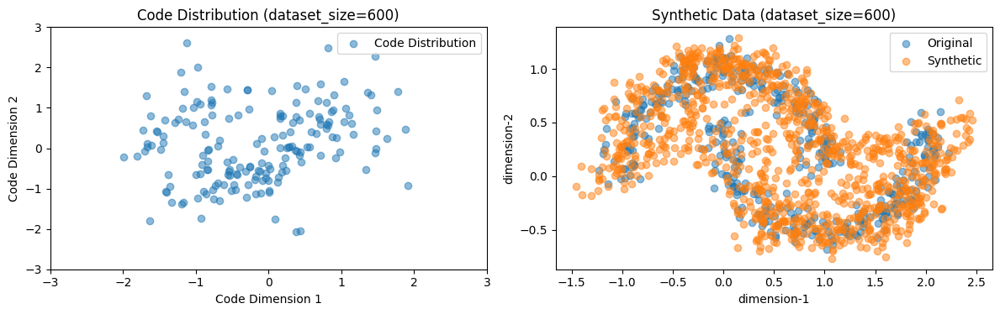

MMD Score (dataset_size=600): 0.0074

Training for dataset_size=700
Training complete


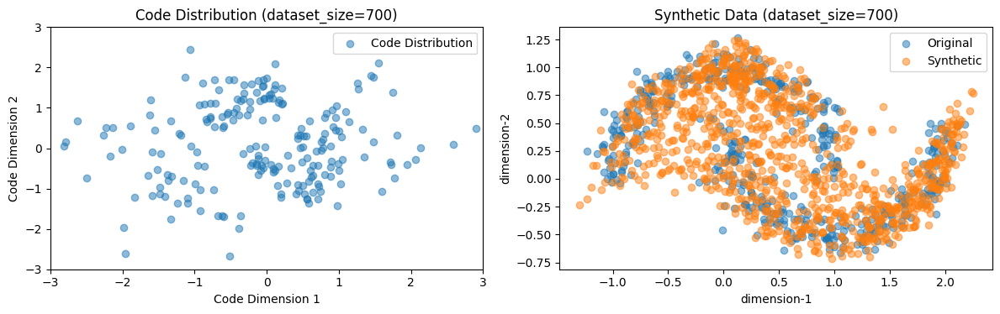

MMD Score (dataset_size=700): 0.0027

Training for dataset_size=800
Training complete


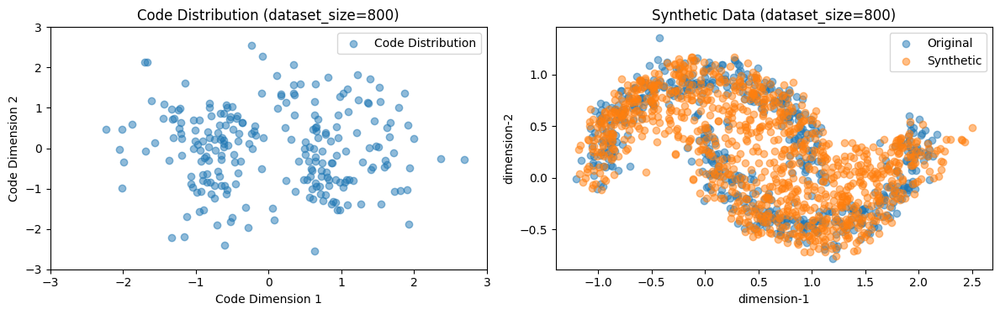

MMD Score (dataset_size=800): 0.0011

Training for dataset_size=900
Training complete


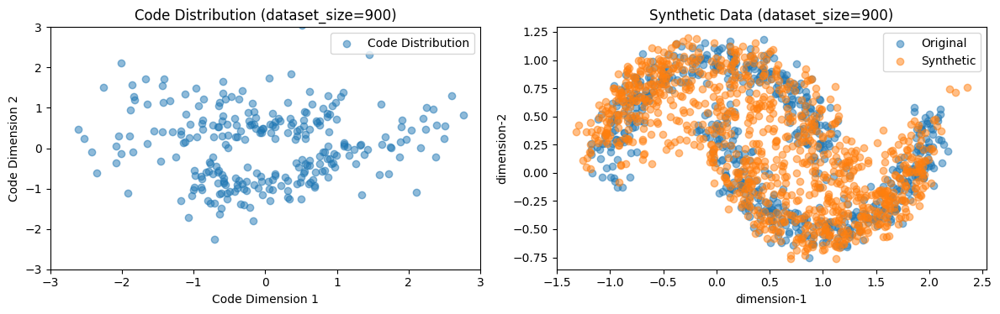

MMD Score (dataset_size=900): 0.0018

Training for dataset_size=1000
Training complete


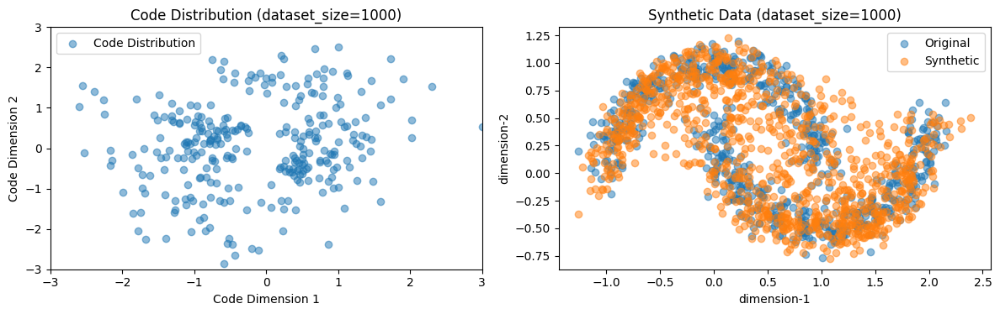

MMD Score (dataset_size=1000): 0.0041

Training for dataset_size=5000
Training complete


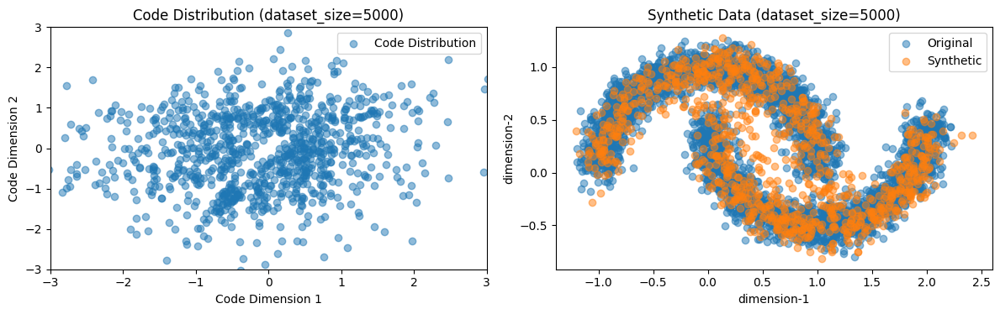

MMD Score (dataset_size=5000): 0.0036


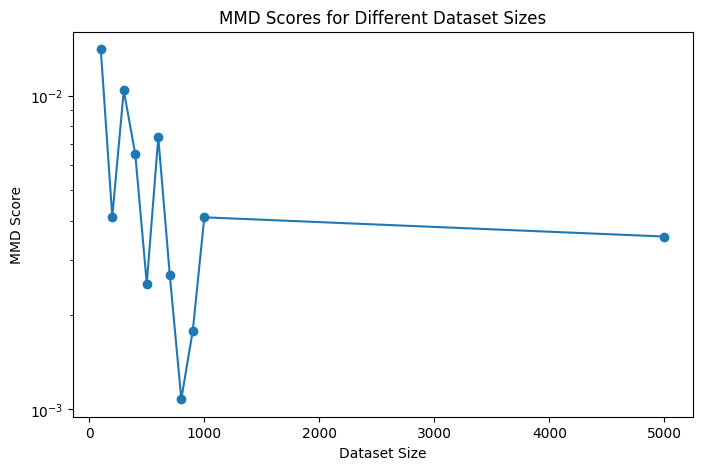

In [53]:
def train_and_plot_for_different_dataset_sizes(dataset_sizes, train_loader, val_loader):
    results = []

    for dataset_size in dataset_sizes:
        print(f"\nTraining for dataset_size={dataset_size}")

        # Instantiate the model
        model = RealNVP(input_size=2, hidden_size=200, blocks=10)  # Fix other parameters

        # Create data loader for the current dataset size
        data_considered = train_datasets[dataset_size]['X']
        train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
        val_loader = torch.utils.data.DataLoader(val_datasets[dataset_size]['X'], batch_size=32, shuffle=True)

        # Train the model
        train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.0001, print_after=100)

        # Plot code distribution
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.xlim(-3, 3)
        plt.ylim(-3, 3)
        plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
        plt.title(f'Code Distribution (dataset_size={dataset_size})')

        # Plot synthetic data
        plt.subplot(1, 2, 2)
        synthetic_data = model.sample(num_samples=1000)
        visualize_synthetic_data(train_datasets[dataset_size]['X'], synthetic_data)
        plt.title(f'Synthetic Data (dataset_size={dataset_size})')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

        # Calculate MMD score
        mmd_value = compute_mmd(val_loader.dataset, synthetic_data)
        print(f'MMD Score (dataset_size={dataset_size}): {mmd_value:.4f}')

        results.append((dataset_size, mmd_value))

    # Plot MMD scores
    plt.figure(figsize=(8, 5))
    dataset_sizes, mmd_values = zip(*results)
    plt.plot(dataset_sizes, mmd_values, marker='o')
    plt.title('MMD Scores for Different Dataset Sizes')
    plt.yscale('log')
    plt.xlabel('Dataset Size')
    plt.ylabel('MMD Score')
    plt.show()


# Different dataset sizes to try
print(f"For fixed number of blocks=10,  hidden_size=200, lr=0.0001, num_epochs=10")
dataset_sizes_to_try = [ 100, 200,300,400,500,600,700,800,900, 1000, 5000]
train_and_plot_for_different_dataset_sizes(dataset_sizes_to_try, train_loader, val_loader)


### Observation for different dataset sizes:

We did a few trial runs (of the cell above) for datasets of different sizes. We observed that in general, **The quality of synthetic dataset so generated increases with increase in the size of the dataset**.

### 1.3. Effect of Learning rate

For fixed number of blocks=10, hidden_size=200, dataset_size=1000, num_epochs=10

Training for learning rate=0.01
Epoch 1/10, Training Loss: 33301.048100661144, Validation Loss: 49.77863674163818
Epoch 2/10, Training Loss: 9.77012493393638, Validation Loss: 4.837210702896118
Epoch 3/10, Training Loss: 3.5801000974395056, Validation Loss: 3.6307231783866882
Epoch 4/10, Training Loss: 1.4480837373570963, Validation Loss: 4.656496191024781
Epoch 5/10, Training Loss: 1.765324386006052, Validation Loss: 1.6717012166976928
Epoch 6/10, Training Loss: 0.5310054260560058, Validation Loss: 0.49798518493771554
Epoch 7/10, Training Loss: 2.038135951215571, Validation Loss: 2.1783726081252097
Epoch 8/10, Training Loss: 0.5559737550264056, Validation Loss: 1.118869137763977
Epoch 9/10, Training Loss: 0.5348461978137493, Validation Loss: 1.398455634713173
Epoch 10/10, Training Loss: 0.15613614943471144, Validation Loss: -0.13182720988988877
Training complete


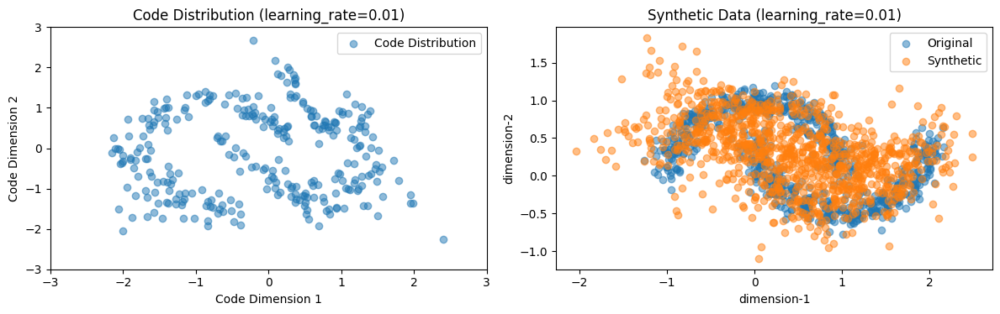

MMD Score (learning_rate=0.01): 0.0046

Training for learning rate=0.005
Epoch 1/10, Training Loss: 52254.039722595706, Validation Loss: 164.27972602844238
Epoch 2/10, Training Loss: 741.7644720077515, Validation Loss: 14.01915488243103
Epoch 3/10, Training Loss: 19.939120520244945, Validation Loss: 158.42234497070314
Epoch 4/10, Training Loss: 27.10821906003085, Validation Loss: 15.44111213684082
Epoch 5/10, Training Loss: 1.5850037146698346, Validation Loss: 1.4087551653385162
Epoch 6/10, Training Loss: 1.1361909031190656, Validation Loss: 1.083161100745201
Epoch 7/10, Training Loss: 0.48848888210274954, Validation Loss: 0.4532350584864616
Epoch 8/10, Training Loss: 0.40122535439017654, Validation Loss: 0.7285905472934247
Epoch 9/10, Training Loss: 0.3357141390442848, Validation Loss: -0.036489400267601016
Epoch 10/10, Training Loss: 0.4808980127457868, Validation Loss: 3.0841131627559664
Training complete


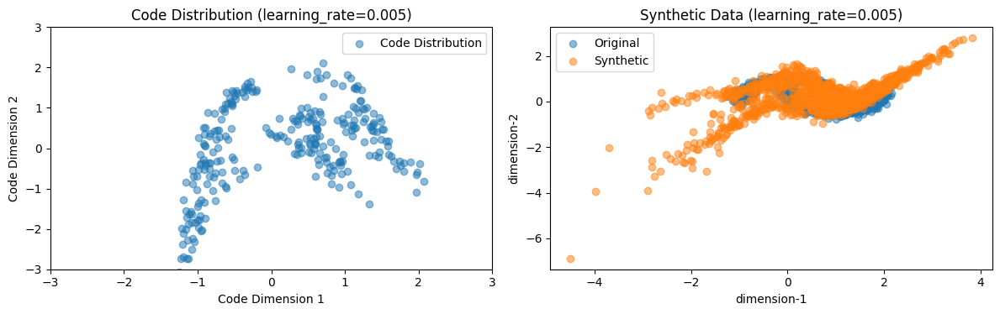

MMD Score (learning_rate=0.005): 0.0348

Training for learning rate=0.0005
Epoch 1/10, Training Loss: 0.13682757495817813, Validation Loss: -0.7633383601903916
Epoch 2/10, Training Loss: -0.23294716540046714, Validation Loss: -0.8632634282112122
Epoch 3/10, Training Loss: -0.48116691647605464, Validation Loss: -0.3288536250591278
Epoch 4/10, Training Loss: -0.3788215159015222, Validation Loss: -1.0701117813587189
Epoch 5/10, Training Loss: -0.6004951928361234, Validation Loss: -0.7683755110949277
Epoch 6/10, Training Loss: -0.48979568549177865, Validation Loss: -0.4364618957042694
Epoch 7/10, Training Loss: -0.452167192643339, Validation Loss: -1.194589763879776
Epoch 8/10, Training Loss: -0.530491769652475, Validation Loss: -1.234816312789917
Epoch 9/10, Training Loss: -0.6758440699089657, Validation Loss: -1.1735122680664063
Epoch 10/10, Training Loss: -0.679006118666042, Validation Loss: -1.1067862033843994
Training complete


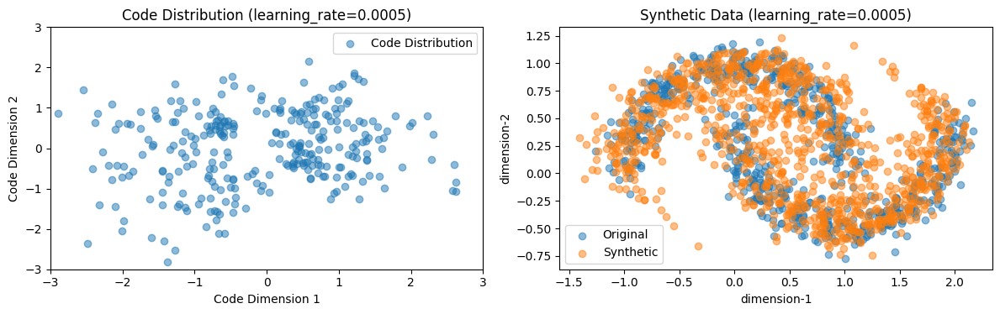

MMD Score (learning_rate=0.0005): 0.0018

Training for learning rate=0.0001
Epoch 1/10, Training Loss: 0.13516193361614237, Validation Loss: -0.3109583171550184
Epoch 2/10, Training Loss: -0.3114915165034207, Validation Loss: -0.8185359954833984
Epoch 3/10, Training Loss: -0.4997964467514645, Validation Loss: -0.7918980062007904
Epoch 4/10, Training Loss: -0.5287327888337049, Validation Loss: -1.2493661403656007
Epoch 5/10, Training Loss: -0.6295699395916678, Validation Loss: -1.201965296268463
Epoch 6/10, Training Loss: -0.7061004598032344, Validation Loss: -1.3122877120971679
Epoch 7/10, Training Loss: -0.7480784993280064, Validation Loss: -1.1126341104507447
Epoch 8/10, Training Loss: -0.708437873727896, Validation Loss: -1.0514729008078576
Epoch 9/10, Training Loss: -0.7756018068810756, Validation Loss: -1.4489239931106568
Epoch 10/10, Training Loss: -0.7630991662259806, Validation Loss: -1.0030977129936218
Training complete


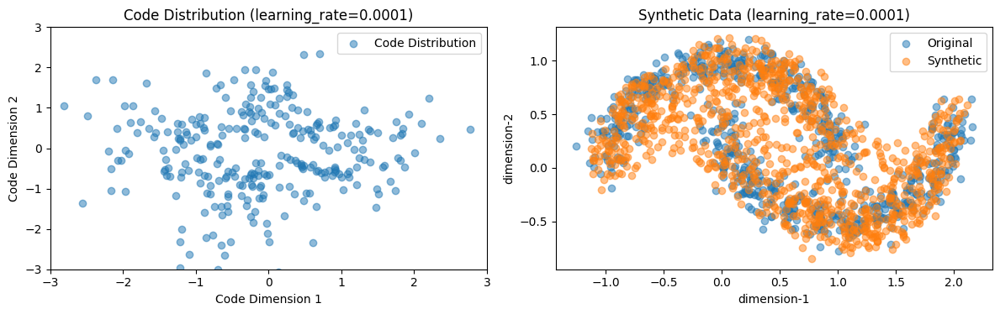

MMD Score (learning_rate=0.0001): 0.0029

Training for learning rate=5e-06
Epoch 1/10, Training Loss: 0.9484654529528185, Validation Loss: 1.8316135287284852
Epoch 2/10, Training Loss: 0.741399424997243, Validation Loss: 1.4261573553085327
Epoch 3/10, Training Loss: 0.562822928482836, Validation Loss: 1.07191661298275
Epoch 4/10, Training Loss: 0.4038297940384258, Validation Loss: 0.7643531948328018
Epoch 5/10, Training Loss: 0.27335194616832514, Validation Loss: 0.5083826245740056
Epoch 6/10, Training Loss: 0.15848511330444703, Validation Loss: 0.294943568110466
Epoch 7/10, Training Loss: 0.06790977453982289, Validation Loss: 0.12741145193576814
Epoch 8/10, Training Loss: 0.0002883290448649363, Validation Loss: 0.009454468567855655
Epoch 9/10, Training Loss: -0.05053388480816714, Validation Loss: -0.07924109371379018
Epoch 10/10, Training Loss: -0.09302480556917461, Validation Loss: -0.17067835815250873
Training complete


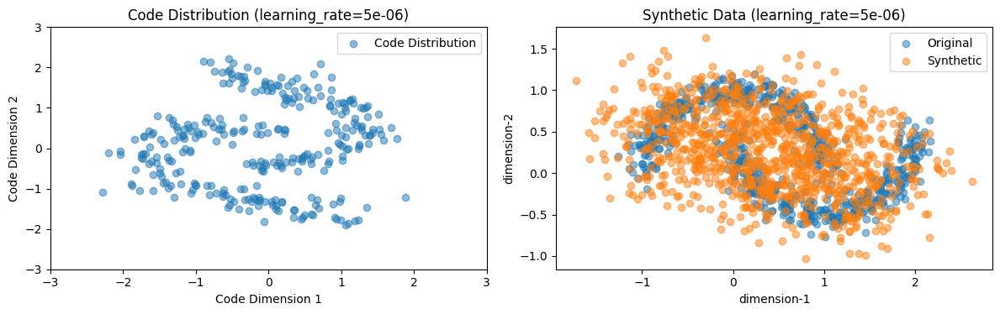

MMD Score (learning_rate=5e-06): 0.0081


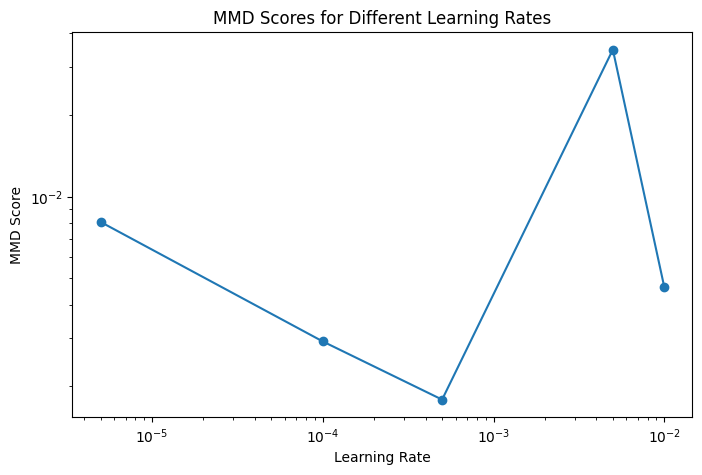

In [54]:
def train_and_plot_for_different_learning_rates(learning_rates, dataset_size=1000, block_size=10):
    results = []

    for lr in learning_rates:
        print(f"\nTraining for learning rate={lr}")

        # Instantiate the model
        model = RealNVP(input_size=2, hidden_size=200, blocks=block_size)  # Fix other parameters

        # Create data loader for the fixed dataset size
        data_considered = train_datasets[dataset_size]['X']
        train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
        val_loader = torch.utils.data.DataLoader(val_datasets[dataset_size]['X'], batch_size=32, shuffle=True)

        # Train the model
        train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=lr, print_after=1)

        # Plot code distribution
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.xlim(-3, 3)
        plt.ylim(-3, 3)
        plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
        plt.title(f'Code Distribution (learning_rate={lr})')

        # Plot synthetic data
        plt.subplot(1, 2, 2)
        synthetic_data = model.sample(num_samples=1000)
        visualize_synthetic_data(train_datasets[dataset_size]['X'], synthetic_data)
        plt.title(f'Synthetic Data (learning_rate={lr})')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

        # Calculate MMD score
        mmd_value = compute_mmd(val_loader.dataset, synthetic_data)
        print(f'MMD Score (learning_rate={lr}): {mmd_value:.4f}')

        results.append((lr, mmd_value))

    # Plot MMD scores
    plt.figure(figsize=(8, 5))
    learning_rates, mmd_values = zip(*results)
    plt.plot(learning_rates, mmd_values, marker='o')
    plt.title('MMD Scores for Different Learning Rates')
    plt.xlabel('Learning Rate')
    plt.ylabel('MMD Score')
    plt.xscale('log')  # Use a logarithmic scale for better visualization of different orders of magnitude
    plt.yscale('log')
    plt.show()


# Different learning rates to try
print("For fixed number of blocks=10, hidden_size=200, dataset_size=1000, num_epochs=10")
learning_rates_to_try = [0.01,0.005,0.0005,0.0001,0.000005]
train_and_plot_for_different_learning_rates(learning_rates_to_try, dataset_size=1000, block_size=10)


### Observation:

We observed that the lower learning rates were suited best for the real NVP (INN) model. We found the learning rate of `1e-4` the most suitable for this case.

### 1.4. Effect of number of epochs

For fixed number of blocks=10, hidden_size=200, dataset_size=5000, lr=0.0001

Training for num_epochs=10
Epoch 2/10, Training Loss: -0.13879513684660197, Validation Loss: -0.36392000761437926
Epoch 4/10, Training Loss: -0.1716393703256141, Validation Loss: -0.3676342821501671
Epoch 6/10, Training Loss: -0.18780441270633177, Validation Loss: -0.4083503972976766
Epoch 8/10, Training Loss: -0.19233072379773314, Validation Loss: -0.4461098845968855
Epoch 10/10, Training Loss: -0.20002188557250933, Validation Loss: -0.42407272819508895
Training complete


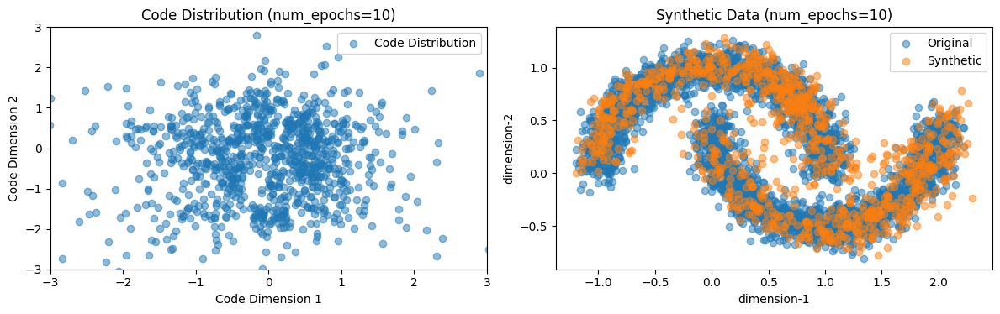

MMD Score (num_epochs=10): 0.0083

Training for num_epochs=40
Epoch 2/40, Training Loss: -0.13027396293526347, Validation Loss: -0.24593673210511816
Epoch 4/40, Training Loss: -0.16867873597551475, Validation Loss: -0.4001959717654167
Epoch 6/40, Training Loss: -0.19261106808077205, Validation Loss: -0.37184040087889486
Epoch 8/40, Training Loss: -0.19698109688999302, Validation Loss: -0.3822783448911728
Epoch 10/40, Training Loss: -0.2057805290276354, Validation Loss: -0.4701127612844427
Epoch 12/40, Training Loss: -0.20262345698746767, Validation Loss: -0.42339954858130596
Epoch 14/40, Training Loss: -0.20644893941723488, Validation Loss: -0.4262653202452558
Epoch 16/40, Training Loss: -0.20756160135973584, Validation Loss: -0.43430316765257654
Epoch 18/40, Training Loss: -0.2074219345369122, Validation Loss: -0.47805891455488003
Epoch 20/40, Training Loss: -0.21361950229514728, Validation Loss: -0.482034037087826
Epoch 22/40, Training Loss: -0.21690847684036602, Validation Loss: -0.

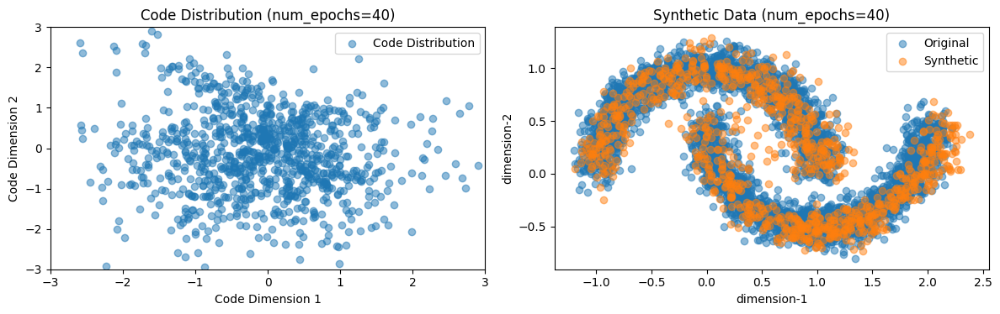

MMD Score (num_epochs=40): 0.0063

Training for num_epochs=70
Epoch 2/70, Training Loss: -0.12150171447375958, Validation Loss: -0.13894102389508106
Epoch 4/70, Training Loss: -0.14983904663981362, Validation Loss: -0.3491429442420919
Epoch 6/70, Training Loss: -0.16016293509270657, Validation Loss: -0.3980467013539152
Epoch 8/70, Training Loss: -0.1809300160035491, Validation Loss: -0.3906875623890417
Epoch 10/70, Training Loss: -0.18424147733233193, Validation Loss: -0.40282232108268334
Epoch 12/70, Training Loss: -0.19303564092313702, Validation Loss: -0.40287554171927115
Epoch 14/70, Training Loss: -0.19553342292254622, Validation Loss: -0.4361386625690663
Epoch 16/70, Training Loss: -0.1942526796494018, Validation Loss: -0.4304485774420677
Epoch 18/70, Training Loss: -0.19788815209811383, Validation Loss: -0.4711851804180348
Epoch 20/70, Training Loss: -0.20540043132548982, Validation Loss: -0.25512141344989553
Epoch 22/70, Training Loss: -0.2049351176754995, Validation Loss: -0.3

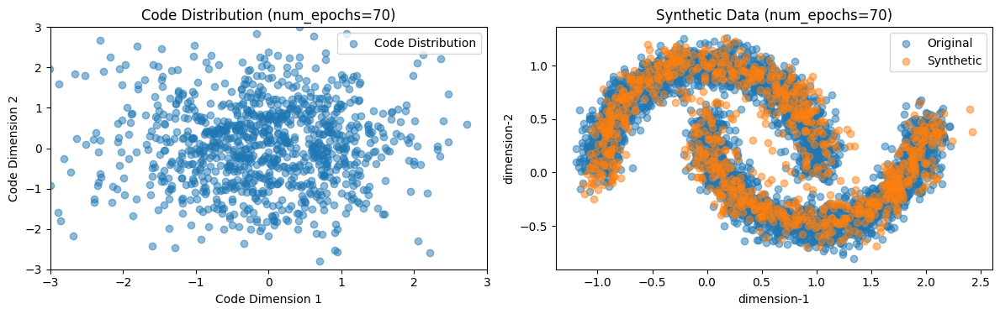

MMD Score (num_epochs=70): 0.0009

Training for num_epochs=100
Epoch 2/100, Training Loss: -0.11527766700495373, Validation Loss: -0.30659855529665947
Epoch 4/100, Training Loss: -0.16229969112795184, Validation Loss: -0.36695734554148735
Epoch 6/100, Training Loss: -0.1691590257073668, Validation Loss: -0.3799940596552605
Epoch 8/100, Training Loss: -0.17966390231793578, Validation Loss: -0.40745849685466035
Epoch 10/100, Training Loss: -0.19328666651113466, Validation Loss: -0.407952052481631
Epoch 12/100, Training Loss: -0.19880909344012088, Validation Loss: -0.43535145784312107
Epoch 14/100, Training Loss: -0.19817624552683397, Validation Loss: -0.4517661123833758
Epoch 16/100, Training Loss: -0.20091008591380985, Validation Loss: -0.4068745726996914
Epoch 18/100, Training Loss: -0.20787727622823282, Validation Loss: -0.47721601483669684
Epoch 20/100, Training Loss: -0.2086251232434403, Validation Loss: -0.40104665286204916
Epoch 22/100, Training Loss: -0.20691328407688575, Validat

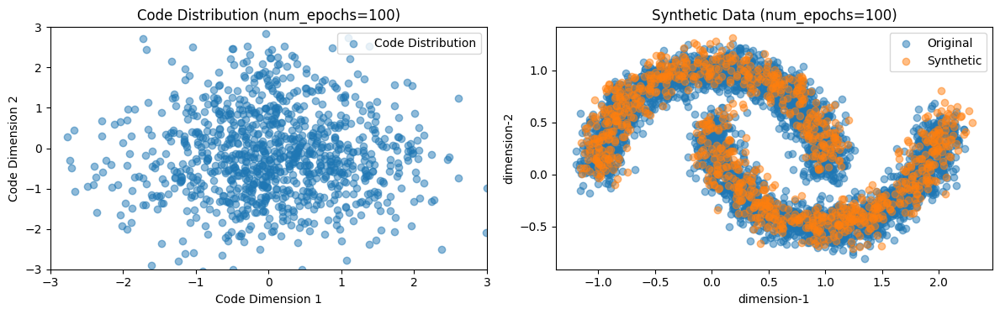

MMD Score (num_epochs=100): 0.0012


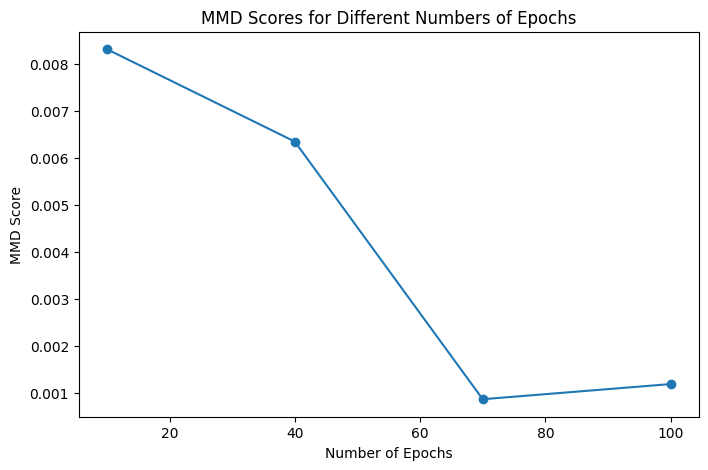

In [55]:
def train_and_plot_for_different_epochs(epochs_list, dataset_size=1000, block_size=10, lr=0.0001):
    results = []

    for num_epochs in epochs_list:
        print(f"\nTraining for num_epochs={num_epochs}")

        # Instantiate the model
        model = RealNVP(input_size=2, hidden_size=200, blocks=block_size)  # Fix other parameters

        # Create data loader for the fixed dataset size
        data_considered = train_datasets[dataset_size]['X']
        train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
        val_loader = torch.utils.data.DataLoader(val_datasets[dataset_size]['X'], batch_size=32, shuffle=True)

        # Train the model
        train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=num_epochs, lr=lr, print_after=2)

        # Plot code distribution
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.xlim(-3, 3)
        plt.ylim(-3, 3)
        plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
        plt.title(f'Code Distribution (num_epochs={num_epochs})')

        # Plot synthetic data
        plt.subplot(1, 2, 2)
        synthetic_data = model.sample(num_samples=1000)
        visualize_synthetic_data(train_datasets[dataset_size]['X'], synthetic_data)
        plt.title(f'Synthetic Data (num_epochs={num_epochs})')

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

        # Calculate MMD score
        mmd_value = compute_mmd(val_loader.dataset, synthetic_data)
        print(f'MMD Score (num_epochs={num_epochs}): {mmd_value:.4f}')

        results.append((num_epochs, mmd_value))

    # Plot MMD scores
    plt.figure(figsize=(8, 5))
    num_epochs_values, mmd_values = zip(*results)
    plt.plot(num_epochs_values, mmd_values, marker='o')
    plt.title('MMD Scores for Different Numbers of Epochs')
    plt.xlabel('Number of Epochs')
    plt.ylabel('MMD Score')
    plt.show()


# Different numbers of epochs to try
print("For fixed number of blocks=10, hidden_size=200, dataset_size=5000, lr=0.0001")
epochs_to_try = [10,40,70,100]
train_and_plot_for_different_epochs(epochs_to_try, dataset_size=5000, block_size=10, lr=0.0001)


# Question 2. Conditional INN

In [16]:
### conditional coupling layer
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.nn.functional import one_hot

class ConditionalCouplingLayer(nn.Module):
    def __init__(self, input_size, hidden_size, condition_size):
        """
        Initialize a ConditionalCouplingLayer.

        Args:
        - input_size (int): Total size of the input data.
        - hidden_size (int): Size of the hidden layers in the neural networks.
        - condition_size (int): Size of the condition vector (e.g., one-hot encoded label size).
        """
        super(ConditionalCouplingLayer, self).__init__()
        # Neural networks for the first half of the dimensions
        self.fc1 = nn.Linear(input_size // 2 + condition_size, hidden_size)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        # Translation coefficient
        self.fc3 = nn.Linear(hidden_size, input_size // 2)
        # Scaling coefficient
        self.fc4 = nn.Linear(hidden_size, input_size // 2)

    def forward(self, x, condition):
        """
        Forward pass through the ConditionalCouplingLayer.

        Args:
        - x (torch.Tensor): Input data.
        - condition (torch.Tensor): Condition vector.

        Returns:
        - y (torch.Tensor): Transformed data.
        - scaling_before_exp (torch.Tensor): Scaling coefficients before the exponential operation.
        """
        # Split the input into two halves
        x_a, x_b = x.chunk(2, dim=1)

        # Concatenate conditions to the first half
        x_a_concat = torch.cat([x_a, condition], dim=1)

        # Apply neural network to calculate coefficients
        h = F.relu(self.fc1(x_a_concat))
        h = F.relu(self.fc2(h))
        translation = self.fc3(h)
        scaling_before_exp = torch.tanh(self.fc4(h))
        scaling = torch.exp(scaling_before_exp)

        # Apply the affine transformation
        y_b = x_b * scaling + translation

        # Concatenate the transformed halves
        y = torch.cat([x_a, y_b], dim=1)
        return y, scaling_before_exp

    def backward(self, y, condition):
        """
        Backward pass through the ConditionalCouplingLayer.

        Args:
        - y (torch.Tensor): Transformed data.
        - condition (torch.Tensor): Condition vector.

        Returns:
        - x (torch.Tensor): Reconstructed original input.
        """
        # Split the input into two halves
        y_a, y_b = y.chunk(2, dim=1)

        # Concatenate conditions to the first half
        y_a_concat = torch.cat([y_a, condition], dim=1)

        # Apply neural network to calculate coefficients (reverse)
        h = F.relu(self.fc1(y_a_concat))
        h = F.relu(self.fc2(h))
        translation = self.fc3(h)
        scaling_before_exp = self.fc4(h)
        scaling = torch.exp(torch.tanh(scaling_before_exp))

        # Reverse the operations to reconstruct the original input
        x_a = y_a
        x_b = (y_b - translation) / scaling

        # Concatenate the reconstructed halves
        x = torch.cat([x_a, x_b], dim=1)
        return x

In [17]:
### conditional real NVP class
class ConditionalRealNVP(nn.Module):
    def __init__(self, input_size, hidden_size, condition_size, blocks):
        """
        Initialize a ConditionalRealNVP model.

        Args:
        - input_size (int): Total size of the input data.
        - hidden_size (int): Size of the hidden layers in the neural networks.
        - condition_size (int): Size of the condition vector (e.g., one-hot encoded label size).
        - blocks (int): Number of coupling layers in the model.
        """
        super(ConditionalRealNVP, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.condition_size = condition_size
        self.blocks = blocks

        # List of coupling layers
        self.coupling_layers = nn.ModuleList([
            ConditionalCouplingLayer(input_size, hidden_size, condition_size) for _ in range(blocks)
        ])

        # List to store orthonormal matrices
        self.orthonormal_matrices = [self._get_orthonormal_matrix(input_size) for _ in range(blocks)]

        # List to store scaling_before_exp for each block
        self.scaling_before_exp_list = []

    def _get_orthonormal_matrix(self, size):
        """
        Generate a random orthonormal matrix.

        Args:
        - size (int): Size of the matrix.

        Returns:
        - q (torch.Tensor): Orthonormal matrix.
        """
        w = torch.randn(size, size)
        q, _ = torch.linalg.qr(w, 'reduced')
        return q

    def forward_realnvp(self, x, condition):
        """
        Forward pass through the ConditionalRealNVP model.

        Args:
        - x (torch.Tensor): Input data.
        - condition (torch.Tensor): Condition vector.

        Returns:
        - x (torch.Tensor): Transformed data.
        """
        scaling_before_exp_list = []
        for i in range(self.blocks):
            #print("x is:"); print(x)
            #print("shape of x is:"); print(x.shape)
            x = torch.matmul(x, self.orthonormal_matrices[i])
            x, scaling_before_exp = self.coupling_layers[i].forward(x, condition)
            scaling_before_exp_list.append(scaling_before_exp)

        self.scaling_before_exp_list = scaling_before_exp_list
        return x

    def decode(self, z, condition):
        """
        Reverse transformations to decode data.

        Args:
        - z (torch.Tensor): Transformed data.
        - condition (torch.Tensor): Condition vector.

        Returns:
        - z (torch.Tensor): Reconstructed original data.
        """
        for i in reversed(range(self.blocks)):
            z = self.coupling_layers[i].backward(z, condition)
            z = torch.matmul(z, self.orthonormal_matrices[i].t())
        return z

    def sample(self, num_samples=1000, conditions=None):
        """
        Generate synthetic samples.

        Args:
        - num_samples (int): Number of synthetic samples to generate.
        - conditions (torch.Tensor): Conditions for generating synthetic samples.

        Returns:
        - synthetic_samples (torch.Tensor): Synthetic samples.
        """
        with torch.no_grad():
            z = torch.randn(num_samples, self.input_size)
            synthetic_samples = self.decode(z, conditions)
        return synthetic_samples


In [18]:
### training_the_conditional_nvp model

import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_validate_conditional_nvp(model, train_loader, val_loader, num_epochs=10, lr=0.001, print_after=1):
    """
    Train the ConditionalRealNVP model and evaluate on a validation dataset.

    Args:
    - model (ConditionalRealNVP): The ConditionalRealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_losses = []  # List to store training losses
    val_losses = []    # List to store validation losses

    for epoch in range(num_epochs):
        total_train_loss = 0.0

        # Training phase
        model.train()  # Set the model to training mode
        for data, labels in train_loader:
            inputs = data
            conditions = one_hot(labels, num_classes=model.condition_size).float()

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass (encoding)
            encoded = model.forward_realnvp(inputs, conditions)

            # Loss calculation
            train_loss = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Backward pass (gradient computation)
            train_loss.backward()

            # Clip gradients to prevent exploding gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)

            # Update weights
            optimizer.step()

            total_train_loss += train_loss.item()

        # Average training loss for the epoch
        average_train_loss = total_train_loss / len(train_loader)

        # Validation phase
        if val_loader is not None:
            model.eval()  # Set the model to evaluation mode
            total_val_loss = 0.0
            with torch.no_grad():
                for val_data, val_labels in val_loader:
                    val_inputs = val_data
                    val_conditions = one_hot(val_labels, num_classes=model.condition_size).float()

                    # Forward pass (encoding) for validation
                    val_encoded = model.forward_realnvp(val_inputs, val_conditions)

                    # Loss calculation for validation
                    val_loss = calculate_loss(val_encoded, model.scaling_before_exp_list, len(val_loader))

                    total_val_loss += val_loss.item()

            # Average validation loss for the epoch
            average_val_loss = total_val_loss / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss}, Validation Loss: {average_val_loss}")

            # Append losses to the lists
            train_losses.append(average_train_loss)
            val_losses.append(average_val_loss)

        # Set the model back to training mode
        model.train()

    print("Training complete")

    return train_losses, val_losses

In [19]:
### Create the dataset and dataloaders for the conditional NVP model
dataset_sizes = [ 100, 200,300,400,500,600,700,800,900, 1000, 5000]

# Generate datasets of varying sizes
train_datasets = {}
val_datasets = {}
datasets = {}

for size in dataset_sizes:
    X, y = make_moons(n_samples=size, noise=0.1)
    datasets[size] = {'data': X, 'labels': y}### label imply to which moon does it belong to
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
    train_datasets[size] = {'data': torch.FloatTensor(X_train), 'label': y_train}
    val_datasets[size] = {'data': torch.FloatTensor(X_test), 'label': y_test}


In [20]:
#### data for the two-moons model
from torch.utils.data import TensorDataset, DataLoader

# Define a custom dataset
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        x = self.data[index]
        y = self.labels[index]
        return x, y


### task 1. train the conditional INN

In [21]:
# Define model parameters
input_size = 2
hidden_size = 200
condition_size = 2
blocks = 10

# Initialize the model
conditional_inn_model = ConditionalRealNVP(input_size, hidden_size, condition_size, blocks)

# Define hyperparameters
num_epochs = 10
lr = 0.0001

# Create datasets
dataset_size=1000
train_dataset = CustomDataset(train_datasets[dataset_size]['data'], train_datasets[dataset_size]['label'])
val_dataset = CustomDataset(val_datasets[dataset_size]['data'], val_datasets[dataset_size]['label'])

# Define batch size
batch_size = 32

# Create data loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Task 1: Train the Conditional INN
train_loss, val_loss= train_and_validate_conditional_nvp(conditional_inn_model, train_loader, val_loader,
                                                         num_epochs=num_epochs, lr=lr, print_after=1)

# # plotting the loss
# plot_losses(train_losses[3:], val_losses[3:], want_log_scale=0)
# plt.show()

Epoch 1/10, Training Loss: -0.12527488874779505, Validation Loss: -2.047491157054901
Epoch 2/10, Training Loss: -1.1330604932524941, Validation Loss: -3.0881754100322723
Epoch 3/10, Training Loss: -1.4576226608319716, Validation Loss: -3.423754322528839
Epoch 4/10, Training Loss: -1.639033485542644, Validation Loss: -3.823526620864868
Epoch 5/10, Training Loss: -1.8379857594316655, Validation Loss: -4.0823764443397526
Epoch 6/10, Training Loss: -1.9273674271323464, Validation Loss: -4.105624425411224
Epoch 7/10, Training Loss: -1.9593478441238403, Validation Loss: -4.271672606468201
Epoch 8/10, Training Loss: -1.9670261849056592, Validation Loss: -4.230384600162506
Epoch 9/10, Training Loss: -2.018819949843667, Validation Loss: -4.04102590084076
Epoch 10/10, Training Loss: -2.027855705131184, Validation Loss: -4.33237076997757
Training complete


### task 2. evaluate the conditonal model p(x|y)

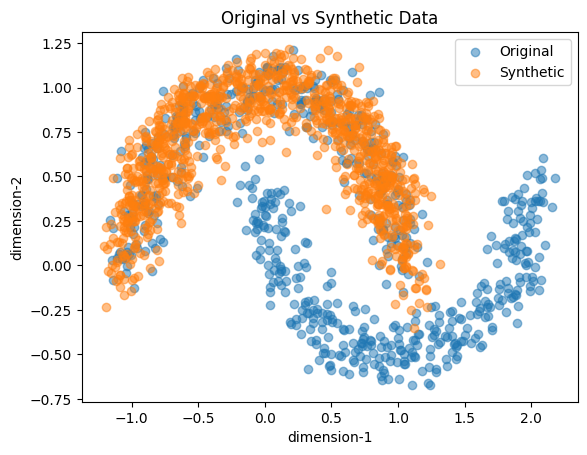

In [22]:
# Choose a label for evaluation (e.g., label 0)
eval_condition = torch.tensor([[1, 0]])  # One-hot encoding for label 0

# Repeat the condition vector for each sample
eval_condition = eval_condition.repeat(1000, 1)

with torch.no_grad():
    # Generate synthetic samples for the chosen label
    synthetic_samples_label_0 = conditional_inn_model.sample(num_samples=1000, conditions=eval_condition)

# # Example usage:
# plot_code_distribution(model=model, test_loader=val_loader, num_samples=1000)
# plt.show()

### plot the synthetic data and the original data
visualize_synthetic_data(train_datasets[1000]['data'], synthetic_samples_label_0)
plt.show()

### task 3. Merge synthetic data from all labels and compare the marginal distributions.

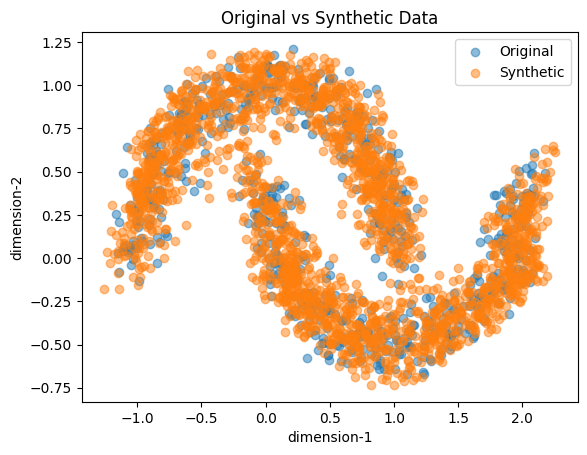

In [23]:
# Generate synthetic samples for all labels
# Generate synthetic samples for all labels
conditions_all_labels = torch.eye(condition_size)  # Assuming one-hot encoding

# Repeat the condition vector for each sample
conditions_all_labels = conditions_all_labels.repeat(1000, 1)

with torch.no_grad():
    synthetic_samples_all_labels = conditional_inn_model.sample(num_samples=2000, conditions=conditions_all_labels)

visualize_synthetic_data(train_datasets[1000]['data'], synthetic_samples_all_labels)
plt.show()

# Repeating task 1 and 2 with Gaussian Mixture dataset:

(this was the section that was mistakenly deleted in our previous submission when we merged the notebooks)

### Question 1: with gaussian mixture dataset

### Generating the gaussian mixture dataset with centers at the corners of a regular hexagon.

In [24]:
import numpy as np
import matplotlib.pyplot as plt

def generate_hexagon_centers(radius):
    """Generate the coordinates of the corners of a regular hexagon."""
    centers = []
    for i in range(6):
        angle = i * (2 * np.pi) / 6
        x = radius * np.cos(angle)
        y = radius * np.sin(angle)
        centers.append((x, y))
    return np.array(centers)

def generate_gaussian_mixture(num_samples, radius, std_factor=0.1):
    """Generate a Gaussian mixture dataset with centers at the corners of a regular hexagon."""
    centers = generate_hexagon_centers(radius)
    dataset = []

    for center in centers:
        # Generate samples for each center
        samples = center + np.random.normal(scale=radius * std_factor, size=(num_samples // 6, 2))
        dataset.extend(samples)

    return np.array(dataset)

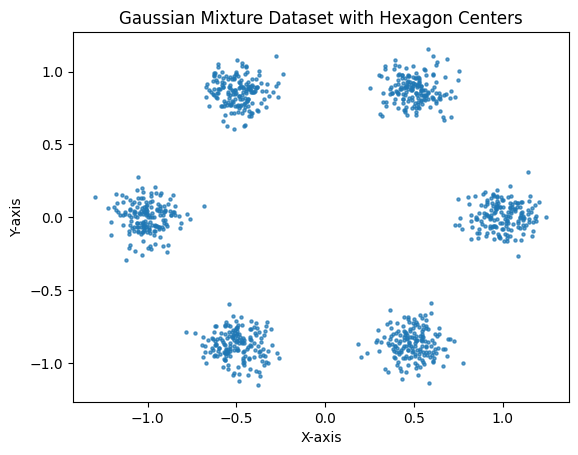

In [25]:
# Parameters
num_samples = 1000  # Total number of samples
radius = 1.0       # Radius of the hexagon

# Generate Gaussian mixture dataset
data = generate_gaussian_mixture(num_samples, radius)

# Plot the dataset
plt.scatter(data[:, 0], data[:, 1], s=5, alpha=0.7)
plt.title("Gaussian Mixture Dataset with Hexagon Centers")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.show()

In [26]:
### creating dataloader for the GMM data for the task 1
import torch
from torch.utils.data import TensorDataset, DataLoader
from sklearn.model_selection import train_test_split


train_data.shape: torch.Size([3498, 2])
Epoch 1/10, Training Loss: -0.1437596875242889, Validation Loss: -0.5220285277575889
Epoch 2/10, Training Loss: -0.21138813950290733, Validation Loss: -0.5275179301487639
Epoch 3/10, Training Loss: -0.23734542158516972, Validation Loss: -0.6622551305496946
Epoch 4/10, Training Loss: -0.2864442727105184, Validation Loss: -0.7554410715052422
Epoch 5/10, Training Loss: -0.30393311361020264, Validation Loss: -0.7021969490228815
Epoch 6/10, Training Loss: -0.3122311332686381, Validation Loss: -0.7046164346839043
Epoch 7/10, Training Loss: -0.3297399382022294, Validation Loss: -0.8131548001411113
Epoch 8/10, Training Loss: -0.3169263428352265, Validation Loss: -0.8606440592953499
Epoch 9/10, Training Loss: -0.3362440736795014, Validation Loss: -0.8609163342638219
Epoch 10/10, Training Loss: -0.3217245819470422, Validation Loss: -0.8361715312967909
Training complete


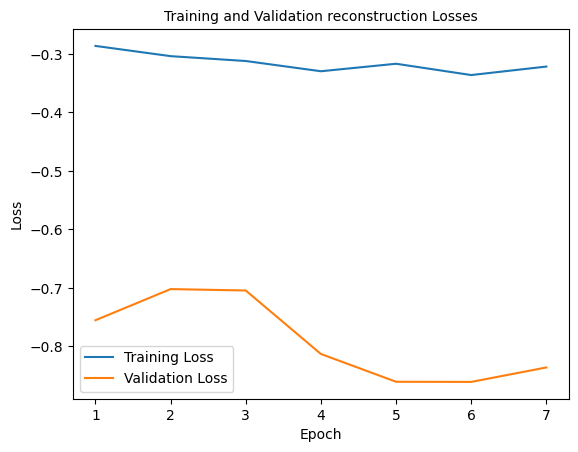

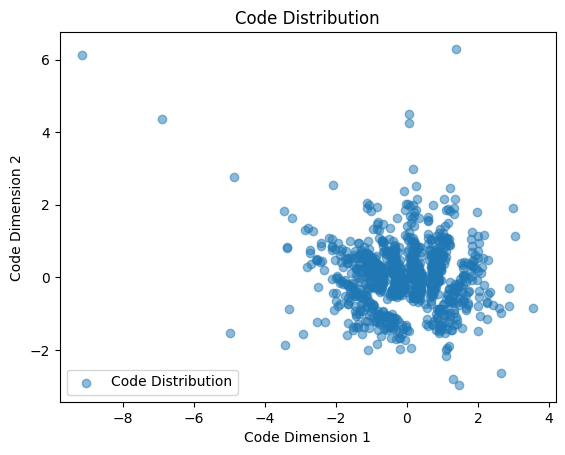

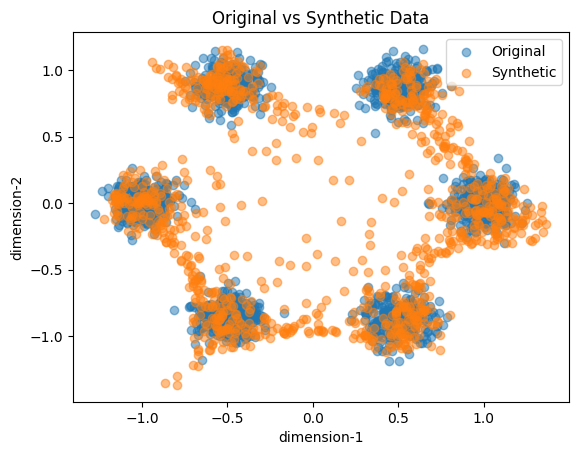

In [27]:
### testing our code
# Parameters
num_samples = 5000 # Total number of samples
radius = 1.0       # Radius of the hexagon

# Generate Gaussian mixture dataset
data = generate_gaussian_mixture(num_samples, radius)

# Convert NumPy array to PyTorch tensor
tensor_data = torch.FloatTensor(data)

# Split the data into training, validation, and test sets
train_data, val_data = train_test_split(tensor_data, test_size=0.3, random_state=42,)
# val_data, test_data = train_test_split(test_data, test_size=0.5, random_state=42)
print("train_data.shape:",train_data.shape)

# Create DataLoaders for training, validation, and test sets
batch_size = 32
train_loader_gmm = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader_gmm = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)
# test_loader_gmm = torch.utils.data.DataLoader(test_data, batch_size=batch_size, shuffle=False)

### train the real NVP on this gaussian mixture dataset using the good hyperparameters and parameter setting

### instantiate the model
model= RealNVP(input_size=2, hidden_size= hidden_size, blocks=blocks)

## train the model
train_losses, val_losses= train_and_evaluate(model, train_loader_gmm, val_loader_gmm, num_epochs=10, lr=0.0001, print_after=1)

# plotting the loss
plot_losses(train_losses[3:], val_losses[3:], want_log_scale=0)
plt.show()


plot_code_distribution(model=model, test_loader=val_loader_gmm, num_samples=1000)
plt.show()

### plot the synthetic data and the original data
synthetic_data=model.sample(num_samples=1000)
visualize_synthetic_data(val_data, synthetic_data)
plt.show()

for different number of blocks

for number of blocks (of coupling layers) = 10
Epoch 1/10, Training Loss: -0.1411624539791691, Validation Loss: -0.5125548636659663
Epoch 2/10, Training Loss: -0.20390416622288865, Validation Loss: -0.39507779530546766
Epoch 3/10, Training Loss: -0.2674451034854759, Validation Loss: -0.2993255025964785
Epoch 4/10, Training Loss: -0.2868207246403803, Validation Loss: -0.43058889359235764
Epoch 5/10, Training Loss: -0.3024103787134994, Validation Loss: -0.6479602315007372
Epoch 6/10, Training Loss: -0.30337879925288935, Validation Loss: -0.7431453645942693
Epoch 7/10, Training Loss: -0.32178427671209314, Validation Loss: -0.5826175775616727
Epoch 8/10, Training Loss: -0.31622156654272904, Validation Loss: -0.7401950511526554
Epoch 9/10, Training Loss: -0.33437610311984, Validation Loss: -0.5928851036315269
Epoch 10/10, Training Loss: -0.3288487898355181, Validation Loss: -0.6914931968488591
Training complete


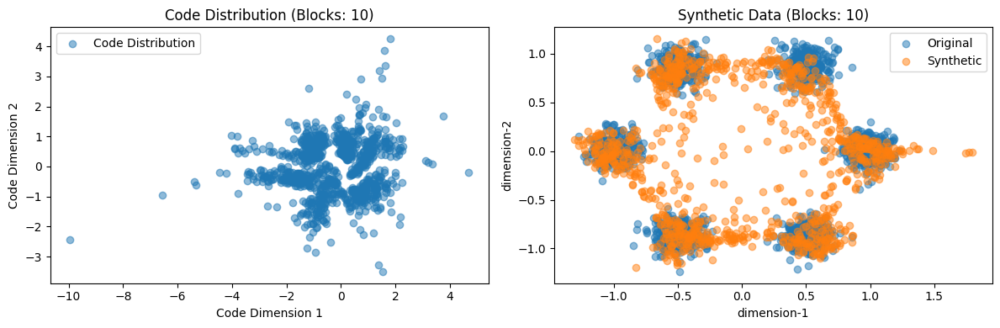

for number of blocks (of coupling layers) = 15
Epoch 1/10, Training Loss: -0.14263431769372387, Validation Loss: 3.3357513141124806
Epoch 2/10, Training Loss: -0.2643032145855779, Validation Loss: -0.5774100600404942
Epoch 3/10, Training Loss: -0.295058127221736, Validation Loss: -0.7441426607522559
Epoch 4/10, Training Loss: -0.319789065962488, Validation Loss: -0.8149640972309924
Epoch 5/10, Training Loss: -0.3289219857955521, Validation Loss: -0.7306957657032824
Epoch 6/10, Training Loss: -0.33893453483046454, Validation Loss: -0.7560043554911589
Epoch 7/10, Training Loss: -0.3781485313718969, Validation Loss: -0.8845796033422998
Epoch 8/10, Training Loss: -0.36712583117187025, Validation Loss: -0.9346694515106526
Epoch 9/10, Training Loss: -0.3600401264700023, Validation Loss: -0.874823289982816
Epoch 10/10, Training Loss: -0.3783066279466518, Validation Loss: -0.46031917377989345
Training complete


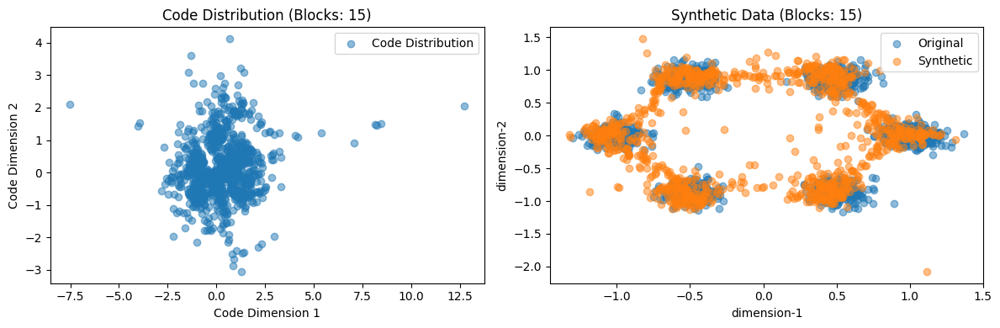

for number of blocks (of coupling layers) = 20
Epoch 1/10, Training Loss: -0.06387206378646872, Validation Loss: -0.6782212720272389
Epoch 2/10, Training Loss: -0.2864963486790657, Validation Loss: -0.7740577334102164
Epoch 3/10, Training Loss: -0.3201880412345583, Validation Loss: -0.7843515834909804
Epoch 4/10, Training Loss: -0.3472848987037485, Validation Loss: -0.8530738011319586
Epoch 5/10, Training Loss: -0.33591495596549725, Validation Loss: -0.9343100228208177
Epoch 6/10, Training Loss: -0.3471211847933856, Validation Loss: -0.8434062764999715
Epoch 7/10, Training Loss: -0.35063450283116915, Validation Loss: -0.8202125721789421
Epoch 8/10, Training Loss: -0.29778940573504026, Validation Loss: -0.859814075713462
Epoch 9/10, Training Loss: -0.34502616277684206, Validation Loss: -0.9039202319814804
Epoch 10/10, Training Loss: -0.36935863928361373, Validation Loss: -0.8478494204105215
Training complete


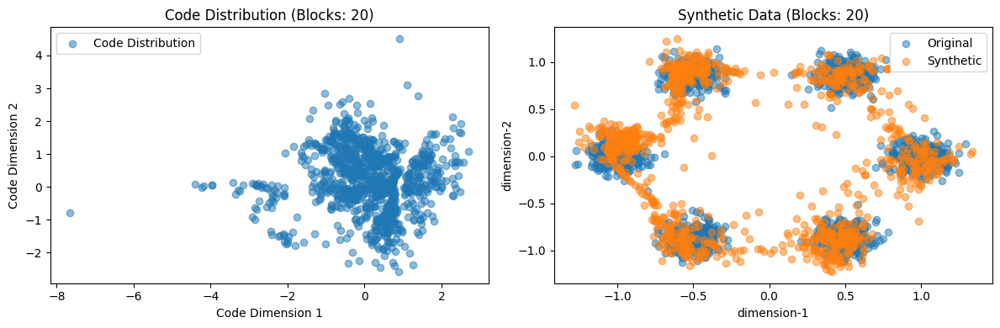

In [28]:
# for different number of blocks
# hyperparameter setting: (dataset_size=5000, lr=0.0001, num_epochs=10). We will consider different number of blocks
import matplotlib.pyplot as plt
import torch
from sklearn.model_selection import train_test_split

def train_evaluate_plot(blocks):
    # Parameters
    num_samples = 5000  # Total number of samples
    radius = 1.0        # Radius of the hexagon
    hidden_size = 256    # Hidden size in the neural networks

    # Generate Gaussian mixture dataset
    data = generate_gaussian_mixture(num_samples, radius)

    # Convert NumPy array to PyTorch tensor
    tensor_data = torch.FloatTensor(data)

    # Split the data into training and validation sets
    train_data, val_data = train_test_split(tensor_data, test_size=0.3, random_state=42)

    # Create DataLoaders for training and validation sets
    batch_size = 32
    train_loader_gmm = torch.utils.data.DataLoader(train_data, batch_size=batch_size, shuffle=True)
    val_loader_gmm = torch.utils.data.DataLoader(val_data, batch_size=batch_size, shuffle=False)

    # Instantiate the model
    model = RealNVP(input_size=2, hidden_size=hidden_size, blocks=blocks)

    # Train the model
    train_and_evaluate(model, train_loader_gmm, val_loader_gmm, num_epochs=10, lr=0.0001, print_after=1)

    # Plot the code distribution and synthetic data as a 2x1 subplot
    plt.figure(figsize=(12, 4))

    # Plot Code Distribution
    plt.subplot(1, 2, 1)
    plot_code_distribution(model=model, test_loader=val_loader_gmm, num_samples=1000)
    plt.title(f'Code Distribution (Blocks: {blocks})')

    # Plot Synthetic Data
    plt.subplot(1, 2, 2)
    synthetic_data = model.sample(num_samples=1000)
    visualize_synthetic_data(val_data, synthetic_data)
    plt.title(f'Synthetic Data (Blocks: {blocks})')

    plt.tight_layout()
    plt.show()

# Train and evaluate the model for different numbers of blocks
blocks_list = [10, 15, 20]

for blocks in blocks_list:
    print(f"for number of blocks (of coupling layers) = {blocks}")
    train_evaluate_plot(blocks)

### Observation (training the `RealNVP` model on the gaussian mixture dataset):

We noticed that in general, it is more difficult to train model on GMM dataset than on the two-moons dataset. We had to consider more no. of coupling layer blocks for some improvement

### Question (2) for Gaussian mixture dataset

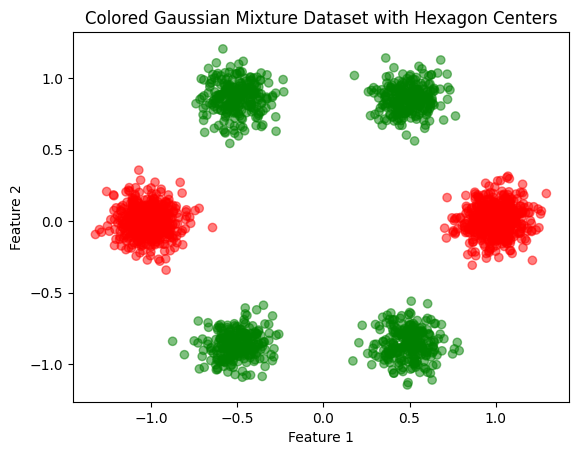

In [29]:
import numpy as np
import torch
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt

def generate_colored_gaussian_mixture(num_samples, red_centers, green_centers, red_std=0.1, green_std=0.1):
    # Generate data for red peaks (label 0)
    red_samples = np.concatenate([np.random.normal(center, red_std, size=(num_samples // len(red_centers), 2)) for center in red_centers])

    # Generate data for green peaks (label 1)
    green_samples = np.concatenate([np.random.normal(center, green_std, size=(num_samples // len(green_centers), 2)) for center in green_centers])

    # Concatenate data and labels
    data = np.concatenate([red_samples, green_samples])
    labels = np.concatenate([np.zeros(len(red_samples)), np.ones(len(green_samples))])

    # Shuffle the data
    shuffle_idx = np.arange(len(data))
    np.random.shuffle(shuffle_idx)
    data = data[shuffle_idx]
    labels = labels[shuffle_idx]

    return torch.FloatTensor(data), torch.LongTensor(labels)

# Set the parameters for the hexagon
radius = 1.0
theta = np.linspace(0, 2*np.pi, 6, endpoint=False)
hexagon_centers = radius * np.column_stack([np.cos(theta), np.sin(theta)])

# Red centers are two opposite corners of the hexagon
red_centers = hexagon_centers[[0, 3]]

# Green centers are the remaining corners of the hexagon
green_centers = np.delete(hexagon_centers, [0, 3], axis=0)

# Generate the colored Gaussian mixture dataset
num_samples = 1000
gmm_data, gmm_labels = generate_colored_gaussian_mixture(num_samples, red_centers, green_centers)

# Visualize the generated data with red and green colors
colors = ['red' if label == 0 else 'green' for label in gmm_labels.numpy()]
plt.scatter(gmm_data[:, 0], gmm_data[:, 1], c=colors, alpha=0.5)
plt.title("Colored Gaussian Mixture Dataset with Hexagon Centers")
plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.show()

In [36]:
### creating the dataloaders

import torch
from torch.utils.data import TensorDataset, DataLoader, random_split

# Generate the colored Gaussian mixture dataset
num_samples = 1000
gmm_data, gmm_labels = generate_colored_gaussian_mixture(num_samples, red_centers, green_centers)

# Split the data into training and validation sets
train_data, val_data, train_labels, val_labels = train_test_split(gmm_data, gmm_labels, test_size=0.3, random_state=42)

# Create custom dataset class
class CustomGaussianDataset(torch.utils.data.Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        x = self.data[index]
        y = self.labels[index]
        return x, y

# Create datasets and dataloaders
batch_size = 32

# Training dataset and dataloader
train_dataset_gmm = CustomGaussianDataset(train_data, train_labels)
train_loader_gmm = torch.utils.data.DataLoader(train_dataset_gmm, batch_size=batch_size, shuffle=True)

# Validation dataset and dataloader
val_dataset_gmm = CustomGaussianDataset(val_data, val_labels)
val_loader_gmm = torch.utils.data.DataLoader(val_dataset_gmm, batch_size=batch_size, shuffle=False)

In [37]:
print(train_data); print(train_labels)

tensor([[-0.9751,  0.0218],
        [-0.4704, -0.7980],
        [-0.4252,  1.0168],
        ...,
        [ 0.4898,  0.9765],
        [-0.4713, -0.8780],
        [-0.6587,  0.9288]])
tensor([0, 1, 1,  ..., 1, 1, 1])


In [38]:
### training the conditional real nvp model on this labelled gaussian mixture model
input_size = 2
hidden_size = 200
condition_size = 2
blocks = 10

# Initialize the model
conditional_inn_model_gmm = ConditionalRealNVP(input_size, hidden_size, condition_size, blocks)

# Task 1: Train the Conditional INN
train_loss, val_loss= train_and_validate_conditional_nvp(conditional_inn_model_gmm, train_loader_gmm, val_loader_gmm,
                                                         num_epochs=10, lr=0.0001, print_after=1)

Epoch 1/10, Training Loss: -0.2450224871916527, Validation Loss: -1.5812283754348755
Epoch 2/10, Training Loss: -0.8215844658288088, Validation Loss: -2.1685015967017724
Epoch 3/10, Training Loss: -1.0012026781385595, Validation Loss: -2.354001208355552
Epoch 4/10, Training Loss: -1.090982048348947, Validation Loss: -2.5859718260012174
Epoch 5/10, Training Loss: -1.1436902392994275, Validation Loss: -2.3957173243949286
Epoch 6/10, Training Loss: -1.107901154847985, Validation Loss: -2.419398351719505
Epoch 7/10, Training Loss: -1.1716607849706302, Validation Loss: -2.6266124307325014
Epoch 8/10, Training Loss: -1.2248409674926237, Validation Loss: -2.559691203267951
Epoch 9/10, Training Loss: -1.2694588899612427, Validation Loss: -2.6259449726999984
Epoch 10/10, Training Loss: -1.2902738763527437, Validation Loss: -2.633208786186419
Training complete


question 2) task-2: generating the "conditional-dataset"

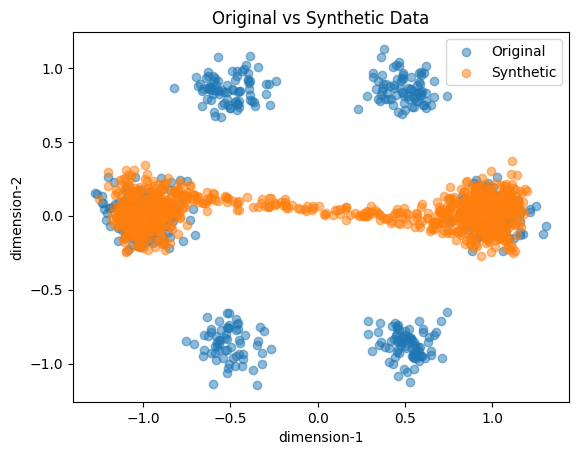

In [33]:
# Choosing a label for evaluation (e.g., label 0)
eval_condition = torch.tensor([[1, 0]])  # One-hot encoding for label 0

# Repeat the condition vector for each sample
eval_condition = eval_condition.repeat(1000, 1)

with torch.no_grad():
    # Generate synthetic samples for the chosen label
    synthetic_samples_label_0 = conditional_inn_model_gmm.sample(num_samples=1000, conditions=eval_condition)

### plot the synthetic data and the original data
visualize_synthetic_data(val_data, synthetic_samples_label_0)
plt.show()

question 2) task-3: merging the synthetic data from all labels and compring the marginal distribution.

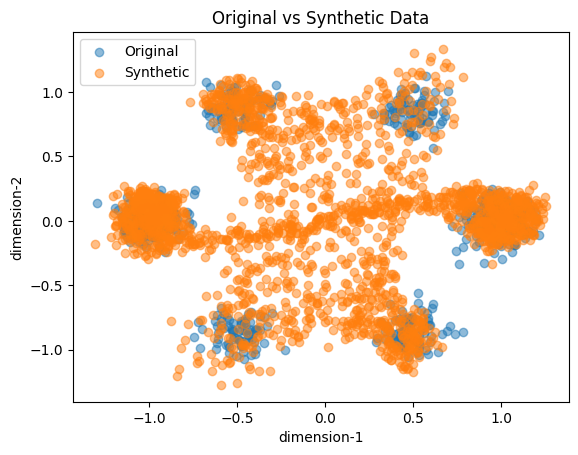

MMD Score (dataset_size=1000): 0.0141


In [39]:
# Generate synthetic samples for all labels
conditions_all_labels = torch.eye(condition_size)  # Assuming one-hot encoding

# Repeat the condition vector for each sample
conditions_all_labels = conditions_all_labels.repeat(1000, 1)

with torch.no_grad():
    synthetic_samples_all_labels = conditional_inn_model_gmm.sample(num_samples=2000, conditions=conditions_all_labels)

visualize_synthetic_data(val_data, synthetic_samples_all_labels)
plt.show()

### calculate the MMD score:
mmd_value = compute_mmd(val_data, synthetic_samples_all_labels)
print(f'MMD Score (dataset_size={dataset_size}): {mmd_value:.4f}')

# 3. Higher-dimensional data with an INN

## 3.1 Loading new data and Hyperparameter tuning

First we load the dataset and create different sizes

In [ ]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
import torch

# Load the digits dataset
digits = load_digits()

# Define the dataset percentages
dataset_percentages = [0.1, 0.5, 1]
digits = load_digits()
X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target, test_size=0.2)
val_dataset = {'X': torch.FloatTensor(X_test), 'y': y_test}

# Generate datasets of varying sizes
train_datasets = {}
for percentage in dataset_percentages:
    # Take a subset of the digits dataset based on the desired size
    size = int(len(y_train)*percentage)
    X, y = X_train[:size], y_train[:size]
    train_datasets[percentage] = {'X': torch.FloatTensor(X), 'y': y}

In [ ]:
def plot_code_distribution(model, test_loader):
    """
    Plot the code distribution obtained by applying the trained RealNVP model to a test dataset.

    Args:
    - model (RealNVP): Trained RealNVP model.
    - test_loader (DataLoader): DataLoader for the test dataset.
    - num_samples (int): Number of samples to visualize.

    Returns:
    None (displays the plot).
    """
    model.eval()  # Set the model to evaluation mode
    fig, axs = plt.subplots(2, 5, figsize=(20, 7))
    with torch.no_grad():
        # Concatenate multiple batches to obtain more samples
        test_samples = torch.cat([batch for batch in test_loader], dim=0)
        # Assuming your model has an `encode` method
        code_samples = model.encode(test_samples)

        # Convert PyTorch tensor to numpy array
        code_np = code_samples.numpy()
        dim_1 = 0
        dim_2 = 1
        for i in range(2):
            for j in range(5):
                # Scatter plot of code distribution
                axs[i,j].scatter(code_np[:, dim_1], code_np[:, dim_2], label='Code Distribution', alpha=0.5)
                axs[i,j].set_xlabel(f"Code Dimension {dim_1}")
                axs[i,j].set_ylabel(f"Code Dimension {dim_2}")
                axs[i,j].set_title(f'Code Distribution: {dim_2}')
                dim_1 += 1
                dim_2 += 1
        plt.tight_layout()
        plt.show()

In [ ]:
def visualize_synthetic_data(synthetic_data, title=""):
    """
    Scatter plot to visualize the original and synthetic data in 2D.

    Args:
    - synthetic_data (torch.Tensor): Synthetic data.

    Returns:
    - None: Displays the scatter plot.
    """
    fig, axs = plt.subplots(2, 5, figsize=(20, 7))
    # Ensure both original and synthetic data are converted to numpy arrays
    with torch.no_grad():
        # Convert PyTorch tensors to numpy arrays
        synthetic_np = synthetic_data.numpy()
        count = 0
        for i in range(2):
            for j in range(5):
                axs[i,j].imshow(synthetic_np[count].reshape(8, 8), cmap='gray')
                axs[i,j].set_title(f'Synthetic Image: {count}')
                count += 1
        # Scatter plot of original and synthetic data
        fig.suptitle(title)
        plt.show()

Now we test if our network works with the new dataset

Epoch 1/10, Training Loss: 19308.744353252907, Validation Loss: 308.0241241455078
Epoch 2/10, Training Loss: 151.0023258043372, Validation Loss: 260.6484127044678
Epoch 3/10, Training Loss: 129.43456749294114, Validation Loss: 241.6455866495768
Epoch 4/10, Training Loss: 115.87873409105384, Validation Loss: 231.48429171244302
Epoch 5/10, Training Loss: 106.71935371730639, Validation Loss: 228.04992612202963
Epoch 6/10, Training Loss: 100.71591966048531, Validation Loss: 232.55555311838785
Epoch 7/10, Training Loss: 95.37316413547681, Validation Loss: 227.84586747487387
Epoch 8/10, Training Loss: 91.04394149780273, Validation Loss: 230.0734135309855
Epoch 9/10, Training Loss: 87.94942756321119, Validation Loss: 229.5797259012858
Epoch 10/10, Training Loss: 83.55091410097869, Validation Loss: 240.51764233907065
Training complete


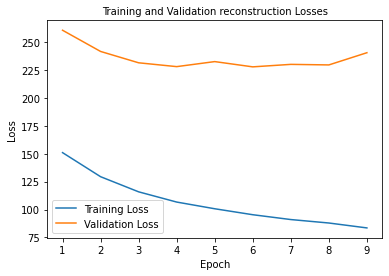

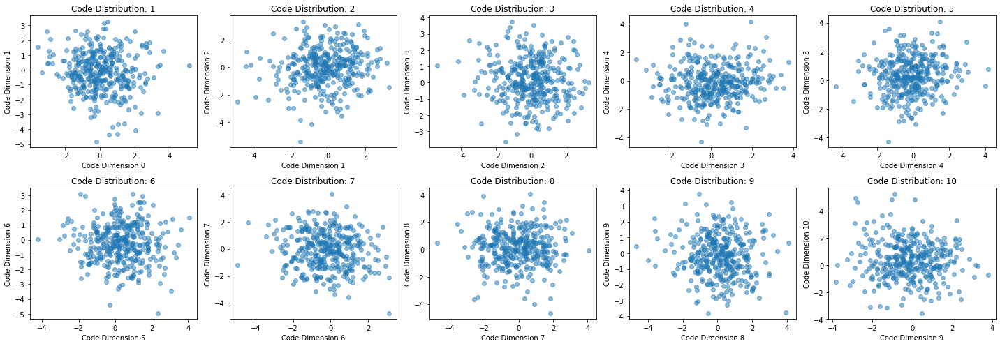

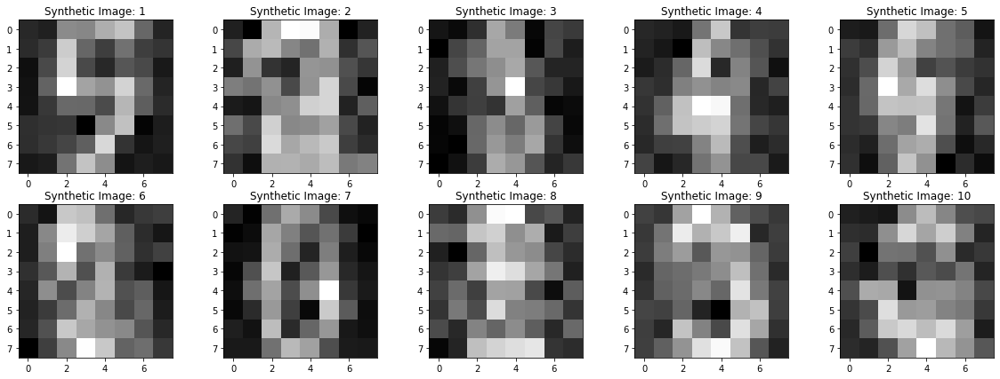

In [ ]:
input_size = 64
hidden_size = 200
blocks = 10

print_after=1

# initialize dataloader
dataset_percentage = 0.5
batch_size=32
data_considered=train_datasets[dataset_percentage]['X']
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=batch_size, shuffle=True)
val_loader= torch.utils.data.DataLoader(val_dataset['X'], batch_size=batch_size, shuffle=True)


# instantiate the model
model= RealNVP(input_size=input_size, hidden_size= hidden_size, blocks=blocks)

## train the model
train_losses, val_losses= train_and_evaluate(model, train_loader, val_loader, num_epochs=10, lr=0.001, print_after=1)

# plotting the loss
plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
plt.show()

# Example usage:
plot_code_distribution(model=model, test_loader=val_loader)
plt.show()

### plot the synthetic data and the original data
synthetic_data=model.sample(num_samples=len(data_considered))
visualize_synthetic_data(synthetic_data)
plt.show()

The code distribution looks quite resonable and gaussian distributed. The synthesized data is beginning to look like digits, but still quite noisy. Next we try to find the optimal hyperparameter.


Training for learning rate=0.01
Epoch 1/30, Training Loss: 8009.836741299099, Validation Loss: 288.0275885264079
Epoch 2/30, Training Loss: 76.08619503445095, Validation Loss: 256.4709021250407
Epoch 3/30, Training Loss: 68.7188730875651, Validation Loss: 241.0039800008138
Epoch 4/30, Training Loss: 65.80661010742188, Validation Loss: 232.09345626831055
Epoch 5/30, Training Loss: 63.3587641398112, Validation Loss: 228.34066772460938
Epoch 6/30, Training Loss: 61.78260345458985, Validation Loss: 224.1435661315918
Epoch 7/30, Training Loss: 61.00211885240343, Validation Loss: 221.20492553710938
Epoch 8/30, Training Loss: 59.872193315294055, Validation Loss: 222.45267963409424
Epoch 9/30, Training Loss: 58.49332021077474, Validation Loss: 216.29072443644205
Epoch 10/30, Training Loss: 57.88600684271918, Validation Loss: 214.59373696645102
Epoch 11/30, Training Loss: 57.48555611504449, Validation Loss: 212.99246056874594
Epoch 12/30, Training Loss: 57.16072599622938, Validation Loss: 217.

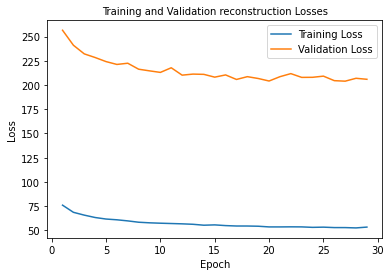

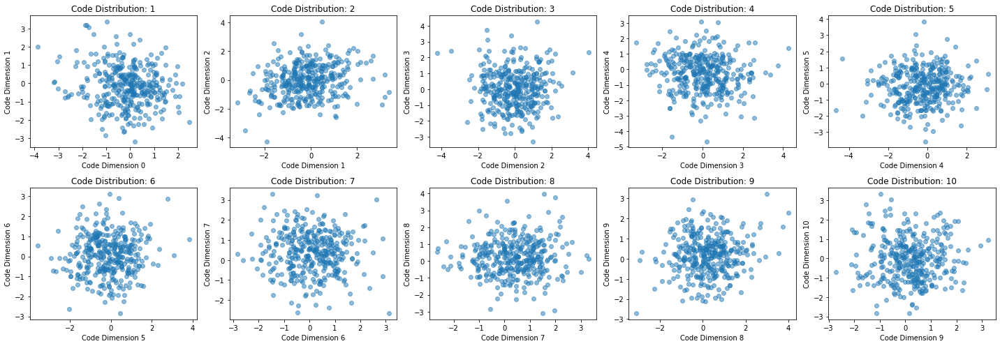

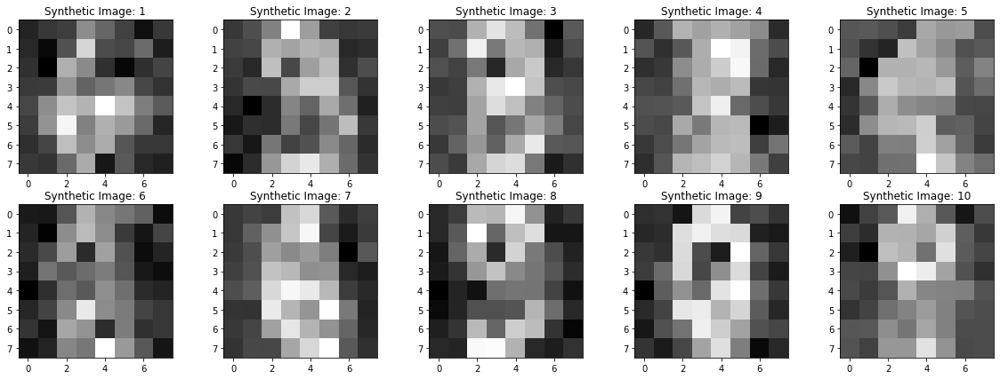


Training for learning rate=0.005
Epoch 1/30, Training Loss: 11817.525778198242, Validation Loss: 270.10508664449054
Epoch 2/30, Training Loss: 69.870982615153, Validation Loss: 232.40014362335205
Epoch 3/30, Training Loss: 62.34513236151801, Validation Loss: 220.9430373509725
Epoch 4/30, Training Loss: 58.622605387369795, Validation Loss: 211.92736530303955
Epoch 5/30, Training Loss: 55.77464650472005, Validation Loss: 207.57684199015299
Epoch 6/30, Training Loss: 53.64491526285807, Validation Loss: 202.77793534596762
Epoch 7/30, Training Loss: 51.990141211615665, Validation Loss: 199.2128356297811
Epoch 8/30, Training Loss: 50.460140482584634, Validation Loss: 198.17747497558594
Epoch 9/30, Training Loss: 50.364815860324434, Validation Loss: 198.5120356877645
Epoch 10/30, Training Loss: 49.0253177218967, Validation Loss: 196.53202692667642
Epoch 11/30, Training Loss: 47.818701171875, Validation Loss: 194.4502503077189
Epoch 12/30, Training Loss: 47.43562757703993, Validation Loss: 19

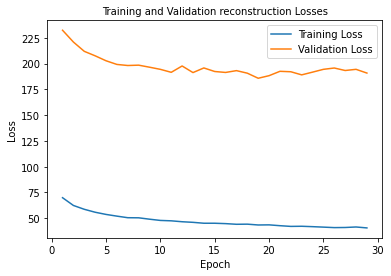

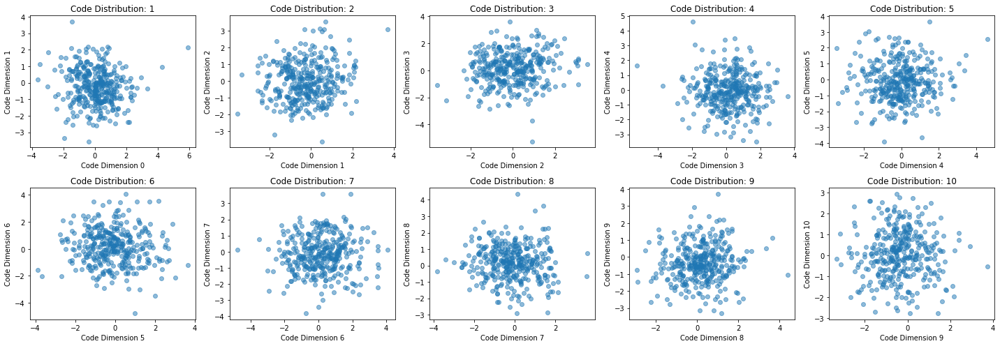

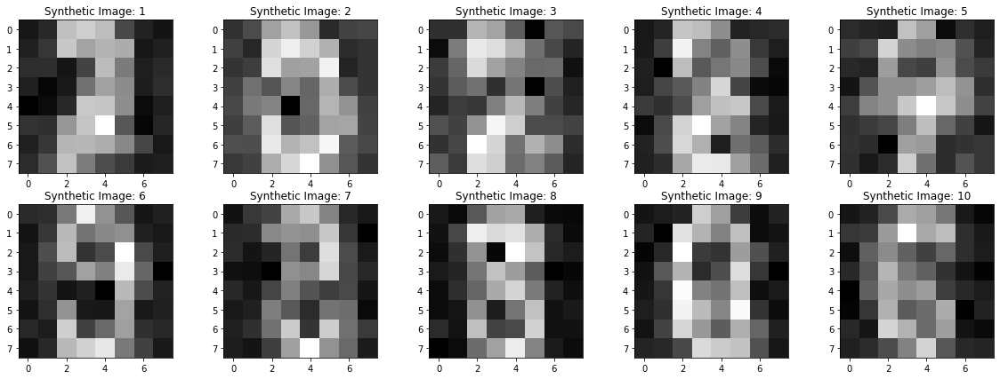


Training for learning rate=0.0005
Epoch 1/30, Training Loss: 3421.306739637587, Validation Loss: 288.54217465718585
Epoch 2/30, Training Loss: 73.53326305813259, Validation Loss: 245.20367558797201
Epoch 3/30, Training Loss: 64.15791592068142, Validation Loss: 227.901712735494
Epoch 4/30, Training Loss: 58.57548853556315, Validation Loss: 217.85050106048584
Epoch 5/30, Training Loss: 55.11601825290256, Validation Loss: 212.453226407369
Epoch 6/30, Training Loss: 52.042591603597, Validation Loss: 209.29950936635336
Epoch 7/30, Training Loss: 49.50460010104709, Validation Loss: 204.23781808217367
Epoch 8/30, Training Loss: 47.800843217637805, Validation Loss: 207.67214838663736
Epoch 9/30, Training Loss: 46.12979066636827, Validation Loss: 207.23672898610434
Epoch 10/30, Training Loss: 44.459814368353946, Validation Loss: 202.5842374165853
Epoch 11/30, Training Loss: 43.03138614230686, Validation Loss: 207.65548356374106
Epoch 12/30, Training Loss: 41.74035085042318, Validation Loss: 20

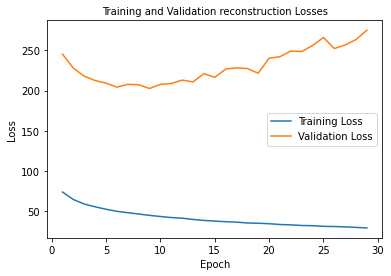

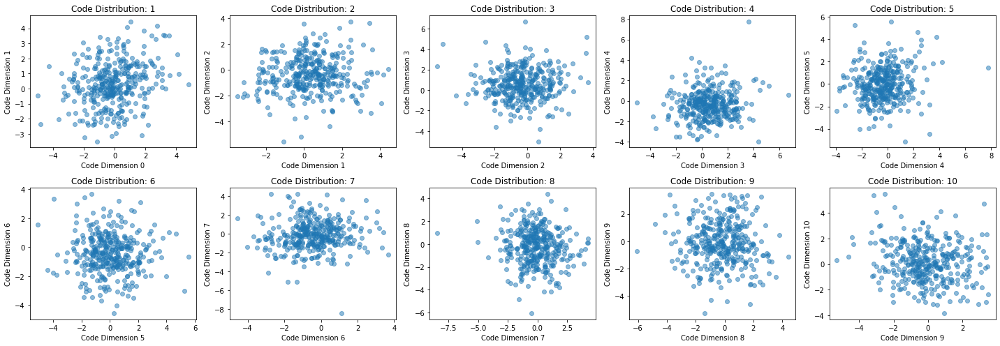

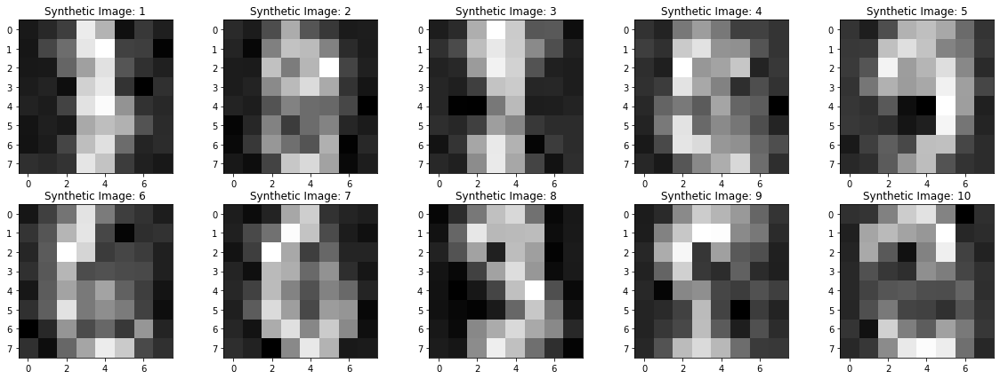


Training for learning rate=0.0001
Epoch 1/30, Training Loss: 50113.41761644151, Validation Loss: 436.48069826761883
Epoch 2/30, Training Loss: 101.97941606309679, Validation Loss: 320.2299327850342
Epoch 3/30, Training Loss: 85.60570593939887, Validation Loss: 290.40064366658527
Epoch 4/30, Training Loss: 78.33708835177951, Validation Loss: 272.7111422220866
Epoch 5/30, Training Loss: 73.4560770670573, Validation Loss: 260.9111525217692
Epoch 6/30, Training Loss: 69.79727257622613, Validation Loss: 252.03315226236978
Epoch 7/30, Training Loss: 66.88374820285374, Validation Loss: 245.57611910502115
Epoch 8/30, Training Loss: 64.33567445543078, Validation Loss: 239.41691970825195
Epoch 9/30, Training Loss: 62.18655675252278, Validation Loss: 234.46007283528647
Epoch 10/30, Training Loss: 60.42937969631619, Validation Loss: 231.49946689605713
Epoch 11/30, Training Loss: 58.72264811197917, Validation Loss: 229.10130310058594
Epoch 12/30, Training Loss: 57.17389127943251, Validation Loss: 

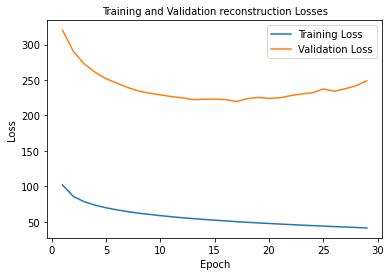

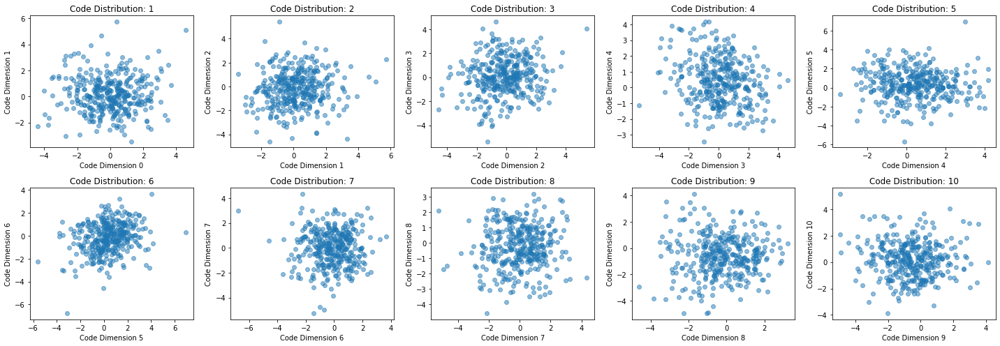

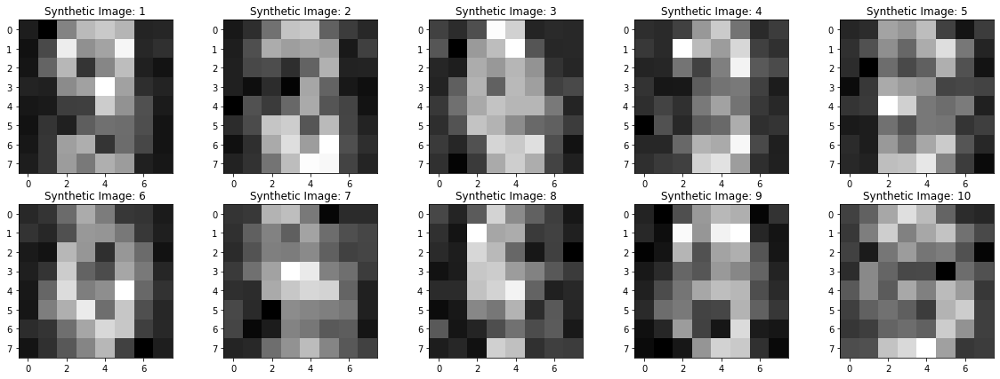


Training for learning rate=5e-06
Epoch 1/30, Training Loss: 209076.60121527777, Validation Loss: 405062.1399739583
Epoch 2/30, Training Loss: 69862.05911458333, Validation Loss: 127279.57747395833
Epoch 3/30, Training Loss: 22368.46755642361, Validation Loss: 39132.588623046875
Epoch 4/30, Training Loss: 7067.427842881944, Validation Loss: 13500.332214355469
Epoch 5/30, Training Loss: 2560.1897352430556, Validation Loss: 5463.914642333984
Epoch 6/30, Training Loss: 1113.8959011501736, Validation Loss: 2742.546442667643
Epoch 7/30, Training Loss: 608.1996073404948, Validation Loss: 1645.3327814737956
Epoch 8/30, Training Loss: 386.06957058376736, Validation Loss: 1121.6913019816081
Epoch 9/30, Training Loss: 277.5015930175781, Validation Loss: 843.8144543965658
Epoch 10/30, Training Loss: 216.93083055284288, Validation Loss: 683.6320292154948
Epoch 11/30, Training Loss: 180.46121758355034, Validation Loss: 585.8069547017416
Epoch 12/30, Training Loss: 157.36595323350696, Validation Los

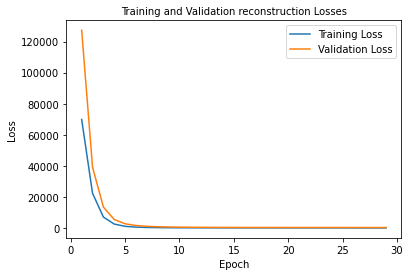

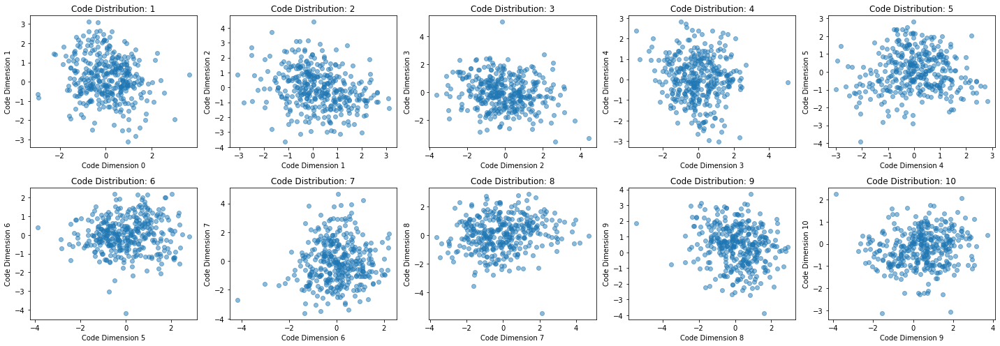

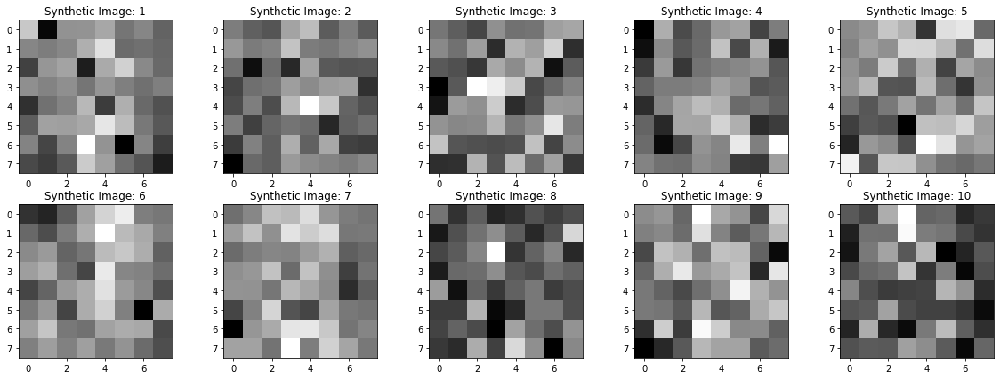

In [ ]:
learning_rates = [0.01,0.005,0.0005,0.0001,0.000005]
dataset_percentage = 1.0
# Create data loader for the fixed dataset size
data_considered = train_datasets[dataset_percentage]['X']
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset['X'], batch_size=32, shuffle=True)

for lr in learning_rates:
    print(f"\nTraining for learning rate={lr}")

    # Instantiate the model
    model = RealNVP(input_size=input_size, hidden_size=hidden_size, blocks=blocks)

    # Train the model
    train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=30, lr=lr, print_after=1)

    # plotting the loss
    plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
    plt.show()

    # Example usage:
    plot_code_distribution(model=model, test_loader=val_loader)
    plt.show()

    ### plot the synthetic data
    synthetic_data=model.sample(num_samples=len(data_considered))
    visualize_synthetic_data(synthetic_data)


We see, that the best results for the validation loss and the generated images are with a learning rate of lr= 0.005. Since we already see, that the algorithms starts to overfit at around 19 epochs, we wont need to analyze the epochs count and the dataset size: We already found the best epoch count and due to the occuring overfitting it would not make sense to further test smaller dataset sizes


Training for hidden_size=100, blocks = 2
Epoch 1/30, Training Loss: 294.7230936686198, Validation Loss: 571.6155484517416
Epoch 2/30, Training Loss: 141.9142296685113, Validation Loss: 468.15574010213214
Epoch 3/30, Training Loss: 124.05112999810113, Validation Loss: 420.20416831970215
Epoch 4/30, Training Loss: 114.67127126057943, Validation Loss: 405.47664070129395
Epoch 5/30, Training Loss: 112.06046108669705, Validation Loss: 401.04412778218585
Epoch 6/30, Training Loss: 109.06603291829427, Validation Loss: 385.57850710550946
Epoch 7/30, Training Loss: 104.84836205376519, Validation Loss: 383.4814968109131
Epoch 8/30, Training Loss: 102.67653469509548, Validation Loss: 399.0242977142334
Epoch 9/30, Training Loss: 102.31197408040364, Validation Loss: 360.4715805053711
Epoch 10/30, Training Loss: 99.84381306966146, Validation Loss: 357.0197696685791
Epoch 11/30, Training Loss: 99.02914411756727, Validation Loss: 355.18566576639813
Epoch 12/30, Training Loss: 97.31855146620009, Valid

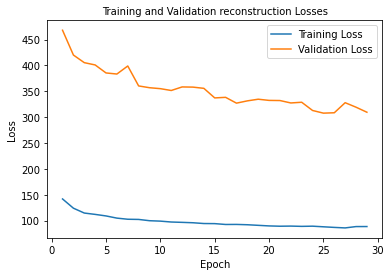

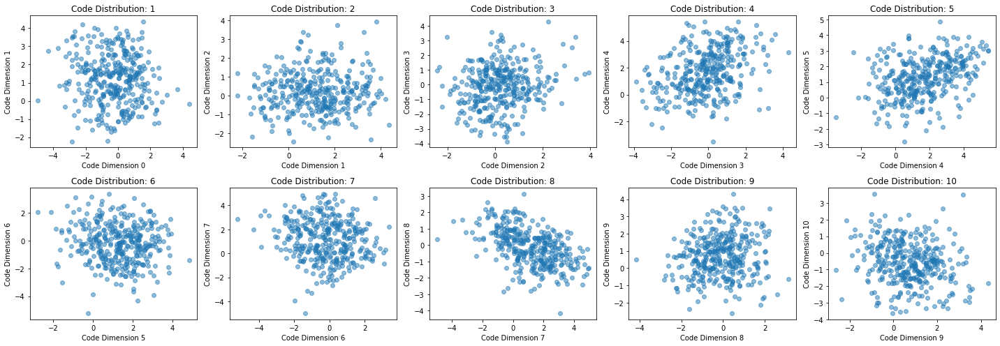

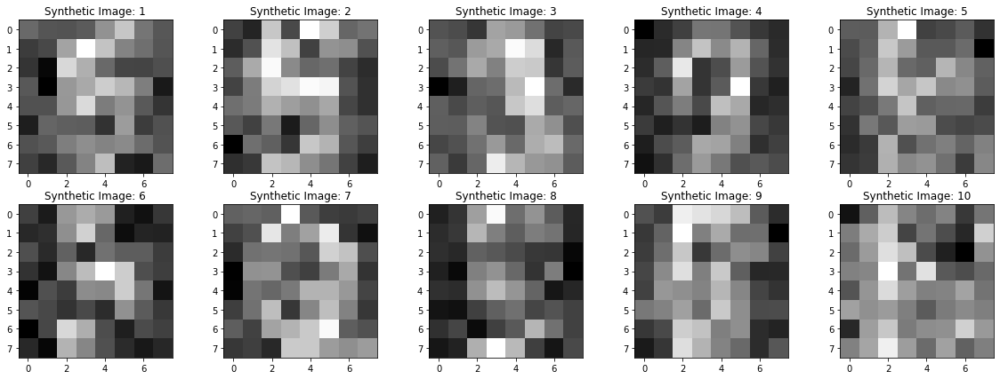


Training for hidden_size=100, blocks = 5
Epoch 1/30, Training Loss: 265.01097886827256, Validation Loss: 301.99928347269696
Epoch 2/30, Training Loss: 77.97027062310113, Validation Loss: 256.44384956359863
Epoch 3/30, Training Loss: 69.68282352023654, Validation Loss: 241.7223745981852
Epoch 4/30, Training Loss: 65.50670505099826, Validation Loss: 230.7071574529012
Epoch 5/30, Training Loss: 62.328228335910374, Validation Loss: 224.24456691741943
Epoch 6/30, Training Loss: 60.30294715033637, Validation Loss: 218.9724578857422
Epoch 7/30, Training Loss: 58.39633288913303, Validation Loss: 218.47990926106772
Epoch 8/30, Training Loss: 56.874779001871744, Validation Loss: 212.0576960245768
Epoch 9/30, Training Loss: 56.036871846516924, Validation Loss: 210.8950433731079
Epoch 10/30, Training Loss: 55.106080034044055, Validation Loss: 207.61690107981363
Epoch 11/30, Training Loss: 54.76850458780925, Validation Loss: 213.44031524658203
Epoch 12/30, Training Loss: 53.71915673149957, Validat

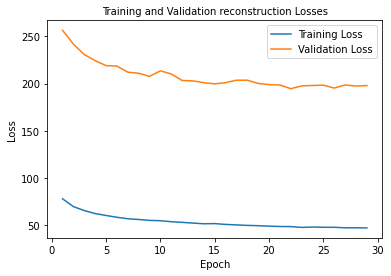

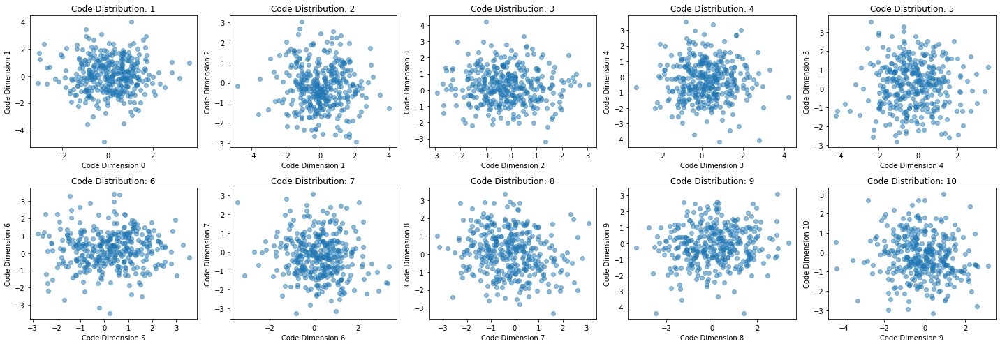

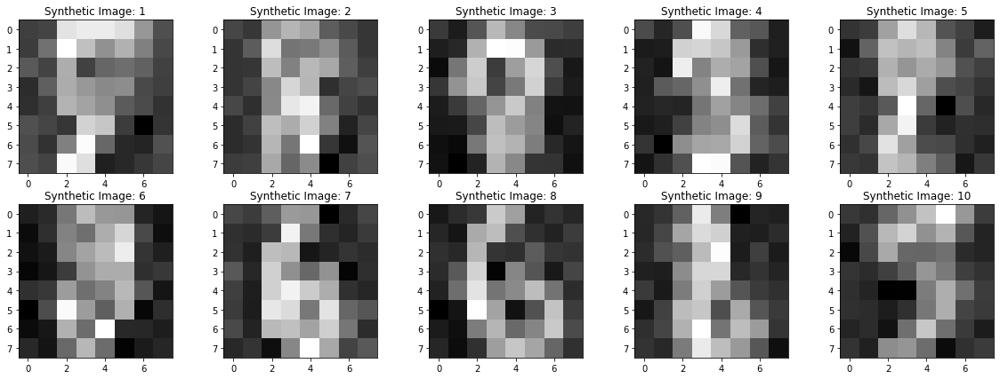


Training for hidden_size=100, blocks = 10
Epoch 1/30, Training Loss: 9436.184055074056, Validation Loss: 263.33286539713544
Epoch 2/30, Training Loss: 67.61033986409505, Validation Loss: 228.6816488901774
Epoch 3/30, Training Loss: 60.80630026923286, Validation Loss: 215.70353666941324
Epoch 4/30, Training Loss: 57.06355929904514, Validation Loss: 208.36373488108316
Epoch 5/30, Training Loss: 54.60490230984158, Validation Loss: 203.7723045349121
Epoch 6/30, Training Loss: 52.81721649169922, Validation Loss: 198.82628377278647
Epoch 7/30, Training Loss: 51.284493425157336, Validation Loss: 196.23615233103433
Epoch 8/30, Training Loss: 50.3772331237793, Validation Loss: 195.4634517033895
Epoch 9/30, Training Loss: 49.036874050564236, Validation Loss: 190.6725641886393
Epoch 10/30, Training Loss: 47.81766933865018, Validation Loss: 191.61908117930093
Epoch 11/30, Training Loss: 47.524300469292534, Validation Loss: 191.0384251276652
Epoch 12/30, Training Loss: 46.822449662950305, Validati

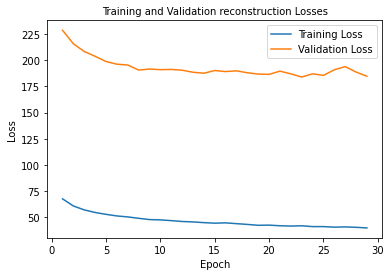

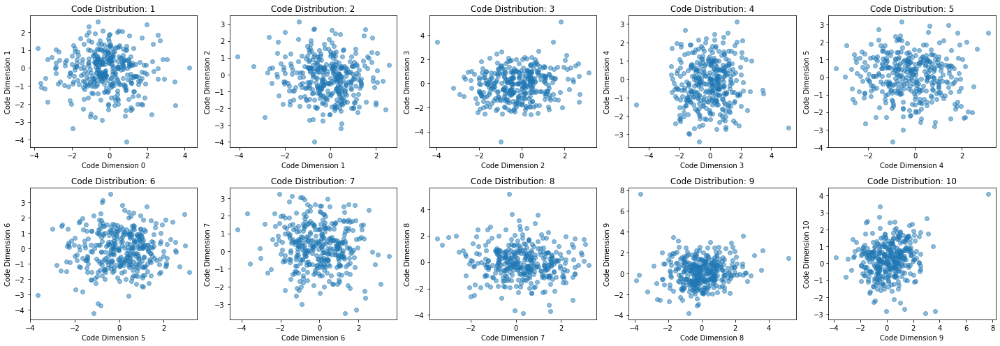

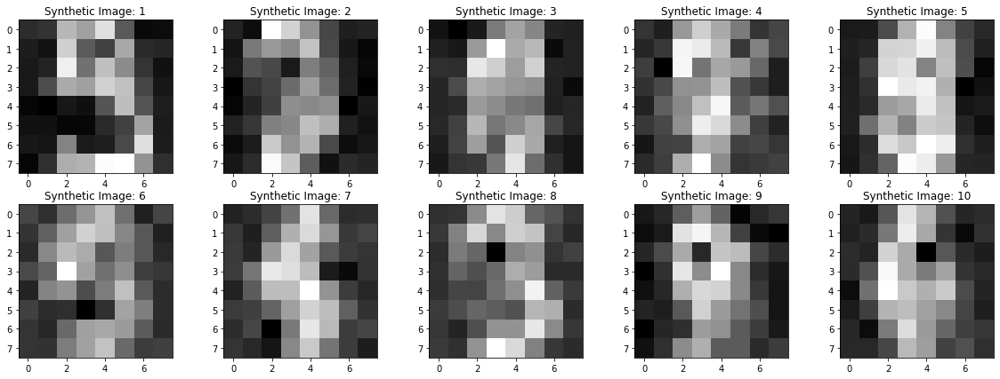


Training for hidden_size=200, blocks = 2
Epoch 1/30, Training Loss: 216.53725297715928, Validation Loss: 444.19052505493164
Epoch 2/30, Training Loss: 113.37141401502821, Validation Loss: 364.4847469329834
Epoch 3/30, Training Loss: 100.15595075819228, Validation Loss: 345.93261528015137
Epoch 4/30, Training Loss: 94.53593071831597, Validation Loss: 331.55730120340985
Epoch 5/30, Training Loss: 92.21392093234591, Validation Loss: 324.0475031534831
Epoch 6/30, Training Loss: 88.54855431450738, Validation Loss: 308.84101994832355
Epoch 7/30, Training Loss: 86.4598612467448, Validation Loss: 309.0832977294922
Epoch 8/30, Training Loss: 84.3639392428928, Validation Loss: 306.3279215494792
Epoch 9/30, Training Loss: 83.28580000135634, Validation Loss: 311.41941324869794
Epoch 10/30, Training Loss: 81.50191514756945, Validation Loss: 296.9877471923828
Epoch 11/30, Training Loss: 79.26307542588975, Validation Loss: 278.895850499471
Epoch 12/30, Training Loss: 78.94070926242405, Validation Lo

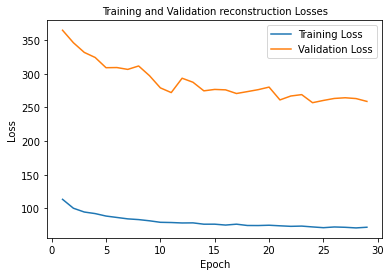

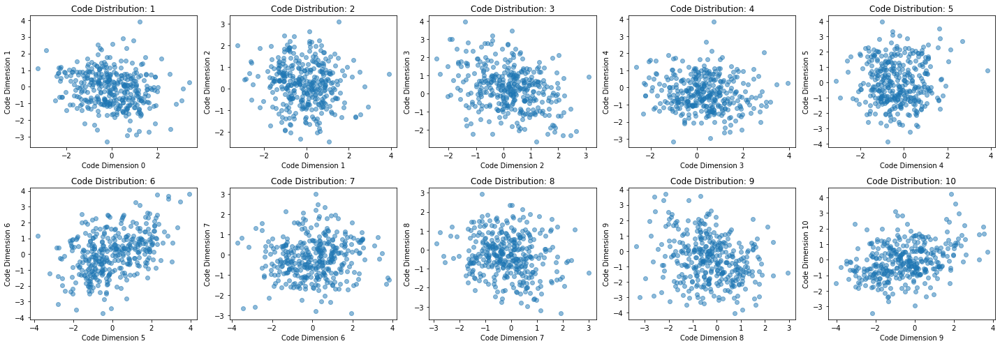

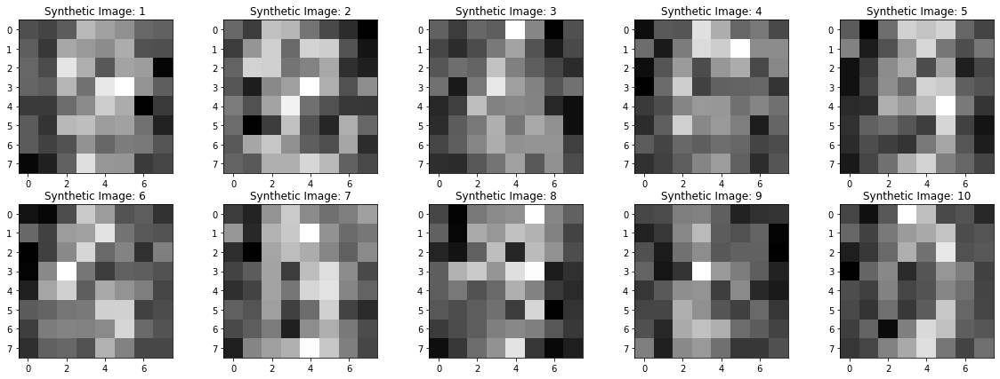


Training for hidden_size=200, blocks = 5
Epoch 1/30, Training Loss: 309.551146613227, Validation Loss: 296.65241622924805
Epoch 2/30, Training Loss: 77.70625271267362, Validation Loss: 259.46020062764484
Epoch 3/30, Training Loss: 69.53970616658529, Validation Loss: 240.80973148345947
Epoch 4/30, Training Loss: 65.07096065945096, Validation Loss: 229.57966740926108
Epoch 5/30, Training Loss: 62.08271713256836, Validation Loss: 223.40517075856528
Epoch 6/30, Training Loss: 59.97387279934353, Validation Loss: 221.47677834828696
Epoch 7/30, Training Loss: 58.47309239705404, Validation Loss: 217.21256033579508
Epoch 8/30, Training Loss: 56.85402018229167, Validation Loss: 214.76035340627035
Epoch 9/30, Training Loss: 55.775561014811196, Validation Loss: 210.1625213623047
Epoch 10/30, Training Loss: 54.69895239935981, Validation Loss: 212.7543576558431
Epoch 11/30, Training Loss: 54.13418511284722, Validation Loss: 206.8346061706543
Epoch 12/30, Training Loss: 53.188574133978946, Validatio

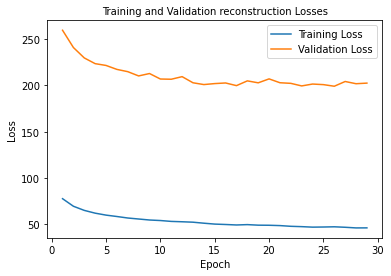

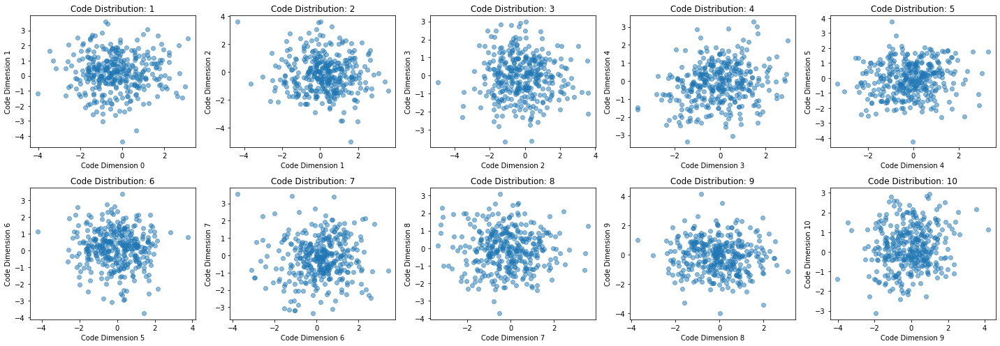

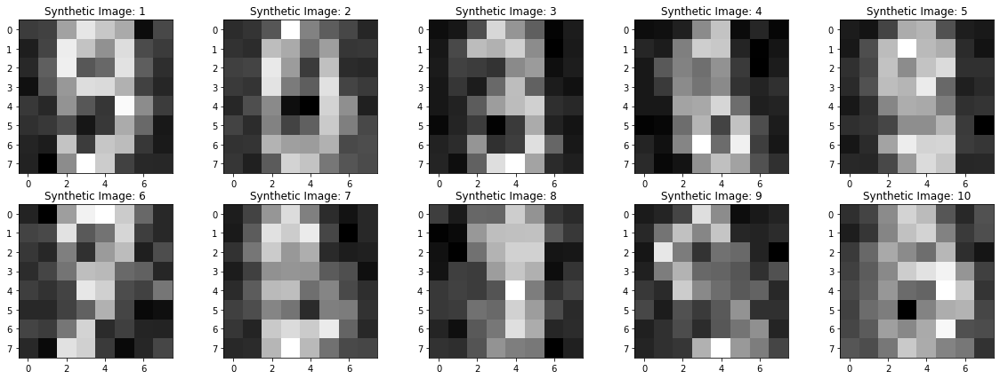


Training for hidden_size=200, blocks = 10
Epoch 1/30, Training Loss: 6492.414649454752, Validation Loss: 282.70446332295734
Epoch 2/30, Training Loss: 73.40664850870768, Validation Loss: 246.55630683898926
Epoch 3/30, Training Loss: 64.3135969373915, Validation Loss: 226.65690644582114
Epoch 4/30, Training Loss: 60.09317186143663, Validation Loss: 215.6777229309082
Epoch 5/30, Training Loss: 57.14421852959527, Validation Loss: 210.23212718963623
Epoch 6/30, Training Loss: 55.430495198567705, Validation Loss: 204.4380890528361
Epoch 7/30, Training Loss: 53.62228147718641, Validation Loss: 208.22985331217447
Epoch 8/30, Training Loss: 52.40490570068359, Validation Loss: 201.35067780812582
Epoch 9/30, Training Loss: 51.76244778103299, Validation Loss: 199.5050137837728
Epoch 10/30, Training Loss: 50.03342141045464, Validation Loss: 195.68669923146567
Epoch 11/30, Training Loss: 49.121512010362416, Validation Loss: 197.29208914438883
Epoch 12/30, Training Loss: 48.897773827446834, Validat

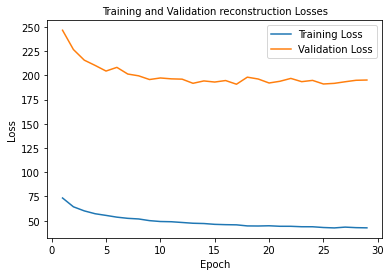

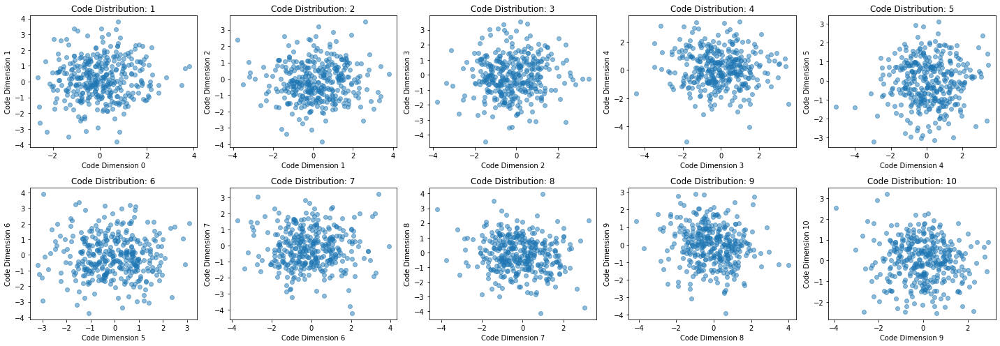

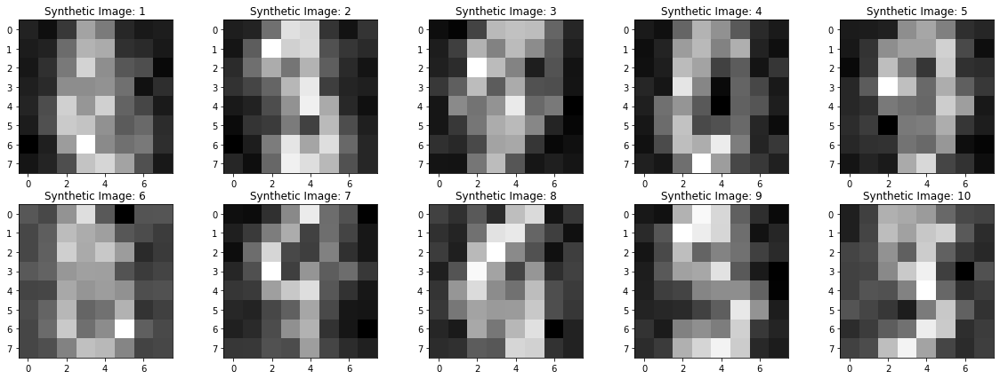


Training for hidden_size=400, blocks = 2
Epoch 1/30, Training Loss: 307.47569749620226, Validation Loss: 660.282797495524
Epoch 2/30, Training Loss: 180.9752634684245, Validation Loss: 812.9520988464355
Epoch 3/30, Training Loss: 173.47369859483507, Validation Loss: 569.1646308898926
Epoch 4/30, Training Loss: 159.17198621961805, Validation Loss: 565.31818262736
Epoch 5/30, Training Loss: 158.90091518825955, Validation Loss: 551.1031494140625
Epoch 6/30, Training Loss: 159.60764600965712, Validation Loss: 574.1276728312174
Epoch 7/30, Training Loss: 145.9571780734592, Validation Loss: 495.2603123982747
Epoch 8/30, Training Loss: 142.371486070421, Validation Loss: 491.8583634694417
Epoch 9/30, Training Loss: 141.50491773817274, Validation Loss: 498.96835072835285
Epoch 10/30, Training Loss: 143.82400377061632, Validation Loss: 492.4005317687988
Epoch 11/30, Training Loss: 146.19541456434462, Validation Loss: 574.3242225646973
Epoch 12/30, Training Loss: 145.28963758680555, Validation L

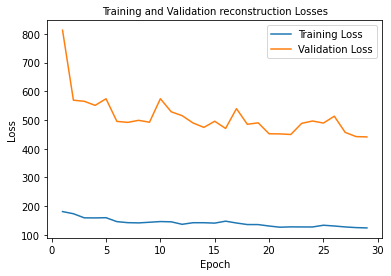

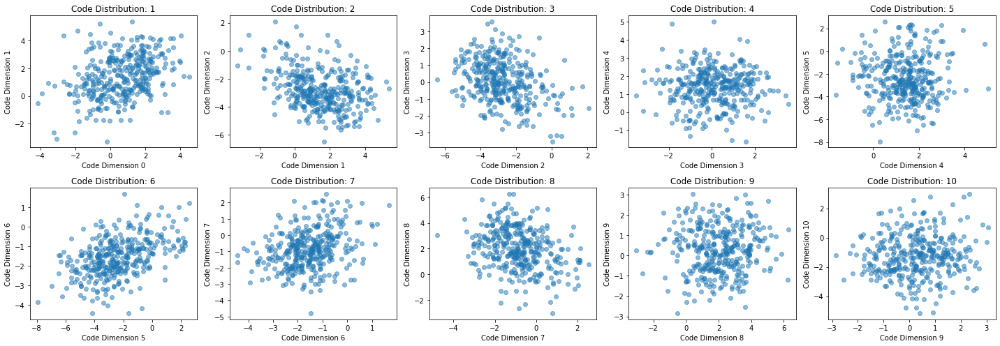

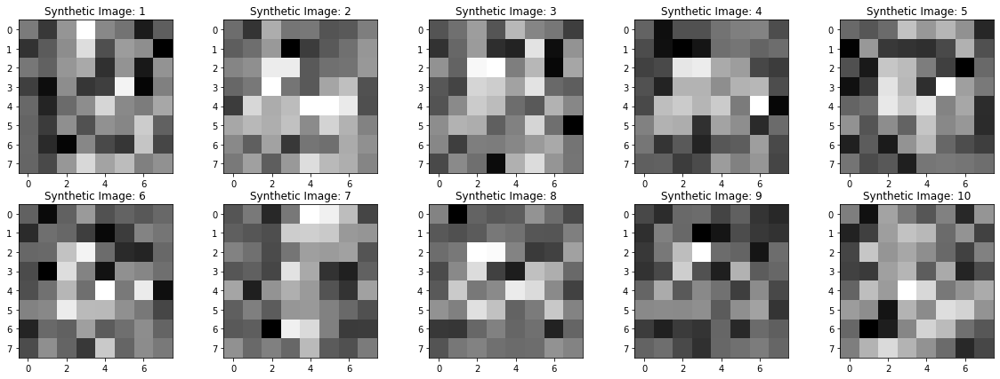


Training for hidden_size=400, blocks = 5
Epoch 1/30, Training Loss: 316.47518547905815, Validation Loss: 309.94998868306476
Epoch 2/30, Training Loss: 82.13634084065755, Validation Loss: 275.5159142812093
Epoch 3/30, Training Loss: 74.84136166042752, Validation Loss: 262.6661961873372
Epoch 4/30, Training Loss: 70.7937240600586, Validation Loss: 249.78180122375488
Epoch 5/30, Training Loss: 68.1334605746799, Validation Loss: 245.63199742635092
Epoch 6/30, Training Loss: 65.83484369913737, Validation Loss: 234.56178633371988
Epoch 7/30, Training Loss: 63.888429175482855, Validation Loss: 240.55420271555582
Epoch 8/30, Training Loss: 62.737112765842014, Validation Loss: 235.59585825602213
Epoch 9/30, Training Loss: 62.29926893446181, Validation Loss: 233.10778681437174
Epoch 10/30, Training Loss: 61.70500666300456, Validation Loss: 228.81559340159097
Epoch 11/30, Training Loss: 60.07350964016385, Validation Loss: 227.86209615071616
Epoch 12/30, Training Loss: 59.456063503689236, Validat

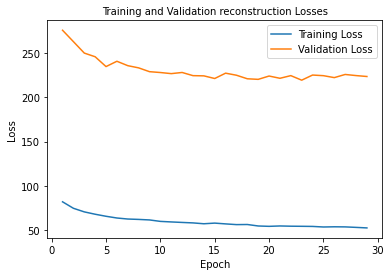

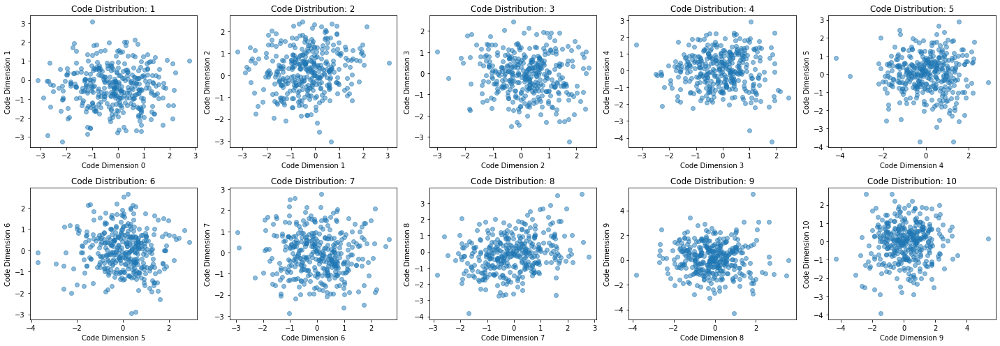

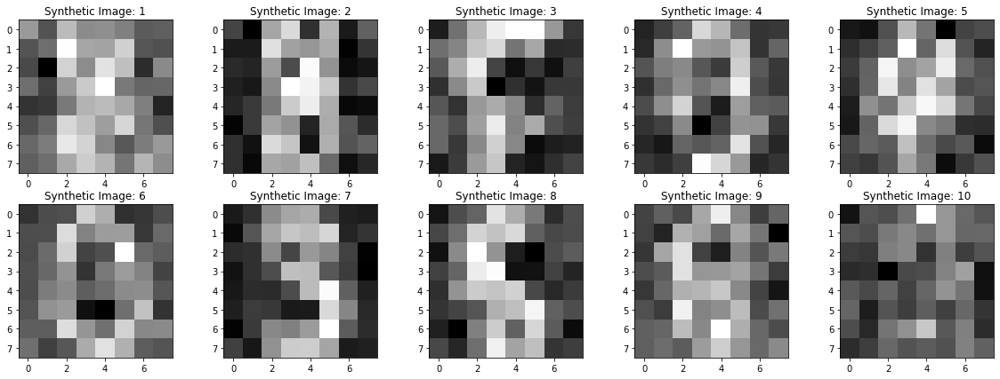


Training for hidden_size=400, blocks = 10
Epoch 1/30, Training Loss: 13539.159749179416, Validation Loss: 342.41082700093585
Epoch 2/30, Training Loss: 86.58183034261067, Validation Loss: 278.1364510854085
Epoch 3/30, Training Loss: 75.3851586235894, Validation Loss: 259.4295717875163
Epoch 4/30, Training Loss: 70.06561041937934, Validation Loss: 287.4711570739746
Epoch 5/30, Training Loss: 67.08853412204319, Validation Loss: 243.05325508117676
Epoch 6/30, Training Loss: 64.71018481784397, Validation Loss: 239.3382879892985
Epoch 7/30, Training Loss: 63.28148990207248, Validation Loss: 233.9927625656128
Epoch 8/30, Training Loss: 61.262958187527126, Validation Loss: 225.98743216196695
Epoch 9/30, Training Loss: 60.458206515842015, Validation Loss: 230.18698183695474
Epoch 10/30, Training Loss: 58.9208381652832, Validation Loss: 224.2623545328776
Epoch 11/30, Training Loss: 58.24448852539062, Validation Loss: 221.45679410298666
Epoch 12/30, Training Loss: 56.951568094889325, Validation

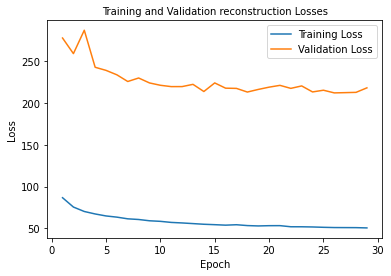

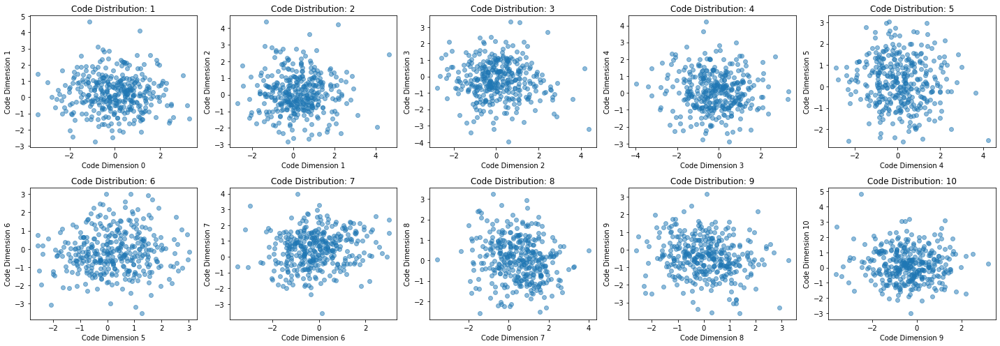

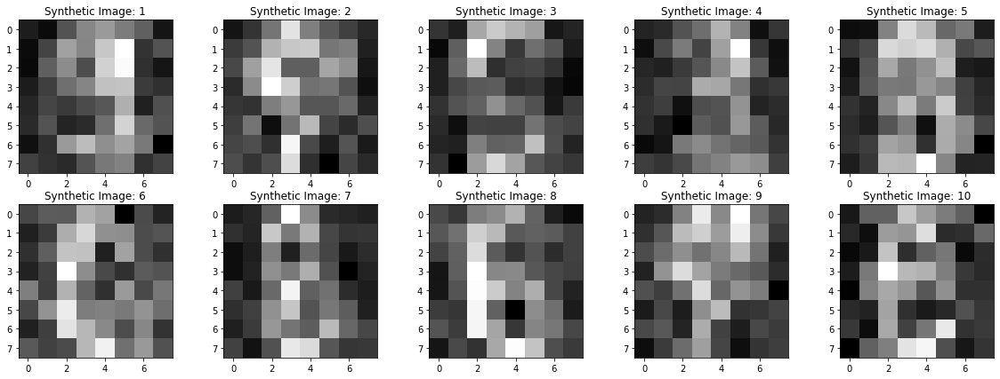

In [ ]:
hidden_sizes = [100, 200, 400]
blocks = [2, 5, 10]
input_size = 64

dataset_percentage = 1.0
# Create data loader for the fixed dataset size
data_considered = train_datasets[dataset_percentage]['X']
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset['X'], batch_size=32, shuffle=True)

for hidden_size in hidden_sizes:
    for block in blocks:
        print(f"\nTraining for hidden_size={hidden_size}, blocks = {block}")

        # Instantiate the model
        model = RealNVP(input_size=input_size, hidden_size=hidden_size, blocks=block)

        # Train the model
        train_losses, val_losses = train_and_evaluate(model, train_loader, val_loader, num_epochs=30, lr=0.005, print_after=1)

        # plotting the loss
        plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
        plt.show()

        # Example usage:
        plot_code_distribution(model=model, test_loader=val_loader)
        plt.show()

        ### plot the synthetic data
        synthetic_data=model.sample(num_samples=len(data_considered))
        visualize_synthetic_data(synthetic_data)


We see, the best network structure appears to be hidden size of 100 and 10 blocks

## 3.2 Adding artificial bottleneck

In [ ]:
class RealNVP_bottleneck(nn.Module):
    def __init__(self, input_size, hidden_size, blocks, k):
        super(RealNVP_bottleneck, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.blocks = blocks
        self.k = k

        # List of coupling layers
        self.coupling_layers = nn.ModuleList([
            CouplingLayer(input_size, hidden_size) for _ in range(blocks)
        ])


        # List to store orthonormal matrices
        self.orthonormal_matrices = [self._get_orthonormal_matrix(input_size) for _ in range(blocks)]

        # List to store scaling_before_exp for each block
        self.scaling_before_exp_list = []

    def _get_orthonormal_matrix(self, size):
        # Function to generate a random orthonormal matrix
        w = torch.randn(size, size)
        q, _ = torch.linalg.qr(w,'reduced')
        return q

    def forward_realnvp(self, x):
        scaling_before_exp_list = []
        for i in range(self.blocks):

            # Apply random orthonormal matrix
            x = torch.matmul(x, self.orthonormal_matrices[i])

            # Apply coupling layer
            x, scaling_before_exp = self.coupling_layers[i].forward(x)
            scaling_before_exp_list.append(scaling_before_exp)

        self.scaling_before_exp_list = scaling_before_exp_list
        return x

    def encode(self, x):
        # Encoding is the forward pass through the RealNVP model
        return self.forward_realnvp(x)

    def decode(self, z):
        # Modify z to zero out dimensions beyond k for the reconstruction
        z_reconstructed = z.clone()
        if self.k < self.input_size:
            z_reconstructed[:, self.k:] = 0  # Zero out dimensions beyond k

         # Proceed with the original decoding process
        for i in reversed(range(self.blocks)):
            z = self.coupling_layers[i].backward(z)
            z_reconstructed = self.coupling_layers[i].backward(z_reconstructed)
            z = torch.matmul(z, self.orthonormal_matrices[i].t())
            z_reconstructed = torch.matmul(z_reconstructed, self.orthonormal_matrices[i].t())

        return z, z_reconstructed

    def sample(self, num_samples=1000):
        # Generate random samples from a standard normal distribution
        with torch.no_grad():
            z = torch.randn(num_samples, self.input_size)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        _,synthetic_samples = self.decode(z)
        return synthetic_samples

    def sample_only_important(self, num_samples=1000):
        # Generate random samples from a standard normal distribution
        with torch.no_grad():
            z_1 = torch.randn(num_samples, self.k)
            z_2 = torch.zeros(num_samples, self.input_size - self.k)
            z = torch.cat((z_1, z_2), dim=1)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        _,synthetic_samples = self.decode(z)
        return synthetic_samples

    def sample_only_unimportant(self, num_samples=1000):
        # Generate random samples from a standard normal distribution

        with torch.no_grad():
            z_1 = torch.randn(1, self.k).repeat(num_samples, 1)
            z_2 = torch.randn(num_samples, self.input_size - self.k)
            z = torch.cat((z_1, z_2), dim=1)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        _,synthetic_samples = self.decode(z)
        return synthetic_samples

In [ ]:
import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_evaluate(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1):
    """
    Train the RealNVP model and evaluate on a validation dataset.

    Args:
    - model (RealNVP): The RealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    train_losses_nll = []
    val_losses_nll = []
    train_losses_recons = []
    val_losses_recons = []
    # Training phase
    model.train()  # Set the model to training mode

    for epoch in range(num_epochs):
        total_train_loss_nll = 0.0
        total_train_loss_recons = 0.0

        for data in train_loader:
            inputs= data

            # Zero the gradients
            optimizer.zero_grad()

            # NLL Loss calculation
            encoded = model.encode(inputs)
            train_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Reconstruction loss calculation
            _, decoded = model.decode(encoded)
            train_loss_recons = mse_loss(inputs, decoded)

            # Backward pass (gradient computation)
            loss = train_loss_nll + train_loss_recons
            loss.backward()

            ### added recently: clip the gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)  # Adjust max_norm as needed

            # Update weights
            optimizer.step()

            total_train_loss_nll += train_loss_nll.item()
            total_train_loss_recons += train_loss_recons.item()

        # Average training loss for the epoch
        average_train_loss_nll = total_train_loss_nll / len(train_loader)
        average_train_loss_recons = total_train_loss_recons / len(train_loader)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        if val_loader is not None:
            total_val_loss_nll = 0.0
            total_val_loss_recons = 0.0
            with torch.no_grad():
                for val_data in val_loader:
                    val_inputs = val_data

                    # NLL Loss calculation
                    encoded = model.encode(val_inputs)
                    val_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(val_loader))

                    # Reconstruction loss calculation
                    _, decoded = model.decode(encoded)
                    val_loss_recons = mse_loss(val_inputs, decoded)

                    total_val_loss_nll += val_loss_nll.item()
                    total_val_loss_recons += val_loss_recons.item()

            # Average validation loss for the epoch
            average_val_loss_nll = total_val_loss_nll / len(val_loader)
            average_val_loss_recons = total_val_loss_recons / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss_recons+average_train_loss_nll}, Validation Loss: {average_val_loss_nll+average_val_loss_recons}")

            # Append losses to the lists
            train_losses_nll.append(average_train_loss_nll)
            val_losses_nll.append(average_val_loss_nll)
            train_losses_recons.append(average_train_loss_recons)
            val_losses_recons.append(average_val_loss_recons)


        # Set the model back to training mode
        model.train()

    print("Training complete")

    return train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons


Training for k=2
Epoch 1/20, Training Loss: 1134181.2054025438, Validation Loss: 393.4980107943217
Epoch 2/20, Training Loss: 104.72341115739611, Validation Loss: 277.5674916903178
Epoch 3/20, Training Loss: 85.00006866455078, Validation Loss: 252.0516587893168
Epoch 4/20, Training Loss: 77.07950909932454, Validation Loss: 236.80850172042847
Epoch 5/20, Training Loss: 72.53351398044163, Validation Loss: 228.5046550432841
Epoch 6/20, Training Loss: 69.57301697201198, Validation Loss: 222.44894289970398
Epoch 7/20, Training Loss: 67.61917934417724, Validation Loss: 218.56156961123148
Epoch 8/20, Training Loss: 65.83680402967664, Validation Loss: 215.66464479764304
Epoch 9/20, Training Loss: 64.46760686238606, Validation Loss: 212.84963099161783
Epoch 10/20, Training Loss: 63.096194140116374, Validation Loss: 213.09209056695303
Epoch 11/20, Training Loss: 62.07158679962158, Validation Loss: 207.5499466260274
Epoch 12/20, Training Loss: 61.22519813113742, Validation Loss: 212.946069558461

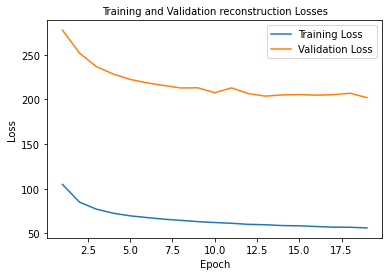

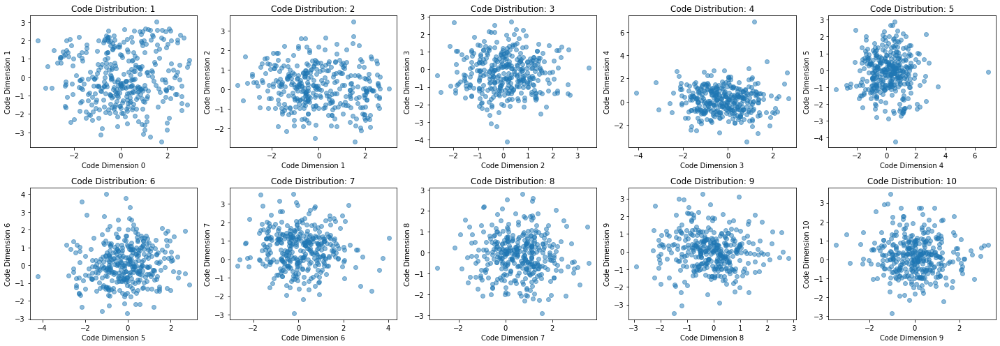

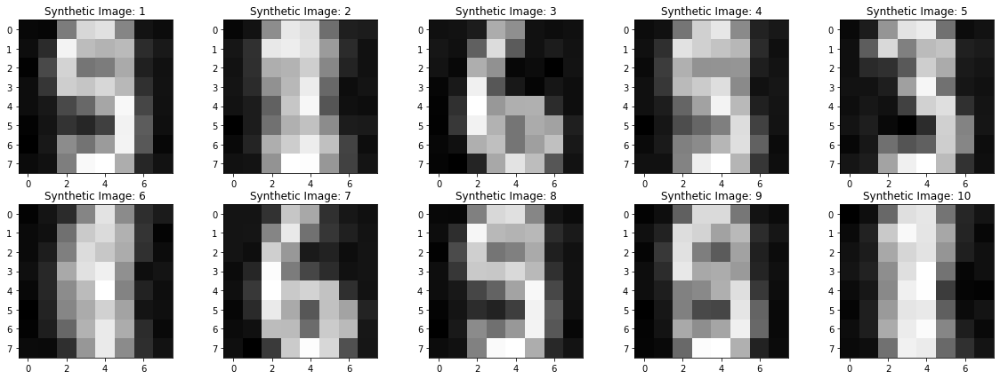


Training for k=4
Epoch 1/20, Training Loss: 1764351.6226888022, Validation Loss: 6121.43034807841
Epoch 2/20, Training Loss: 305.77129427591956, Validation Loss: 328.2409567832947
Epoch 3/20, Training Loss: 93.7455064561632, Validation Loss: 274.5516738096873
Epoch 4/20, Training Loss: 80.29229000939263, Validation Loss: 248.36701107025146
Epoch 5/20, Training Loss: 74.14117916954888, Validation Loss: 236.20576540629068
Epoch 6/20, Training Loss: 69.56096011267768, Validation Loss: 228.18267114957172
Epoch 7/20, Training Loss: 66.54357260598077, Validation Loss: 219.3884553114573
Epoch 8/20, Training Loss: 64.57242608600193, Validation Loss: 215.73117335637411
Epoch 9/20, Training Loss: 62.44744293424819, Validation Loss: 211.98541418711343
Epoch 10/20, Training Loss: 60.773972034454346, Validation Loss: 208.40398891766867
Epoch 11/20, Training Loss: 59.45615416632758, Validation Loss: 205.69273841381073
Epoch 12/20, Training Loss: 58.051778125762944, Validation Loss: 206.466516733169

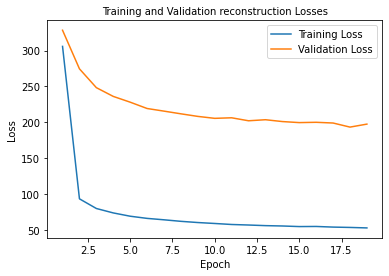

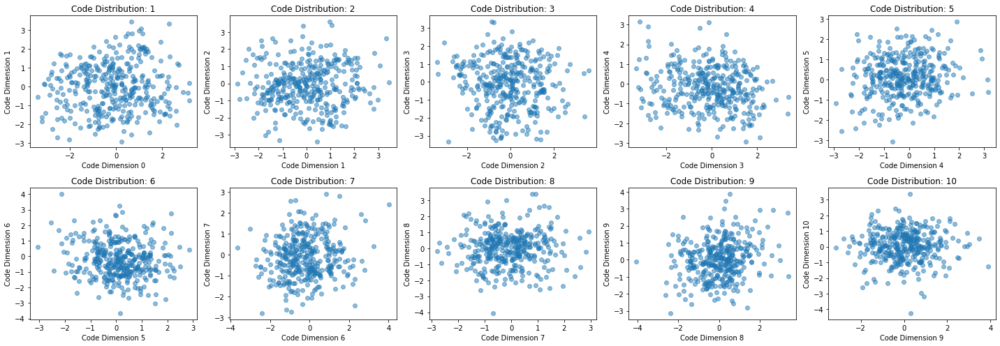

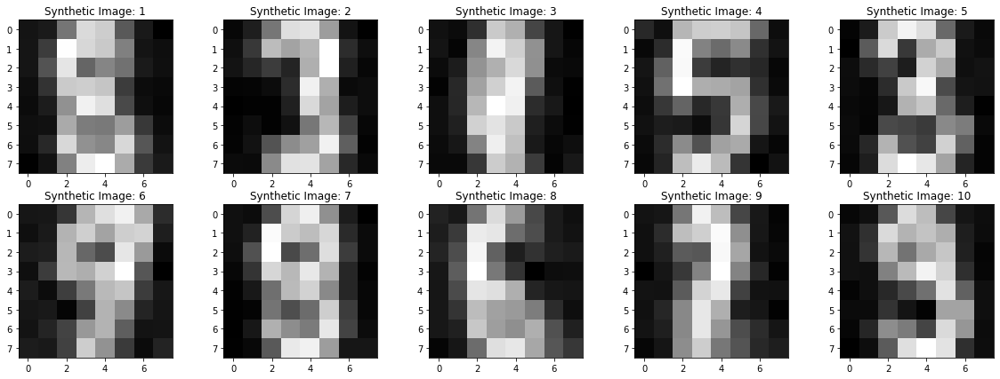


Training for k=8
Epoch 1/20, Training Loss: 3957463.0584517587, Validation Loss: 678.2395188013713
Epoch 2/20, Training Loss: 127.46482734680175, Validation Loss: 297.8124193350474
Epoch 3/20, Training Loss: 85.34479524824354, Validation Loss: 255.7841518719991
Epoch 4/20, Training Loss: 75.56492190890842, Validation Loss: 241.27586038907367
Epoch 5/20, Training Loss: 70.02874931759305, Validation Loss: 227.84788632392883
Epoch 6/20, Training Loss: 66.06599095662435, Validation Loss: 219.99094394842783
Epoch 7/20, Training Loss: 63.42344832950168, Validation Loss: 215.41912790139514
Epoch 8/20, Training Loss: 61.34067319234212, Validation Loss: 213.2213078737259
Epoch 9/20, Training Loss: 59.875758753882515, Validation Loss: 210.1514040629069
Epoch 10/20, Training Loss: 58.376855532328285, Validation Loss: 208.3204576174418
Epoch 11/20, Training Loss: 56.99812969631619, Validation Loss: 199.2074755827586
Epoch 12/20, Training Loss: 55.90390529632568, Validation Loss: 201.8850393295288

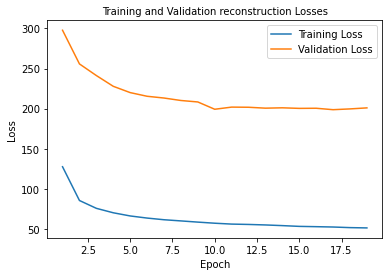

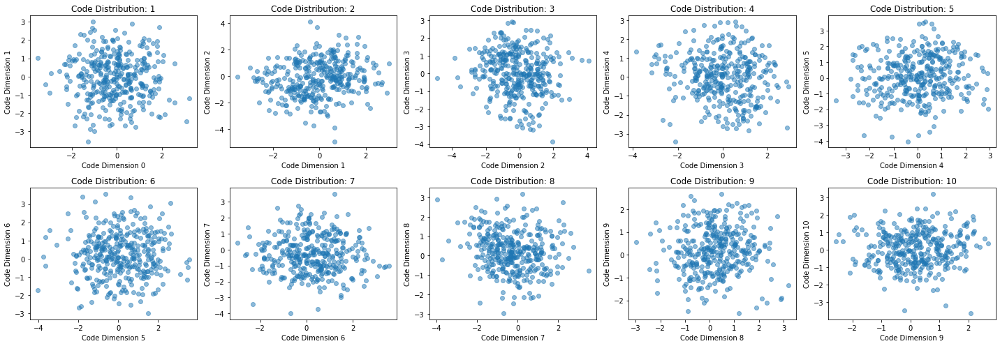

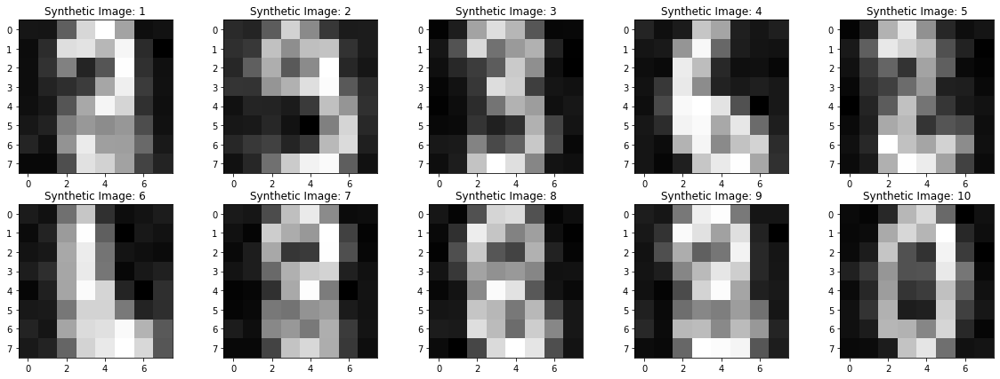

In [ ]:
k_values = [2,4,8]
dataset_percentage = 1.0
# Create data loader for the fixed dataset size
data_considered = train_datasets[dataset_percentage]['X']
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset['X'], batch_size=32, shuffle=True)

for k in k_values:
    print(f"\nTraining for k={k}")

    # Instantiate the model
    model = RealNVP_bottleneck(input_size=64, hidden_size=100, blocks=10,k=k)

    # Train the model
    train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_evaluate(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1)
    train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
    val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)
    # plotting the loss
    plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
    plt.show()

    # Example usage:
    plot_code_distribution(model=model, test_loader=val_loader)
    plt.show()

    ### plot the synthetic data
    synthetic_data=model.sample(num_samples=len(data_considered))
    visualize_synthetic_data(synthetic_data)


We see the reconstruction performs already far better with the bottleneck. We get the best results with k = 4. So lets try two different sampling techniques

Epoch 1/20, Training Loss: 506830.6718499078, Validation Loss: 428.4326847394308
Epoch 2/20, Training Loss: 107.78536251915827, Validation Loss: 291.4867718219757
Epoch 3/20, Training Loss: 85.82897991604275, Validation Loss: 259.36583797136944
Epoch 4/20, Training Loss: 77.02423313988581, Validation Loss: 241.9788273970286
Epoch 5/20, Training Loss: 71.95412707858615, Validation Loss: 232.03203002611795
Epoch 6/20, Training Loss: 68.29618448681302, Validation Loss: 227.44942140579224
Epoch 7/20, Training Loss: 65.99424372778998, Validation Loss: 224.72661836942038
Epoch 8/20, Training Loss: 63.48433694839478, Validation Loss: 218.69628206888834
Epoch 9/20, Training Loss: 61.90843456056383, Validation Loss: 216.30499251683554
Epoch 10/20, Training Loss: 60.55102155473497, Validation Loss: 214.02308400472006
Epoch 11/20, Training Loss: 59.381386015150284, Validation Loss: 207.5036437511444
Epoch 12/20, Training Loss: 58.41290695402357, Validation Loss: 206.32842751344046
Epoch 13/20, Tr

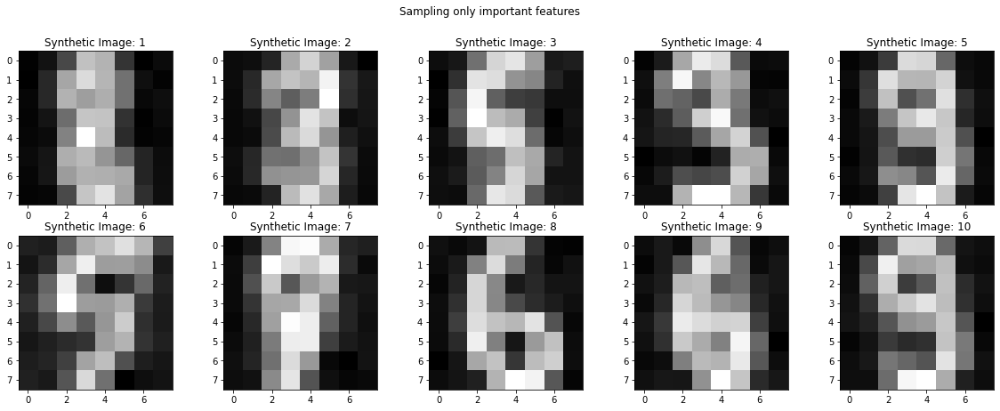

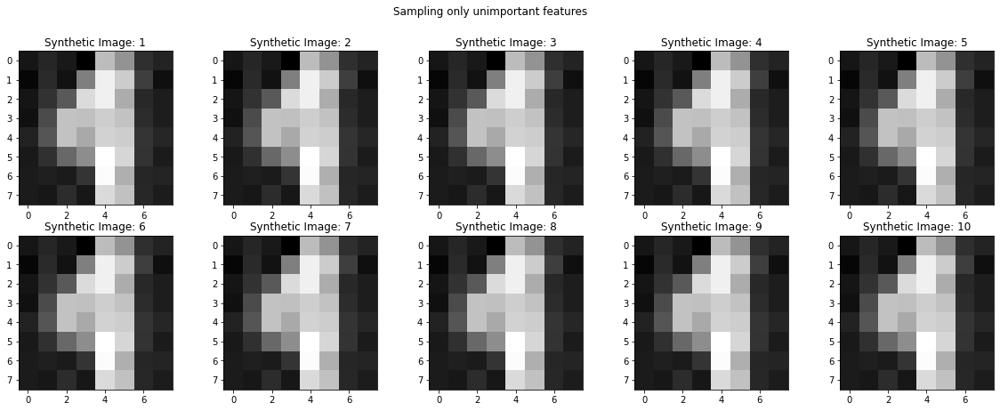

In [ ]:
input_size = 64
hidden_size = 100
blocks = 10
print_after=1
dataset_percentage = 1.0
batch_size=32
data_considered = train_datasets[dataset_percentage]['X']
train_loader = torch.utils.data.DataLoader(data_considered, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset['X'], batch_size=32, shuffle=True)
# Instantiate the model
model = RealNVP_bottleneck(input_size=input_size, hidden_size=hidden_size, blocks=blocks,k=4)

# Train the model
train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_evaluate(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1)
train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)

### plot the synthetic data
synthetic_data=model.sample_only_important(num_samples=len(data_considered))
visualize_synthetic_data(synthetic_data, title="Sampling only important features")

synthetic_data=model.sample_only_unimportant(num_samples=len(data_considered))
visualize_synthetic_data(synthetic_data, title="Sampling only unimportant features")


We see the algorithm performs as expected, when we sample the important features, the numbers/complete images changes. If we only sample the unimportant features we see only small changes in the printed images

## 3.3 RealNVP with MNIST

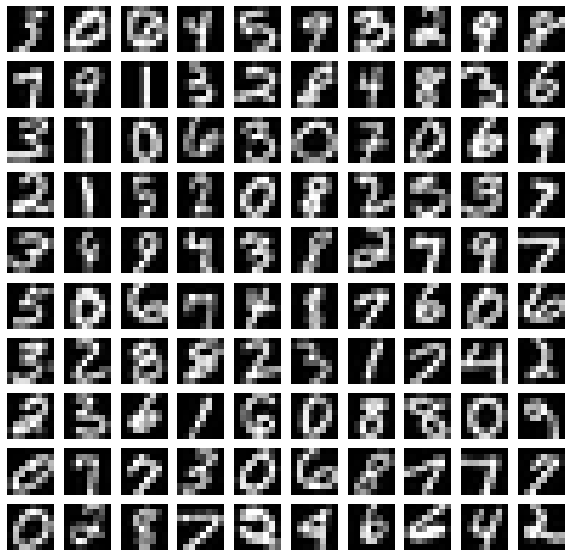

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from PIL import Image, ImageFilter # install 'pillow ' to get PIL
import matplotlib.pyplot as plt
# define a functor to downsample images
class DownsampleTransform:
    def __init__ (self , target_shape , algorithm = Image.Resampling.LANCZOS):
        self.width, self.height = target_shape
        self.algorithm = algorithm
    def __call__ (self , img):
        img = img.resize(( self.width +2, self.height +2) , self.algorithm )
        img = img.crop((1 , 1, self.width +1, self.height +1))
        return img
# concatenate a few transforms
transform = transforms.Compose ([
    DownsampleTransform(target_shape =(8 ,8)),
    transforms.Grayscale(num_output_channels =1) ,
    transforms.ToTensor()
])
# download MNIST
mnist_dataset = datasets.MNIST( root ='./data', train =True ,
                                  transform = transform, download = True )
# create a DataLoader that serves minibatches of size 100
data_loader = DataLoader(mnist_dataset , batch_size =100 , shuffle = True )

mnist_test_dataset = datasets.MNIST( root ='./data', train =False ,
                                  transform = transform, download = True )
val_loader = DataLoader(mnist_test_dataset , batch_size =100 , shuffle = True )
# visualize the first batch of downsampled MNIST images
def show_first_batch(data_loader):
    for batch in data_loader:
        x, y = batch
        fig = plt.figure(figsize =(10 , 10))
        for i, img in enumerate(x):
            ax = fig.add_subplot(10 , 10, i+1)
            ax.imshow(img.reshape(8, 8), cmap ='gray')
            ax.axis('off')
        break



show_first_batch(data_loader)

In [ ]:
import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_evaluate(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1):
    """
    Train the RealNVP model and evaluate on a validation dataset.

    Args:
    - model (RealNVP): The RealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    train_losses_nll = []
    val_losses_nll = []
    train_losses_recons = []
    val_losses_recons = []
    # Training phase
    model.train()  # Set the model to training mode

    for epoch in range(num_epochs):
        total_train_loss_nll = 0.0
        total_train_loss_recons = 0.0

        for batch in train_loader:
            X, y = batch
            inputs= X.reshape(len(y),64)

            # Zero the gradients
            optimizer.zero_grad()

            # NLL Loss calculation
            encoded = model.encode(inputs)
            train_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Reconstruction loss calculation
            decoded = model.decode(encoded)
            train_loss_recons = mse_loss(inputs, decoded)

            # Backward pass (gradient computation)
            loss = train_loss_nll + train_loss_recons
            loss.backward()

            ### added recently: clip the gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)  # Adjust max_norm as needed

            # Update weights
            optimizer.step()

            total_train_loss_nll += train_loss_nll.item()
            total_train_loss_recons += train_loss_recons.item()

        # Average training loss for the epoch
        average_train_loss_nll = total_train_loss_nll / len(train_loader)
        average_train_loss_recons = total_train_loss_recons / len(train_loader)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        if val_loader is not None:
            total_val_loss_nll = 0.0
            total_val_loss_recons = 0.0
            with torch.no_grad():
                for batch in val_loader:
                    X,y = batch
                    val_inputs = X.reshape(len(y),64)

                    # NLL Loss calculation
                    encoded = model.encode(val_inputs)
                    val_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(val_loader))

                    # Reconstruction loss calculation
                    decoded = model.decode(encoded)
                    val_loss_recons = mse_loss(val_inputs, decoded)

                    total_val_loss_nll += val_loss_nll.item()
                    total_val_loss_recons += val_loss_recons.item()

            # Average validation loss for the epoch
            average_val_loss_nll = total_val_loss_nll / len(val_loader)
            average_val_loss_recons = total_val_loss_recons / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss_recons+average_train_loss_nll}, Validation Loss: {average_val_loss_nll+average_val_loss_recons}")

            # Append losses to the lists
            train_losses_nll.append(average_train_loss_nll)
            val_losses_nll.append(average_val_loss_nll)
            train_losses_recons.append(average_train_loss_recons)
            val_losses_recons.append(average_val_loss_recons)


        # Set the model back to training mode
        model.train()

    print("Training complete")

    return train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons

In [ ]:
def plot_code_distribution(model, test_loader):
    """
    Plot the code distribution obtained by applying the trained RealNVP model to a test dataset.

    Args:
    - model (RealNVP): Trained RealNVP model.
    - test_loader (DataLoader): DataLoader for the test dataset.
    - num_samples (int): Number of samples to visualize.

    Returns:
    None (displays the plot).
    """
    model.eval()  # Set the model to evaluation mode
    fig, axs = plt.subplots(2, 5, figsize=(20, 7))
    with torch.no_grad():
        # Concatenate multiple batches to obtain more samples
        test_samples = torch.cat([X for (X,y) in test_loader], dim=0)
        test_samples = test_samples.reshape(len(test_samples), 64)
        # Assuming your model has an `encode` method
        code_samples = model.encode(test_samples)

        # Convert PyTorch tensor to numpy array
        code_np = code_samples.numpy()
        dim_1 = 0
        dim_2 = 1
        for i in range(2):
            for j in range(5):
                # Scatter plot of code distribution
                axs[i,j].scatter(code_np[:, dim_1], code_np[:, dim_2], label='Code Distribution', alpha=0.5)
                axs[i,j].set_xlabel(f"Code Dimension {dim_1}")
                axs[i,j].set_ylabel(f"Code Dimension {dim_2}")
                axs[i,j].set_title(f'Code Distribution: {dim_2}')
                dim_1 += 1
                dim_2 += 1
        plt.tight_layout()
        plt.show()

Epoch 1/10, Training Loss: -19.166037408212674, Validation Loss: -130.39732536315904
Epoch 2/10, Training Loss: -22.551581888198704, Validation Loss: -138.417531890869
Epoch 3/10, Training Loss: -23.38100530624374, Validation Loss: -142.53491348266584
Epoch 4/10, Training Loss: -23.802392495473065, Validation Loss: -143.01150100707991
Epoch 5/10, Training Loss: -24.102571767171064, Validation Loss: -145.12324249267562
Epoch 6/10, Training Loss: -24.330206867853637, Validation Loss: -146.54541503906233
Epoch 7/10, Training Loss: -24.49192481994612, Validation Loss: -146.0686399841307
Epoch 8/10, Training Loss: -24.635013628005815, Validation Loss: -146.93343902587873
Epoch 9/10, Training Loss: -24.749749383926222, Validation Loss: -148.22393341064435
Epoch 10/10, Training Loss: -24.859632444381543, Validation Loss: -148.3804725646971
Training complete


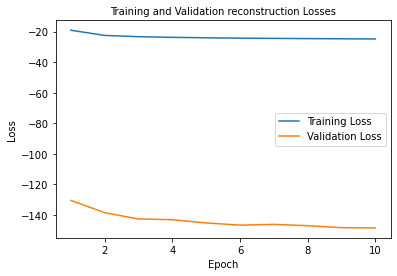

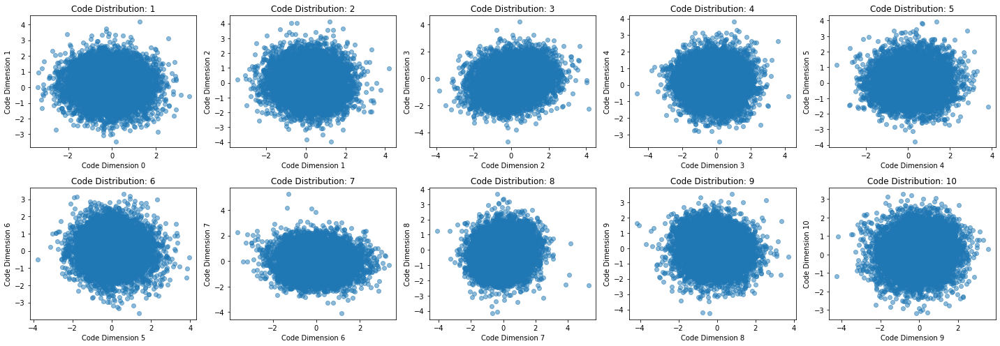

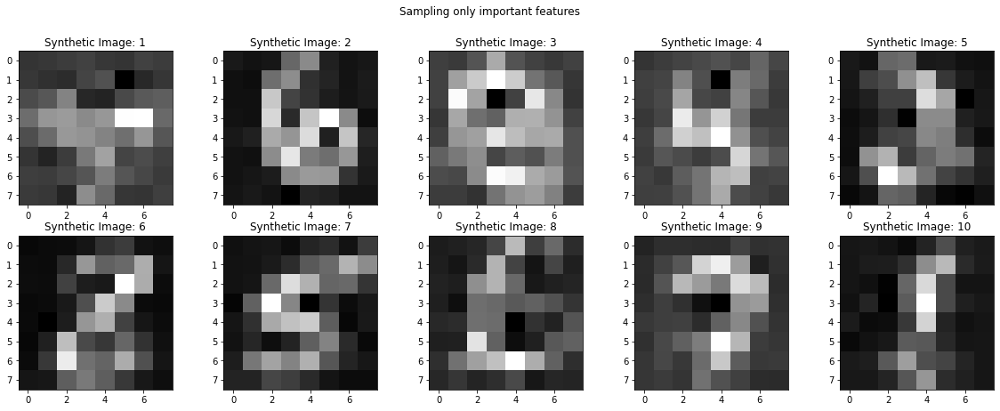

In [ ]:
input_size = 64
hidden_size = 200
blocks = 10
print_after=1
dataset_percentage = 1.0
batch_size=100

# Instantiate the model
model = RealNVP(input_size=input_size, hidden_size=hidden_size, blocks=blocks)

# Train the model
train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_evaluate(model, data_loader, val_loader, num_epochs=10, lr=0.005, print_after=1)
train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)

# plotting the loss
plot_losses(train_losses, val_losses, want_log_scale=0)
plt.show()

# Example usage:
plot_code_distribution(model=model, test_loader=val_loader)
plt.show()

### plot the synthetic data
synthetic_data=model.sample(num_samples=100)
visualize_synthetic_data(synthetic_data, title="Sampling only important features")




The results look better than with the digits dataset, but using a bottleneck is still superior in performance and training time

# 4. Higher-dimensional data with conditional INN

Lets continue task 3 with a conditional INN

## 4.1 Building network and testing Hyperparameters

In [ ]:
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
import torch

# Load the digits dataset
digits = load_digits()

X_train, X_test, y_train, y_test = train_test_split(digits.data, digits.target, test_size=0.2)


In [ ]:
#### data for the two-moons model
from torch.utils.data import TensorDataset, DataLoader

# Define a custom dataset
class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, labels):
        self.data = data
        self.labels = labels

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        x = self.data[index]
        y = self.labels[index]
        return x, y

In [ ]:
# Define model parameters
input_size = 64
hidden_size = 100
condition_size = 10
blocks = 10
percentage = 1.0
num_epochs = 10
lr = 0.005


y_train = torch.arange(condition_size)[y_train].long()
y_test = torch.arange(condition_size)[y_test].long()


# Initialize the model
conditional_inn_model = ConditionalRealNVP(input_size, hidden_size, condition_size, blocks)

train_dataset = CustomDataset(torch.FloatTensor(X_train), y_train)
val_dataset = CustomDataset(torch.FloatTensor(X_test), y_test)

# Define batch size
batch_size = 32

# Create data loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Task 1: Train the Conditional INN
train_loss, val_loss= train_and_validate_conditional_nvp(conditional_inn_model, train_loader, val_loader,
                                                         num_epochs=num_epochs, lr=lr, print_after=1)

# plotting the loss
plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
plt.show()

conditions_all_labels = torch.eye(condition_size)
synthetic_data=conditional_inn_model.sample(num_samples=10, conditions= conditions_all_labels)
visualize_synthetic_data(synthetic_data,title="Synthetic digits from 0 to 9")
plt.show()

Epoch 1/10, Training Loss: 14079.221368747287, Validation Loss: 251.96936988830566
Epoch 2/10, Training Loss: 66.6776138305664, Validation Loss: 224.05490080515543
Epoch 3/10, Training Loss: 59.361120012071396, Validation Loss: 205.93127663930258
Epoch 4/10, Training Loss: 55.38476036919488, Validation Loss: 202.0959882736206
Epoch 5/10, Training Loss: 52.79541244506836, Validation Loss: 191.49610010782877
Epoch 6/10, Training Loss: 50.71405766805013, Validation Loss: 193.31329123179117
Epoch 7/10, Training Loss: 48.682631174723305, Validation Loss: 184.10962549845377
Epoch 8/10, Training Loss: 47.73568098280165, Validation Loss: 183.49630864461264
Epoch 9/10, Training Loss: 46.577716488308376, Validation Loss: 179.7266502380371
Epoch 10/10, Training Loss: 45.92713555230035, Validation Loss: 179.190260887146
Training complete


NameError: name 'train_losses' is not defined

The results look pretty good! Lets try different hyperparameters!


Training for hidden_size=100, blocks = 2
Epoch 1/30, Training Loss: 293.8609095255534, Validation Loss: 522.8373781840006
Epoch 2/30, Training Loss: 137.28045535617406, Validation Loss: 457.2848320007324
Epoch 3/30, Training Loss: 118.8162612915039, Validation Loss: 405.67692375183105
Epoch 4/30, Training Loss: 107.44375440809462, Validation Loss: 390.22615814208984
Epoch 5/30, Training Loss: 100.79131232367621, Validation Loss: 340.93681780497235
Epoch 6/30, Training Loss: 94.5724119398329, Validation Loss: 333.0782648722331
Epoch 7/30, Training Loss: 91.05331556532118, Validation Loss: 323.25561205546063
Epoch 8/30, Training Loss: 89.2670910305447, Validation Loss: 338.40706125895184
Epoch 9/30, Training Loss: 87.65778791639539, Validation Loss: 304.7028503417969
Epoch 10/30, Training Loss: 84.94269849989149, Validation Loss: 308.5491994222005
Epoch 11/30, Training Loss: 83.56937561035156, Validation Loss: 300.5091025034587
Epoch 12/30, Training Loss: 82.23126559787326, Validation L

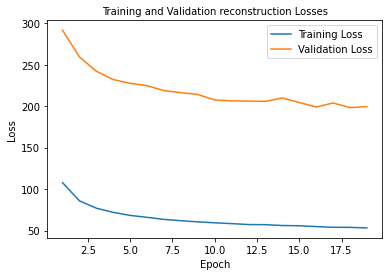

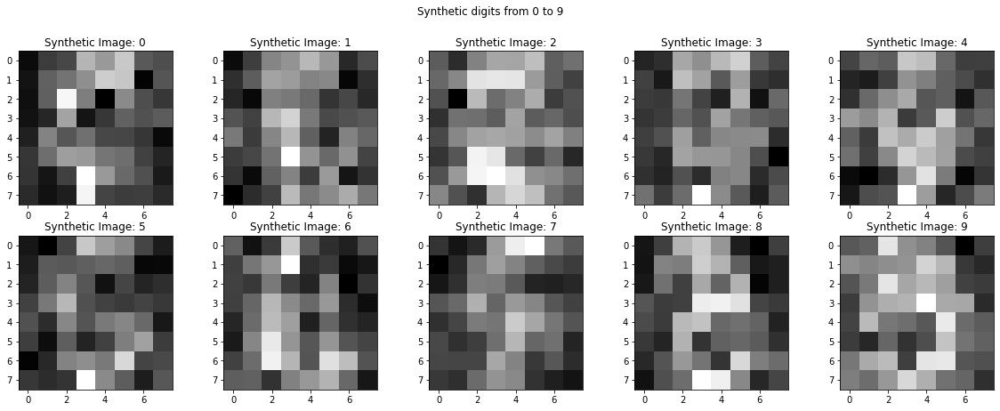


Training for hidden_size=100, blocks = 5
Epoch 1/30, Training Loss: 245.61961432562933, Validation Loss: 288.1628958384196
Epoch 2/30, Training Loss: 73.73544447157118, Validation Loss: 253.28568267822266
Epoch 3/30, Training Loss: 65.67341079711915, Validation Loss: 233.32082843780518
Epoch 4/30, Training Loss: 61.25560048421224, Validation Loss: 223.8289836247762
Epoch 5/30, Training Loss: 58.051698981391056, Validation Loss: 212.6532974243164
Epoch 6/30, Training Loss: 55.78813883463542, Validation Loss: 214.10021591186523
Epoch 7/30, Training Loss: 53.83916973537869, Validation Loss: 211.61553732554117
Epoch 8/30, Training Loss: 52.40808283487956, Validation Loss: 207.70124022165933
Epoch 9/30, Training Loss: 51.4053960164388, Validation Loss: 201.84393946329752
Epoch 10/30, Training Loss: 50.25626102023654, Validation Loss: 203.0097745259603
Epoch 11/30, Training Loss: 49.2913705613878, Validation Loss: 202.8919070561727
Epoch 12/30, Training Loss: 48.77919074164497, Validation L

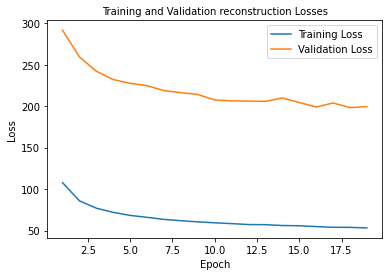

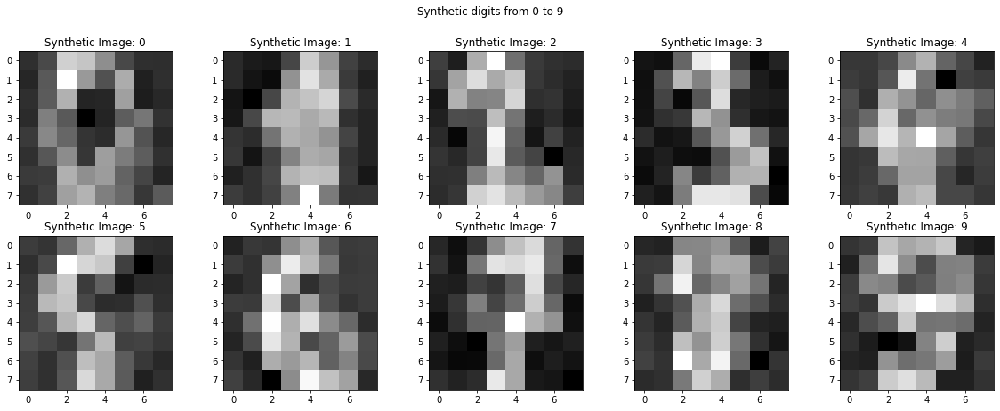


Training for hidden_size=100, blocks = 10
Epoch 1/30, Training Loss: 1349.3783764309353, Validation Loss: 252.0936533610026
Epoch 2/30, Training Loss: 64.5319458855523, Validation Loss: 225.27423095703125
Epoch 3/30, Training Loss: 57.80359793768989, Validation Loss: 210.5755526224772
Epoch 4/30, Training Loss: 53.993755171034074, Validation Loss: 205.24729283650717
Epoch 5/30, Training Loss: 51.40060594346788, Validation Loss: 198.3798786799113
Epoch 6/30, Training Loss: 49.362469312879774, Validation Loss: 191.2987314860026
Epoch 7/30, Training Loss: 47.77900839911567, Validation Loss: 197.155779838562
Epoch 8/30, Training Loss: 46.82213287353515, Validation Loss: 192.00089104970297
Epoch 9/30, Training Loss: 45.66339738633898, Validation Loss: 186.95856475830078
Epoch 10/30, Training Loss: 44.15901014539931, Validation Loss: 186.4817123413086
Epoch 11/30, Training Loss: 43.3345470852322, Validation Loss: 187.1396245956421
Epoch 12/30, Training Loss: 42.67904968261719, Validation Lo

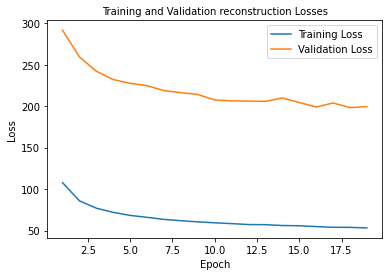

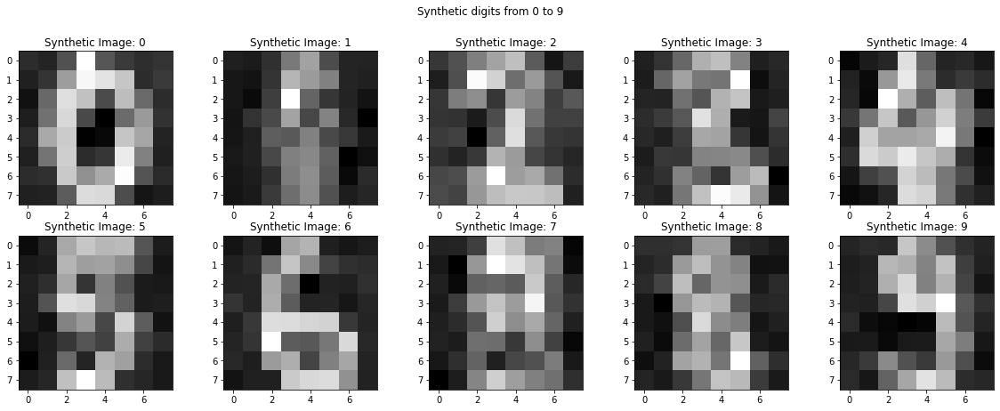


Training for hidden_size=200, blocks = 2
Epoch 1/30, Training Loss: 251.62340698242187, Validation Loss: 493.00861167907715
Epoch 2/30, Training Loss: 133.07212592230903, Validation Loss: 445.5189565022786
Epoch 3/30, Training Loss: 120.69439256456164, Validation Loss: 412.8376407623291
Epoch 4/30, Training Loss: 111.98785451253255, Validation Loss: 395.0897928873698
Epoch 5/30, Training Loss: 106.65084398057726, Validation Loss: 371.44888496398926
Epoch 6/30, Training Loss: 104.55206366644965, Validation Loss: 375.08094724019367
Epoch 7/30, Training Loss: 100.62608981662326, Validation Loss: 354.244104385376
Epoch 8/30, Training Loss: 101.3826168484158, Validation Loss: 361.2765522003174
Epoch 9/30, Training Loss: 97.17907290988498, Validation Loss: 350.2586212158203
Epoch 10/30, Training Loss: 99.39001719156902, Validation Loss: 375.323211034139
Epoch 11/30, Training Loss: 96.24877268473307, Validation Loss: 342.65224011739093
Epoch 12/30, Training Loss: 95.22671322292751, Validatio

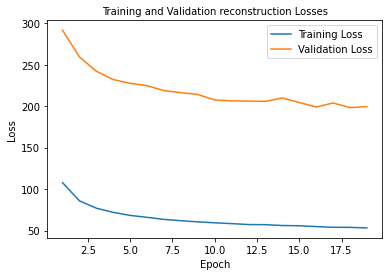

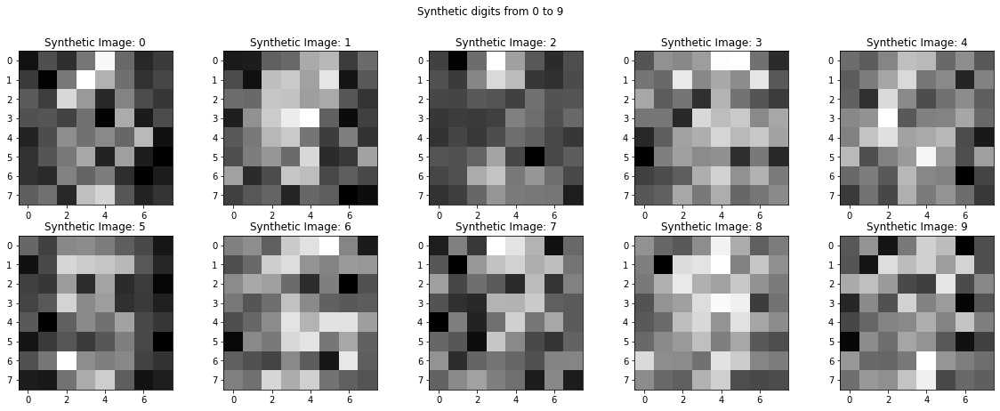


Training for hidden_size=200, blocks = 5
Epoch 1/30, Training Loss: 314.2896986219618, Validation Loss: 290.5458056131999
Epoch 2/30, Training Loss: 74.96810743543837, Validation Loss: 255.79893811543783
Epoch 3/30, Training Loss: 66.97058885362414, Validation Loss: 235.95261446634927
Epoch 4/30, Training Loss: 62.063047112358944, Validation Loss: 225.87391726175943
Epoch 5/30, Training Loss: 58.89331987169054, Validation Loss: 219.84676583607992
Epoch 6/30, Training Loss: 56.11679161919488, Validation Loss: 213.3170550664266
Epoch 7/30, Training Loss: 54.45528928968641, Validation Loss: 207.7753407160441
Epoch 8/30, Training Loss: 52.892186652289496, Validation Loss: 206.37459564208984
Epoch 9/30, Training Loss: 51.78697018093533, Validation Loss: 210.35921986897787
Epoch 10/30, Training Loss: 50.40202967325846, Validation Loss: 202.17945830027261
Epoch 11/30, Training Loss: 49.897619289822046, Validation Loss: 200.61742146809897
Epoch 12/30, Training Loss: 49.18618816799588, Validat

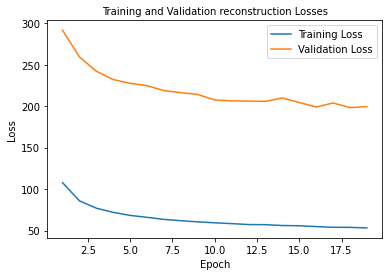

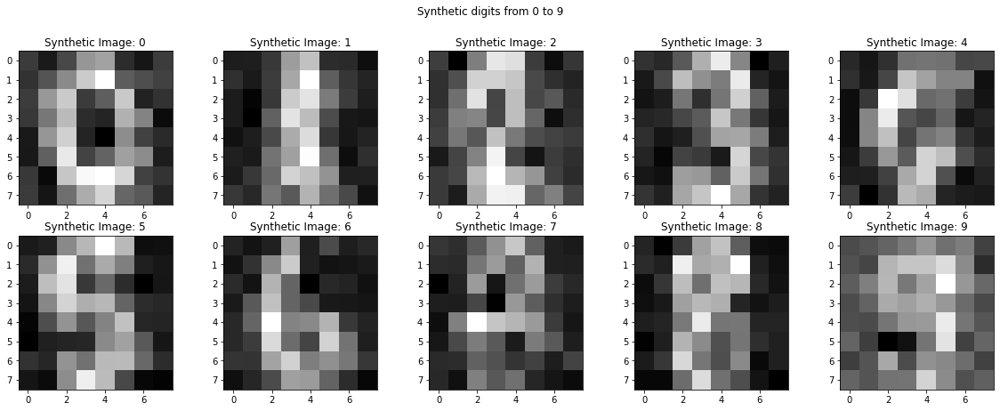


Training for hidden_size=200, blocks = 10
Epoch 1/30, Training Loss: 8550.333620876736, Validation Loss: 252.25765419006348
Epoch 2/30, Training Loss: 64.73046518961588, Validation Loss: 221.92402013142905
Epoch 3/30, Training Loss: 57.476726362440324, Validation Loss: 208.8302043279012
Epoch 4/30, Training Loss: 53.80047760009766, Validation Loss: 204.94884077707925
Epoch 5/30, Training Loss: 51.54618767632378, Validation Loss: 199.60729948679605
Epoch 6/30, Training Loss: 49.243514166937935, Validation Loss: 195.52471828460693
Epoch 7/30, Training Loss: 47.38635228474935, Validation Loss: 190.7220137914022
Epoch 8/30, Training Loss: 46.45990176730686, Validation Loss: 198.09132544199625
Epoch 9/30, Training Loss: 45.40678176879883, Validation Loss: 190.19877115885416
Epoch 10/30, Training Loss: 44.32002614339193, Validation Loss: 190.01830673217773
Epoch 11/30, Training Loss: 43.25411470201281, Validation Loss: 188.1542704900106
Epoch 12/30, Training Loss: 42.34379747178819, Validat

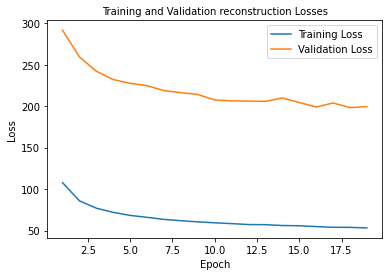

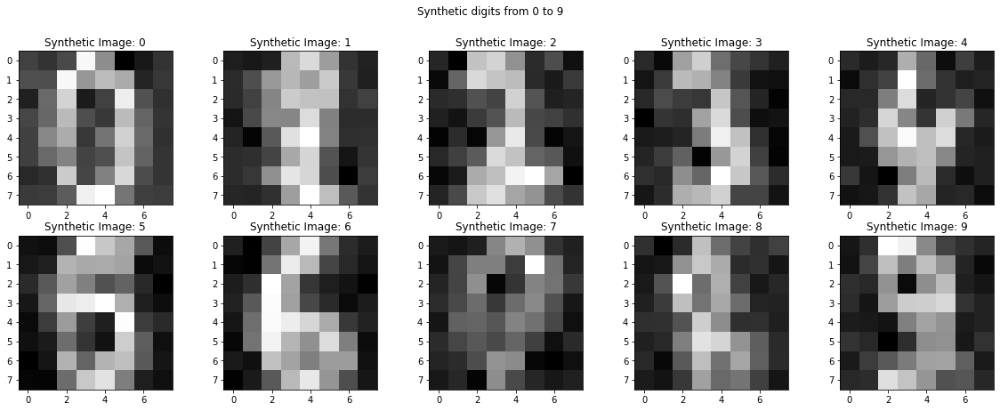


Training for hidden_size=400, blocks = 2
Epoch 1/30, Training Loss: 309.8460605197483, Validation Loss: 641.5680033365885
Epoch 2/30, Training Loss: 167.27688564724392, Validation Loss: 550.9989280700684
Epoch 3/30, Training Loss: 155.16913079155816, Validation Loss: 552.8562787373861
Epoch 4/30, Training Loss: 142.22390001085068, Validation Loss: 491.44150416056317
Epoch 5/30, Training Loss: 137.04273817274304, Validation Loss: 793.9056180318197
Epoch 6/30, Training Loss: 158.23646189371746, Validation Loss: 612.9892018636068
Epoch 7/30, Training Loss: 138.3919923570421, Validation Loss: 442.6516710917155
Epoch 8/30, Training Loss: 133.79639689127603, Validation Loss: 836.4147109985352
Epoch 9/30, Training Loss: 146.32217983669705, Validation Loss: 468.4177182515462
Epoch 10/30, Training Loss: 137.2965772840712, Validation Loss: 465.1561864217122
Epoch 11/30, Training Loss: 142.33085208468967, Validation Loss: 486.0627187093099
Epoch 12/30, Training Loss: 129.43356441921657, Validati

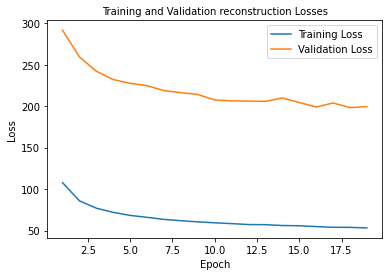

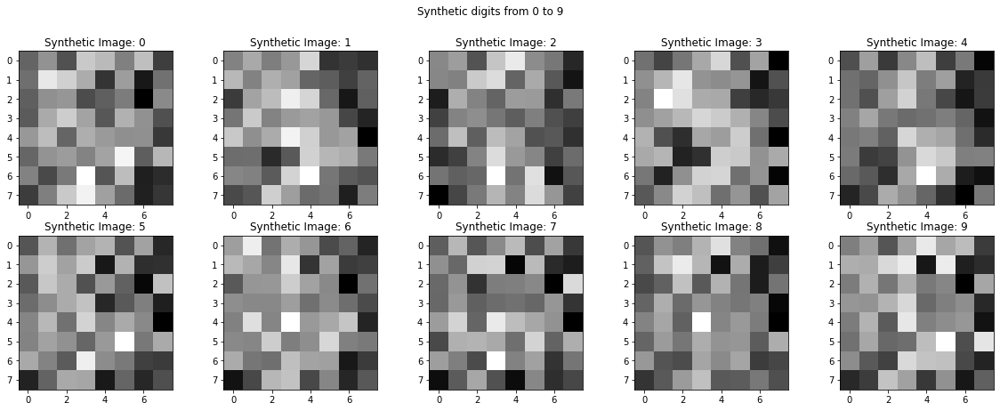


Training for hidden_size=400, blocks = 5
Epoch 1/30, Training Loss: 283.9519036187066, Validation Loss: 306.4883219401042
Epoch 2/30, Training Loss: 78.9733864678277, Validation Loss: 267.76504071553546
Epoch 3/30, Training Loss: 71.24371761745877, Validation Loss: 249.29519907633463
Epoch 4/30, Training Loss: 66.88938734266493, Validation Loss: 242.08064715067545
Epoch 5/30, Training Loss: 64.17731535169813, Validation Loss: 234.6187343597412
Epoch 6/30, Training Loss: 61.6169075012207, Validation Loss: 232.41984430948892
Epoch 7/30, Training Loss: 61.058763631184895, Validation Loss: 227.2152500152588
Epoch 8/30, Training Loss: 58.36835199991862, Validation Loss: 221.61338710784912
Epoch 9/30, Training Loss: 57.72528330485026, Validation Loss: 223.6118532816569
Epoch 10/30, Training Loss: 56.28718982272678, Validation Loss: 223.97171783447266
Epoch 11/30, Training Loss: 56.164582061767575, Validation Loss: 217.72104358673096
Epoch 12/30, Training Loss: 55.18229760064019, Validation 

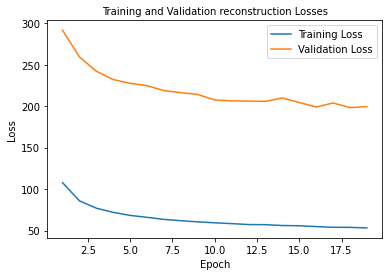

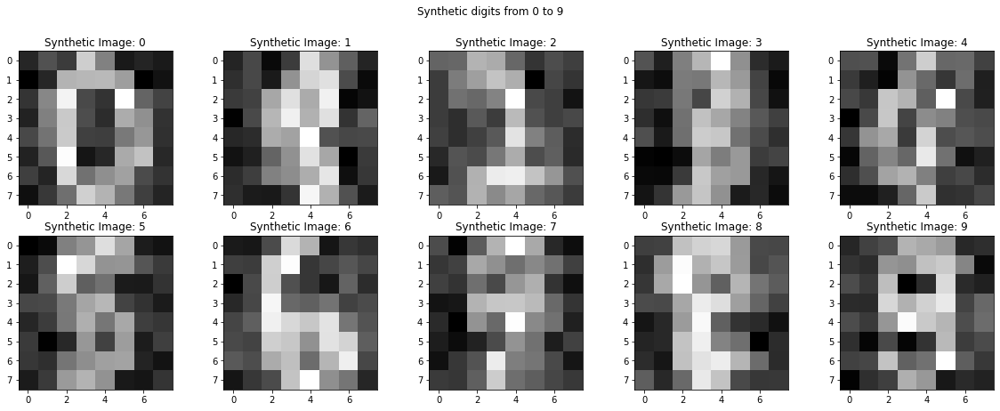


Training for hidden_size=400, blocks = 10
Epoch 1/30, Training Loss: 1178.0424274020725, Validation Loss: 314.2991199493408
Epoch 2/30, Training Loss: 80.48548092312284, Validation Loss: 272.5304183959961
Epoch 3/30, Training Loss: 71.183130730523, Validation Loss: 252.77461687723795
Epoch 4/30, Training Loss: 67.16154123942057, Validation Loss: 247.56891632080078
Epoch 5/30, Training Loss: 63.57256266276042, Validation Loss: 238.0752493540446
Epoch 6/30, Training Loss: 61.470615810818146, Validation Loss: 232.28548304239908
Epoch 7/30, Training Loss: 59.5168451944987, Validation Loss: 230.8792053858439
Epoch 8/30, Training Loss: 58.22029656304254, Validation Loss: 229.1913324991862
Epoch 9/30, Training Loss: 57.4977183871799, Validation Loss: 223.06117502848306
Epoch 10/30, Training Loss: 56.045141516791446, Validation Loss: 226.03118069966635
Epoch 11/30, Training Loss: 55.24988725450304, Validation Loss: 221.1461903254191
Epoch 12/30, Training Loss: 55.002064853244356, Validation L

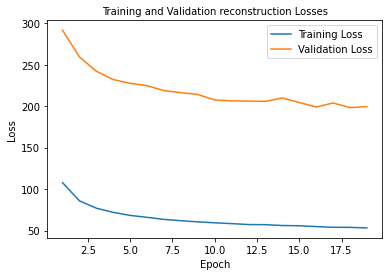

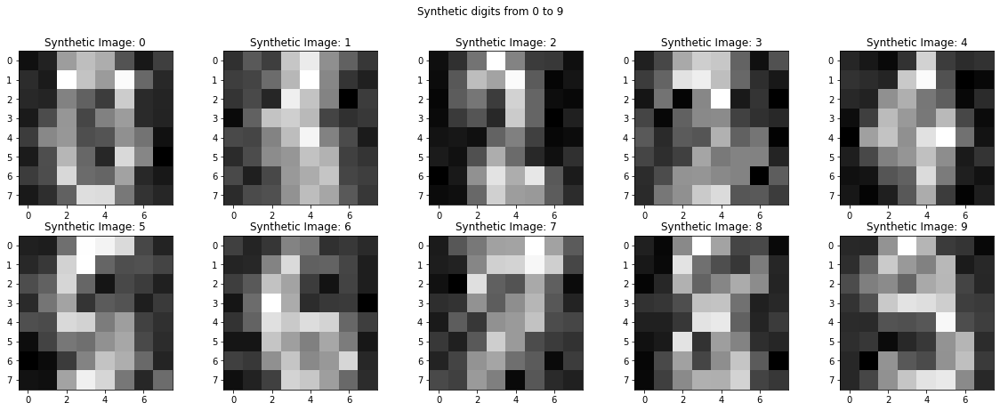

In [ ]:
hidden_sizes = [100, 200, 400]
blocks = [2, 5, 10]
input_size = 64

for hidden_size in hidden_sizes:
    for block in blocks:
        print(f"\nTraining for hidden_size={hidden_size}, blocks = {block}")

        # Instantiate the model
        conditional_inn_model = ConditionalRealNVP(input_size, hidden_size, condition_size, block)

        train_loss, val_loss= train_and_validate_conditional_nvp(conditional_inn_model, train_loader, val_loader,
                                                         num_epochs=30, lr=lr, print_after=1)

        # plotting the loss
        plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
        plt.show()

        conditions_all_labels = torch.eye(condition_size)
        synthetic_data=conditional_inn_model.sample(num_samples=10, conditions= conditions_all_labels)
        visualize_synthetic_data(synthetic_data,title="Synthetic digits from 0 to 9")
        plt.show()


We see we still get the best results for the same network structure, so we are going to stick with that and the same training hyperparameters

## 4.2 Artificial bottlenecks

In [ ]:
### conditional real NVP class
class ConditionalRealNVP_bottleneck(nn.Module):
    def __init__(self, input_size, hidden_size, condition_size, blocks, k):
        """
        Initialize a ConditionalRealNVP model.

        Args:
        - input_size (int): Total size of the input data.
        - hidden_size (int): Size of the hidden layers in the neural networks.
        - condition_size (int): Size of the condition vector (e.g., one-hot encoded label size).
        - blocks (int): Number of coupling layers in the model.
        """
        super(ConditionalRealNVP_bottleneck, self).__init__()
        self.input_size = input_size
        self.hidden_size = hidden_size
        self.condition_size = condition_size
        self.blocks = blocks
        self.k = k



        # List of coupling layers
        self.coupling_layers = nn.ModuleList([
            ConditionalCouplingLayer(input_size, hidden_size, condition_size) for _ in range(blocks)
        ])

        # List to store orthonormal matrices
        self.orthonormal_matrices = [self._get_orthonormal_matrix(input_size) for _ in range(blocks)]

        # List to store scaling_before_exp for each block
        self.scaling_before_exp_list = []

    def _get_orthonormal_matrix(self, size):
        """
        Generate a random orthonormal matrix.

        Args:
        - size (int): Size of the matrix.

        Returns:
        - q (torch.Tensor): Orthonormal matrix.
        """
        w = torch.randn(size, size)
        q, _ = torch.linalg.qr(w, 'reduced')
        return q

    def forward_realnvp(self, x, condition):
        """
        Forward pass through the ConditionalRealNVP model.

        Args:
        - x (torch.Tensor): Input data.
        - condition (torch.Tensor): Condition vector.

        Returns:
        - x (torch.Tensor): Transformed data.
        """
        scaling_before_exp_list = []
        for i in range(self.blocks):
            #print("x is:"); print(x)
            #print("shape of x is:"); print(x.shape)
            x = torch.matmul(x, self.orthonormal_matrices[i])
            x, scaling_before_exp = self.coupling_layers[i].forward(x, condition)
            scaling_before_exp_list.append(scaling_before_exp)

        self.scaling_before_exp_list = scaling_before_exp_list
        return x


    def decode(self, z, condition):
        # Modify z to zero out dimensions beyond k for the reconstruction
        z_reconstructed = z.clone()
        if self.k < self.input_size:
            z_reconstructed[:, self.k:] = 0  # Zero out dimensions beyond k

         # Proceed with the original decoding process
        for i in reversed(range(self.blocks)):
            z = self.coupling_layers[i].backward(z, condition)
            z_reconstructed = self.coupling_layers[i].backward(z_reconstructed, condition)
            z = torch.matmul(z, self.orthonormal_matrices[i].t())
            z_reconstructed = torch.matmul(z_reconstructed, self.orthonormal_matrices[i].t())

        return z, z_reconstructed

    def sample(self, num_samples=1000, conditions=None):
        """
        Generate synthetic samples.

        Args:
        - num_samples (int): Number of synthetic samples to generate.
        - conditions (torch.Tensor): Conditions for generating synthetic samples.

        Returns:
        - synthetic_samples (torch.Tensor): Synthetic samples.
        """
        with torch.no_grad():
            z = torch.randn(num_samples, self.input_size)
            synthetic_samples, _ = self.decode(z, conditions)
        return synthetic_samples


    def sample_only_important(self, num_samples=1000, conditions=None):
        # Generate random samples from a standard normal distribution
        with torch.no_grad():
            z_1 = torch.randn(num_samples, self.k)
            z_2 = torch.zeros(num_samples, self.input_size - self.k)
            z = torch.cat((z_1, z_2), dim=1)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        synthetic_samples, _ = self.decode(z, conditions)
        return synthetic_samples

    def sample_only_unimportant(self, num_samples=1000, conditions=None):
        # Generate random samples from a standard normal distribution

        with torch.no_grad():
            z_1 = torch.randn(1, self.k).repeat(num_samples, 1)
            z_2 = torch.randn(num_samples, self.input_size - self.k)
            z = torch.cat((z_1, z_2), dim=1)

        # Apply the reverse transformations (decoder) to generate synthetic samples
        synthetic_samples, _ = self.decode(z, conditions)
        return synthetic_samples

In [ ]:
### training_the_conditional_nvp model

import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_validate_conditional_nvp_bottleneck(model, train_loader, val_loader, num_epochs=10, lr=0.001, print_after=1):
    """
    Train the ConditionalRealNVP model and evaluate on a validation dataset.

    Args:
    - model (ConditionalRealNVP): The ConditionalRealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    train_losses_nll = []
    val_losses_nll = []
    train_losses_recons = []
    val_losses_recons = []
    # Training phase
    model.train()  # Set the model to training mode

    for epoch in range(num_epochs):
        total_train_loss_nll = 0.0
        total_train_loss_recons = 0.0

        for data, labels in train_loader:
            inputs = data
            conditions = one_hot(labels, num_classes=model.condition_size).float()

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass (encoding)
            encoded = model.forward_realnvp(inputs, conditions)

            train_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Reconstruction loss calculation
            _, decoded = model.decode(encoded, conditions)
            train_loss_recons = mse_loss(inputs, decoded)

            # Backward pass (gradient computation)
            loss = train_loss_nll + train_loss_recons
            loss.backward()

            ### added recently: clip the gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)  # Adjust max_norm as needed

            # Update weights
            optimizer.step()

            total_train_loss_nll += train_loss_nll.item()
            total_train_loss_recons += train_loss_recons.item()

        # Average training loss for the epoch
        average_train_loss_nll = total_train_loss_nll / len(train_loader)
        average_train_loss_recons = total_train_loss_recons / len(train_loader)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        if val_loader is not None:
            total_val_loss_nll = 0.0
            total_val_loss_recons = 0.0
            with torch.no_grad():
                for val_data, val_labels in val_loader:
                    val_inputs = val_data
                    val_conditions = one_hot(val_labels, num_classes=model.condition_size).float()

                    # Forward pass (encoding) for validation
                    val_encoded = model.forward_realnvp(val_inputs, val_conditions)

                    # NLL Loss calculation
                    val_loss_nll = calculate_loss(val_encoded, model.scaling_before_exp_list, len(val_loader))

                    # Reconstruction loss calculation
                    _, decoded = model.decode(val_encoded, val_conditions)
                    val_loss_recons = mse_loss(val_inputs, decoded)

                    total_val_loss_nll += val_loss_nll.item()
                    total_val_loss_recons += val_loss_recons.item()

            # Average validation loss for the epoch
            average_val_loss_nll = total_val_loss_nll / len(val_loader)
            average_val_loss_recons = total_val_loss_recons / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss_recons+average_train_loss_nll}, Validation Loss: {average_val_loss_nll+average_val_loss_recons}")

            # Append losses to the lists
            train_losses_nll.append(average_train_loss_nll)
            val_losses_nll.append(average_val_loss_nll)
            train_losses_recons.append(average_train_loss_recons)
            val_losses_recons.append(average_val_loss_recons)

    print("Training complete")

    return train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons


Training for k=2
Epoch 1/20, Training Loss: 4268.482129012214, Validation Loss: 277.0808455944061
Epoch 2/20, Training Loss: 79.93924753401015, Validation Loss: 238.11668674151102
Epoch 3/20, Training Loss: 70.49177271525065, Validation Loss: 220.5944479306539
Epoch 4/20, Training Loss: 65.97008811102974, Validation Loss: 212.06634493668875
Epoch 5/20, Training Loss: 62.57478442721897, Validation Loss: 206.0178082784017
Epoch 6/20, Training Loss: 60.040938536326095, Validation Loss: 206.48840761184692
Epoch 7/20, Training Loss: 58.67695316738553, Validation Loss: 199.03116782506308
Epoch 8/20, Training Loss: 56.43557636472914, Validation Loss: 194.44701397418976
Epoch 9/20, Training Loss: 55.055921967824304, Validation Loss: 194.8996948401133
Epoch 10/20, Training Loss: 53.81541895336575, Validation Loss: 192.07523147265118
Epoch 11/20, Training Loss: 52.73026489681668, Validation Loss: 193.12475633621216
Epoch 12/20, Training Loss: 52.082277584075925, Validation Loss: 188.29537717501

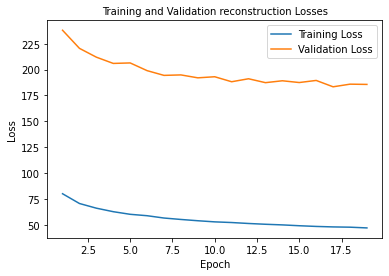

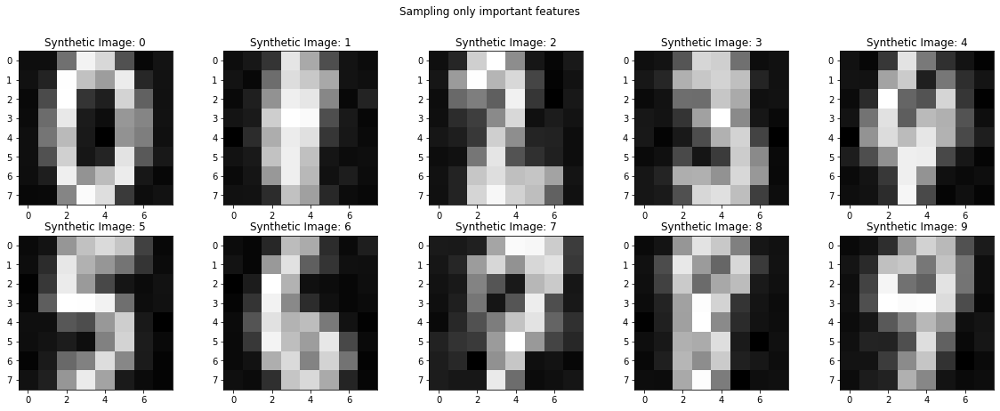

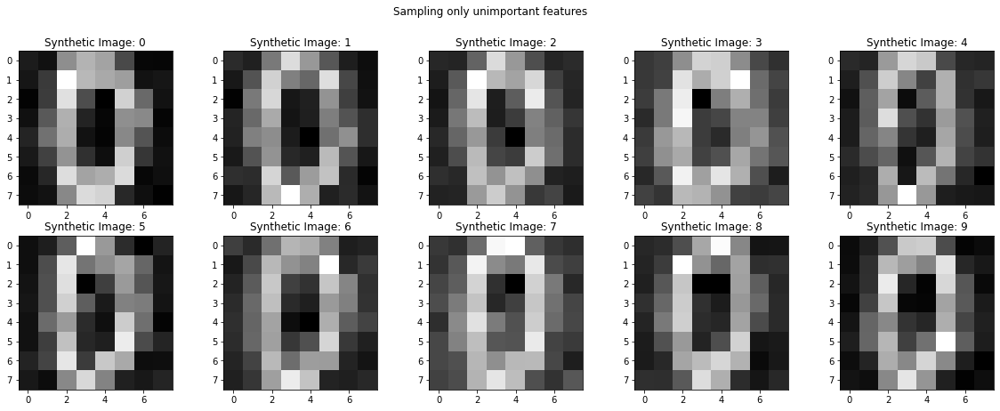


Training for k=4
Epoch 1/20, Training Loss: 1531363.1183485244, Validation Loss: 1611.2183237075806
Epoch 2/20, Training Loss: 145.63676013946534, Validation Loss: 285.2107837994894
Epoch 3/20, Training Loss: 81.61559757656522, Validation Loss: 245.5362807114919
Epoch 4/20, Training Loss: 71.20380795796711, Validation Loss: 225.57799275716147
Epoch 5/20, Training Loss: 65.88819755978054, Validation Loss: 213.04468441009521
Epoch 6/20, Training Loss: 61.858477687835695, Validation Loss: 206.82857819398242
Epoch 7/20, Training Loss: 59.467446655697294, Validation Loss: 203.04642629623413
Epoch 8/20, Training Loss: 56.79460786183675, Validation Loss: 198.47188929716745
Epoch 9/20, Training Loss: 55.198437235090466, Validation Loss: 194.5198189020157
Epoch 10/20, Training Loss: 53.73772185643514, Validation Loss: 194.05041245619455
Epoch 11/20, Training Loss: 52.30835009680854, Validation Loss: 189.8688794374466
Epoch 12/20, Training Loss: 51.18810695012411, Validation Loss: 188.238769531

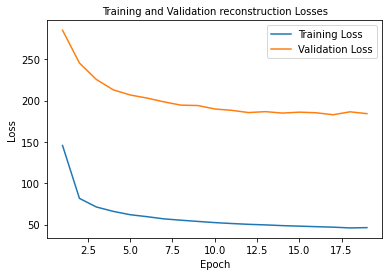

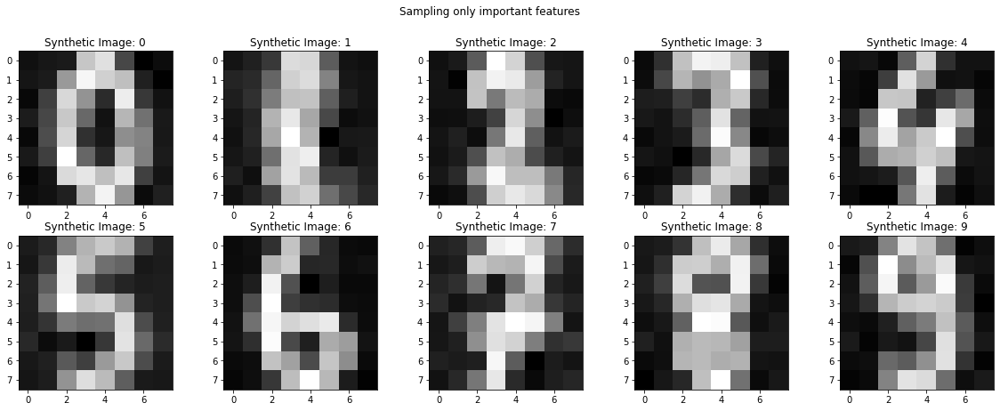

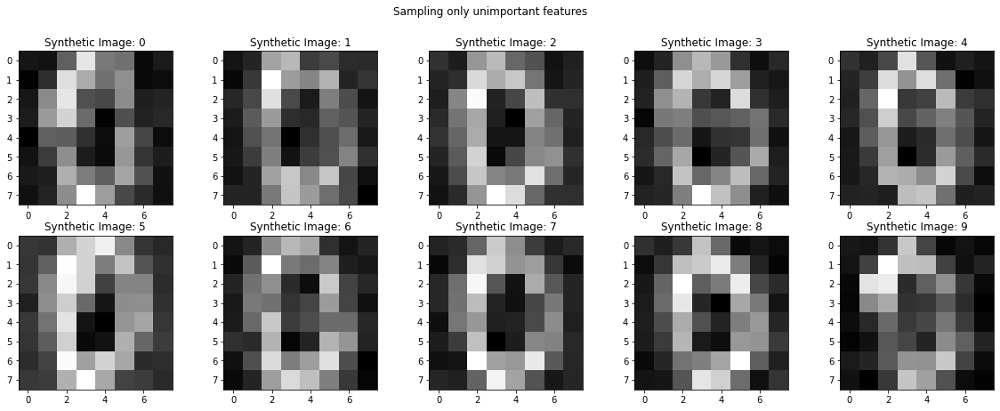


Training for k=8
Epoch 1/20, Training Loss: 12503657.154557291, Validation Loss: 57410.58361816406
Epoch 2/20, Training Loss: 2766.1257029215494, Validation Loss: 341.8003800710042
Epoch 3/20, Training Loss: 92.67972922854953, Validation Loss: 261.6807294686635
Epoch 4/20, Training Loss: 75.06449168523153, Validation Loss: 230.45265928904217
Epoch 5/20, Training Loss: 67.8765141805013, Validation Loss: 218.10639572143555
Epoch 6/20, Training Loss: 63.224973074595134, Validation Loss: 211.41110841433206
Epoch 7/20, Training Loss: 60.210762935214575, Validation Loss: 208.3572313785553
Epoch 8/20, Training Loss: 58.03645001517402, Validation Loss: 199.64385946591696
Epoch 9/20, Training Loss: 56.108029672834604, Validation Loss: 195.0037250916163
Epoch 10/20, Training Loss: 54.359071456061464, Validation Loss: 193.970672527949
Epoch 11/20, Training Loss: 53.008008819156224, Validation Loss: 192.40503108501434
Epoch 12/20, Training Loss: 51.81032321718004, Validation Loss: 190.76259569327

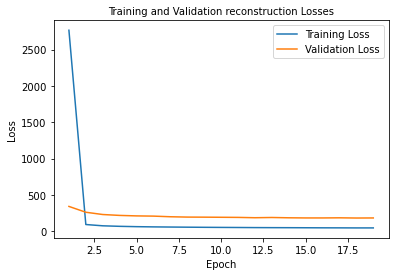

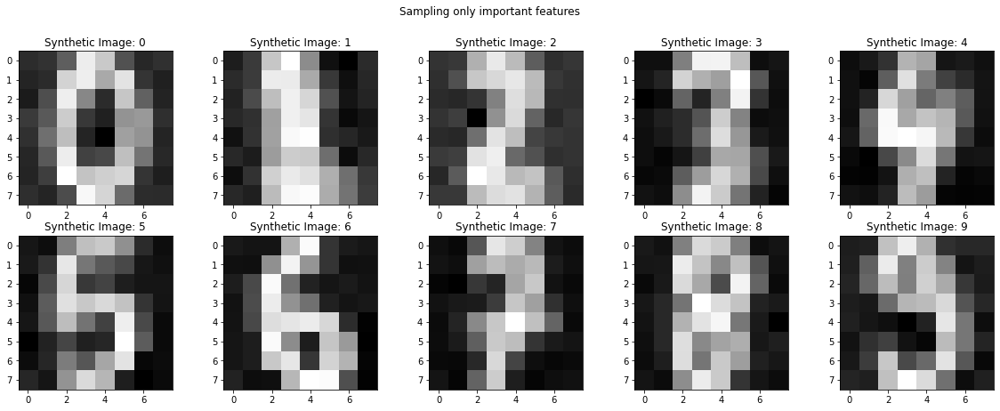

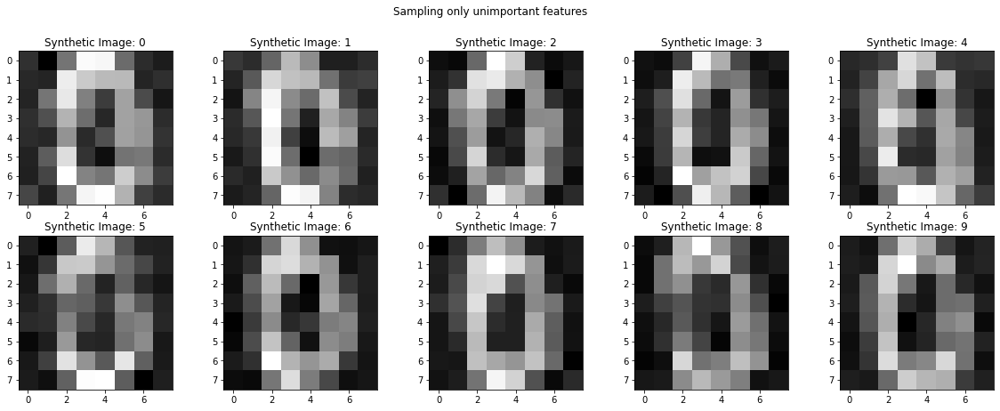

In [ ]:
k_values = [2,4,8]
dataset_percentage = 1.0

for k in k_values:
    print(f"\nTraining for k={k}")

    # Instantiate the model
    model = ConditionalRealNVP_bottleneck(input_size=64, hidden_size=100, blocks=10,condition_size=10,k=k)

    # Train the model
    train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_validate_conditional_nvp_bottleneck(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1)
    train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
    val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)
    # plotting the loss
    plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
    plt.show()

    ### plot the synthetic data
    conditions_all_labels = torch.eye(condition_size)
    synthetic_data=model.sample_only_important(num_samples=10,conditions= conditions_all_labels)
    visualize_synthetic_data(synthetic_data, title="Sampling only important features")

    conditions_first_elements = torch.zeros((10, 10))
    conditions_first_elements[:,0] = 1
    synthetic_data=model.sample_only_unimportant(num_samples=10, conditions=conditions_first_elements)
    visualize_synthetic_data(synthetic_data, title="Sampling only unimportant features")


Epoch 1/20, Training Loss: 21580.730417421128, Validation Loss: 297.31214563051856
Epoch 2/20, Training Loss: 83.47490584055582, Validation Loss: 243.01717726389566
Epoch 3/20, Training Loss: 71.68545961380005, Validation Loss: 224.35330470403036
Epoch 4/20, Training Loss: 65.9989339404636, Validation Loss: 214.9265724023183
Epoch 5/20, Training Loss: 62.00650640063815, Validation Loss: 203.16986227035522
Epoch 6/20, Training Loss: 59.44165139728122, Validation Loss: 200.70353790124258
Epoch 7/20, Training Loss: 57.68972770902845, Validation Loss: 196.80060239632925
Epoch 8/20, Training Loss: 55.89540031221178, Validation Loss: 196.14737010002136
Epoch 9/20, Training Loss: 54.81338379118178, Validation Loss: 193.17052300771078
Epoch 10/20, Training Loss: 53.11203460693359, Validation Loss: 190.24123994509378
Epoch 11/20, Training Loss: 52.03209048377143, Validation Loss: 187.1682772239049
Epoch 12/20, Training Loss: 51.64189916186862, Validation Loss: 189.73837987581888
Epoch 13/20, Tr

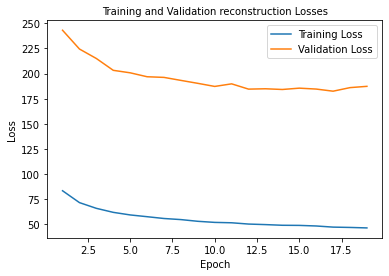

In [ ]:
# Instantiate the model
model = ConditionalRealNVP_bottleneck(input_size=64, hidden_size=100, blocks=10,condition_size=10,k=2)

# Train the model
train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_validate_conditional_nvp_bottleneck(model, train_loader, val_loader, num_epochs=20, lr=0.005, print_after=1)
train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)
# plotting the loss
plot_losses(train_losses[1:], val_losses[1:], want_log_scale=0)
plt.show()

Here the results from k = 2 look the best. We see that the generated images look like the numbers we tried to generate. Lets test the quality with a Random forest classifier

In [ ]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier(n_estimators=100)
rf_classifier.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
### plot the synthetic data
from sklearn.metrics import accuracy_score
ground_truth = torch.eye(condition_size).repeat(100,1)
ground_truth_labels = np.argmax(ground_truth, axis=1)
synthetic_data=model.sample(num_samples=1000,conditions=ground_truth)
print(synthetic_data.size())
predictions = rf_classifier.predict(synthetic_data)
accuracy = accuracy_score(ground_truth_labels, predictions)
print(f'Accuracy = {accuracy}')

torch.Size([1000, 64])
Accuracy = 0.868


We see the Random Forest Classifier achieves a reasonable accuracy of 0.87!

## 4.3 test

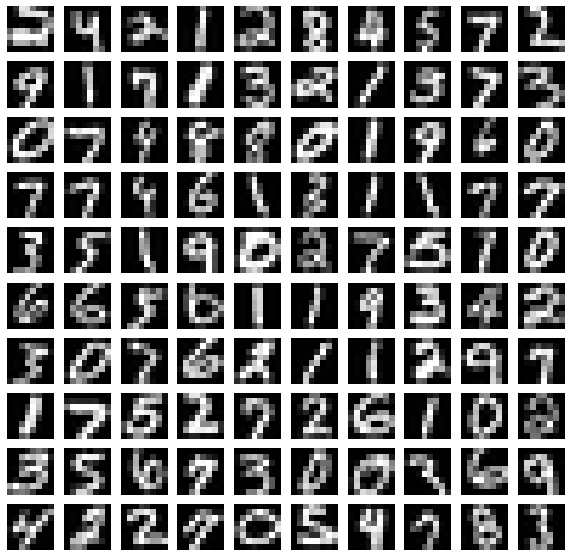

In [ ]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from PIL import Image, ImageFilter # install 'pillow ' to get PIL
import matplotlib.pyplot as plt
# define a functor to downsample images
class DownsampleTransform:
    def __init__ (self , target_shape , algorithm = Image.Resampling.LANCZOS):
        self.width, self.height = target_shape
        self.algorithm = algorithm
    def __call__ (self , img):
        img = img.resize(( self.width +2, self.height +2) , self.algorithm )
        img = img.crop((1 , 1, self.width +1, self.height +1))
        return img
# concatenate a few transforms
transform = transforms.Compose ([
    DownsampleTransform(target_shape =(8 ,8)),
    transforms.Grayscale(num_output_channels =1) ,
    transforms.ToTensor()
])
# download MNIST
mnist_dataset = datasets.MNIST( root ='./data', train =True ,
                                  transform = transform, download = True )
# create a DataLoader that serves minibatches of size 100
data_loader = DataLoader(mnist_dataset , batch_size =100 , shuffle = True )

mnist_test_dataset = datasets.MNIST( root ='./data', train =False ,
                                  transform = transform, download = True )
val_loader = DataLoader(mnist_test_dataset , batch_size =100 , shuffle = True )
# visualize the first batch of downsampled MNIST images
def show_first_batch(data_loader):
    for batch in data_loader:
        x, y = batch
        fig = plt.figure(figsize =(10 , 10))
        for i, img in enumerate(x):
            ax = fig.add_subplot(10 , 10, i+1)
            ax.imshow(img.reshape(8, 8), cmap ='gray')
            ax.axis('off')
        break



show_first_batch(data_loader)

In [ ]:
### training_the_conditional_nvp model

import torch.optim as optim
from torch.nn.utils import clip_grad_norm_

def train_and_validate_conditional_nvp(model, train_loader, val_loader, num_epochs=10, lr=0.001, print_after=1):
    """
    Train the ConditionalRealNVP model and evaluate on a validation dataset.

    Args:
    - model (ConditionalRealNVP): The ConditionalRealNVP model to be trained.
    - train_loader (DataLoader): DataLoader for the training dataset.
    - val_loader (DataLoader): DataLoader for the validation dataset.
    - num_epochs (int): Number of training epochs.
    - lr (float): Learning rate for the optimizer.
    - print_after (int): Number of epochs after which to print the training and validation loss.

    Returns:
    - train_losses (list): List of training losses for each epoch.
    - val_losses (list): List of validation losses for each epoch.
    """

    # Define the optimizer
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    train_losses_nll = []
    val_losses_nll = []
    train_losses_recons = []
    val_losses_recons = []
    # Training phase
    model.train()  # Set the model to training mode

    for epoch in range(num_epochs):
        total_train_loss_nll = 0.0
        total_train_loss_recons = 0.0

        for data, labels in train_loader:
            inputs = data.reshape(len(labels),64)
            conditions = one_hot(labels, num_classes=model.condition_size).float()

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass (encoding)
            encoded = model.forward_realnvp(inputs, conditions)

            train_loss_nll = calculate_loss(encoded, model.scaling_before_exp_list, len(train_loader))

            # Reconstruction loss calculation
            decoded = model.decode(encoded, conditions)
            train_loss_recons = mse_loss(inputs, decoded)

            # Backward pass (gradient computation)
            loss = train_loss_nll + train_loss_recons
            loss.backward()

            ### added recently: clip the gradients
            clip_grad_norm_(model.parameters(), max_norm=1.0)  # Adjust max_norm as needed

            # Update weights
            optimizer.step()

            total_train_loss_nll += train_loss_nll.item()
            total_train_loss_recons += train_loss_recons.item()

        # Average training loss for the epoch
        average_train_loss_nll = total_train_loss_nll / len(train_loader)
        average_train_loss_recons = total_train_loss_recons / len(train_loader)

        # Validation phase
        model.eval()  # Set the model to evaluation mode
        if val_loader is not None:
            total_val_loss_nll = 0.0
            total_val_loss_recons = 0.0
            with torch.no_grad():
                for val_data, val_labels in val_loader:
                    val_inputs = val_data.reshape(len(labels),64)
                    val_conditions = one_hot(val_labels, num_classes=model.condition_size).float()

                    # Forward pass (encoding) for validation
                    val_encoded = model.forward_realnvp(val_inputs, val_conditions)

                    # NLL Loss calculation
                    val_loss_nll = calculate_loss(val_encoded, model.scaling_before_exp_list, len(val_loader))

                    # Reconstruction loss calculation
                    decoded = model.decode(val_encoded, val_conditions)
                    val_loss_recons = mse_loss(val_inputs, decoded)

                    total_val_loss_nll += val_loss_nll.item()
                    total_val_loss_recons += val_loss_recons.item()

            # Average validation loss for the epoch
            average_val_loss_nll = total_val_loss_nll / len(val_loader)
            average_val_loss_recons = total_val_loss_recons / len(val_loader)

            # Print training and validation losses together
            if (epoch + 1) % print_after == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Training Loss: {average_train_loss_recons+average_train_loss_nll}, Validation Loss: {average_val_loss_nll+average_val_loss_recons}")

            # Append losses to the lists
            train_losses_nll.append(average_train_loss_nll)
            val_losses_nll.append(average_val_loss_nll)
            train_losses_recons.append(average_train_loss_recons)
            val_losses_recons.append(average_val_loss_recons)

    print("Training complete")

    return train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons

Epoch 1/10, Training Loss: -19.08519719739742, Validation Loss: -130.75578613281235
Epoch 2/10, Training Loss: -22.443291050592926, Validation Loss: -137.0801293945311
Epoch 3/10, Training Loss: -23.36428718566881, Validation Loss: -141.2957122802733
Epoch 4/10, Training Loss: -23.87661533991482, Validation Loss: -144.08587219238268
Epoch 5/10, Training Loss: -24.201026268005233, Validation Loss: -145.4849877929686
Epoch 6/10, Training Loss: -24.45872751235948, Validation Loss: -147.0356079101561
Epoch 7/10, Training Loss: -24.656676244735575, Validation Loss: -147.69472976684557
Epoch 8/10, Training Loss: -24.829769868850565, Validation Loss: -149.69698562622057
Epoch 9/10, Training Loss: -24.958654168446717, Validation Loss: -150.0165017700194
Epoch 10/10, Training Loss: -25.043524036407327, Validation Loss: -149.860236968994
Training complete


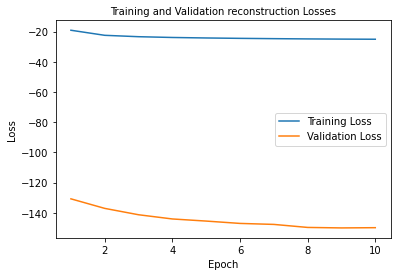

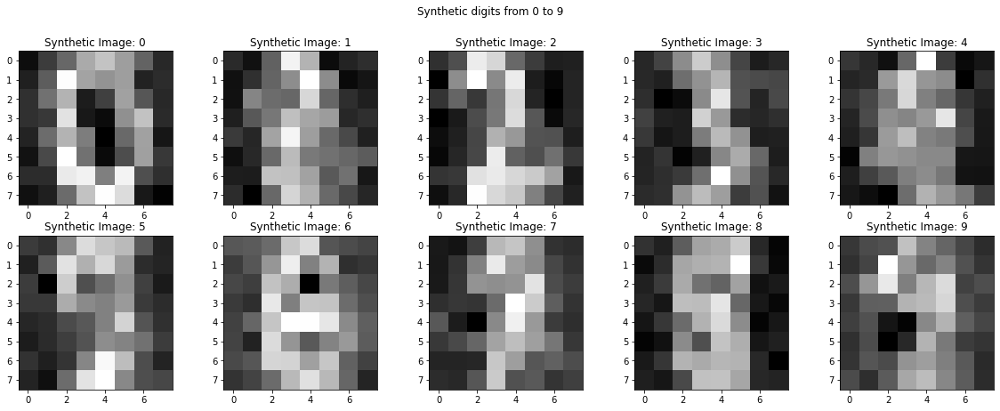

In [ ]:
input_size = 64
hidden_size = 100
blocks = 10
print_after=1
dataset_percentage = 1.0
batch_size=100

# Instantiate the model
model = ConditionalRealNVP(input_size=64, hidden_size=100, blocks=10,condition_size=10)

# Train the model
train_losses_nll, train_losses_recons, val_losses_nll, val_losses_recons = train_and_validate_conditional_nvp(model, data_loader, val_loader, num_epochs=10, lr=0.005, print_after=1)
train_losses = np.array(train_losses_nll) + np.array(train_losses_recons)
val_losses = np.array(val_losses_nll) + np.array(val_losses_recons)

# plotting the loss
plot_losses(train_losses, val_losses, want_log_scale=0)
plt.show()


### plot the synthetic data
conditions_all_labels = torch.eye(condition_size)
synthetic_data=conditional_inn_model.sample(num_samples=10, conditions= conditions_all_labels)
visualize_synthetic_data(synthetic_data,title="Synthetic digits from 0 to 9")
plt.show()

This using the MNIST dataset yields far worse results than the bottleneck approach,but this might be because longer training is needed.